
# Analysis Data PFT Scanner Pilots

In [12]:
from IPython.display import Image
from ast import literal_eval
import random


## Load data and relevant variables participants
 --------


In [13]:
data_exp1 = pd.read_csv('/Users/pradyumna/OneDrive - University College London/PhD Projects/PFT_MRI_Experiment/Scanner Pilot/All_Behavioral/PFT_Choice_ScanPart_All.csv') 
data_exp_ratings_2 = pd.read_csv('/Users/pradyumna/OneDrive - University College London/PhD Projects/PFT_MRI_Experiment/Scanner Pilot/All_Behavioral/PFT_idRatingsFrame_ScanPart_All.csv') 

In [14]:
# Insert to exclude particitipants
excludedPart = []
for i in excludedPart:
    data_exp1 = data_exp1[(data_exp1.Part != i)]
    data_exp_ratings_2 = data_exp_ratings_2[(data_exp_ratings_2.Part != i)]
print (data_exp1["Part"].unique())
print ('Number of participants: ' + str(len(data_exp1["Part"].unique())))

[ 3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25]
Number of participants: 23


In [15]:
data_exp1.columns

Index(['trial', 'leftId', 'rightId', 'frame', 'endTime', 'choice',
       'choiceTime', 'LRat1', 'RRat1', 'LRat2', 'RRat2', 'LVar1', 'RVar1',
       'LVar2', 'RVar2', 'Part', 'trialOnset', 'trialOnsetTim', 'trialSnd1Tim',
       'trialSnd2Tim', 'trialThinkTime', 'trialRespTime', 'trialEnd',
       'primerSound', 'part', 'session'],
      dtype='object')

In [16]:
data_exp1

,trial,leftId,rightId,frame,endTime,choice,choiceTime,LRat1,RRat1,LRat2,...,trialOnset,trialOnsetTim,trialSnd1Tim,trialSnd2Tim,trialThinkTime,trialRespTime,trialEnd,primerSound,part,session
0,0.0,6.0,2.0,2.0,NaN,1.0,6.394748,1.666667,2.333333,2.833333,...,122.379519,0.008605,1.020741,1.521760,3.507088,3.507591,10.013129,2.0,3.0,0.0
1,1.0,5.0,6.0,1.0,NaN,1.0,4.217651,1.500000,1.666667,2.666667,...,132.529415,0.010511,1.030361,1.531569,3.515307,3.515657,11.006220,1.0,3.0,0.0
2,2.0,6.0,2.0,1.0,NaN,1.0,5.529628,1.666667,2.333333,2.833333,...,144.129619,0.006901,1.023841,1.525057,3.508854,3.509187,12.000181,2.0,3.0,0.0
3,3.0,5.0,6.0,2.0,NaN,-1.0,3.821031,1.500000,1.666667,2.666667,...,157.180464,0.006823,1.034679,1.535908,3.501897,3.502245,12.010674,1.0,3.0,0.0
4,4.0,5.0,2.0,1.0,NaN,1.0,3.865194,1.500000,2.333333,2.666667,...,187.631265,0.007589,1.038964,1.540185,3.510868,3.511215,10.001466,1.0,3.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3307,19.0,2.0,1.0,2.0,NaN,-1.0,3.961115,2.333333,2.833333,2.666667,...,479.261083,0.007347,1.024942,1.525586,3.509831,3.510053,12.001256,2.0,25.0,5.0
3308,20.0,2.0,1.0,1.0,NaN,1.0,3.922555,2.333333,2.833333,2.666667,...,492.311779,0.007289,1.018823,1.519269,3.503608,3.503947,12.014201,1.0,25.0,5.0
3309,21.0,2.0,6.0,2.0,NaN,-1.0,4.158544,2.333333,3.666667,2.666667,...,514.061832,0.007029,1.037147,1.537646,3.505666,3.505866,11.012359,2.0,25.0,5.0
3310,22.0,1.0,2.0,2.0,NaN,1.0,4.000517,2.833333,2.333333,2.333333,...,525.662688,0.007315,1.016694,1.516861,3.514951,3.515166,12.005421,1.0,25.0,5.0


In [17]:
data_exp_ratings_2

,nameId,rat1,rat2,var1,var2,Part,AllRatings1,AllRatings2
0,2.0,2.333333,2.666667,0.516398,0.516398,3,[3. 2. 3. 2. 2. 2.],[3. 2. 2. 3. 3. 3.]
1,5.0,1.500000,2.666667,0.547723,0.816497,3,[1. 1. 2. 2. 1. 2.],[2. 3. 2. 2. 3. 4.]
2,1.0,3.333333,1.833333,0.816497,0.752773,3,[4. 3. 4. 2. 3. 4.],[2. 1. 1. 3. 2. 2.]
3,6.0,1.666667,2.833333,0.516398,0.752773,3,[2. 2. 2. 2. 1. 1.],[2. 2. 3. 3. 4. 3.]
4,2.0,3.333333,2.500000,0.516398,0.547723,4,[4. 3. 3. 3. 4. 3.],[2. 2. 3. 3. 2. 3.]
...,...,...,...,...,...,...,...,...
87,6.0,2.666667,2.000000,0.516398,0.894427,24,[3. 3. 2. 3. 2. 3.],[3. 2. 3. 2. 1. 1.]
88,2.0,2.333333,2.666667,1.032796,1.032796,25,[3. 1. 2. 4. 2. 2.],[4. 2. 3. 1. 3. 3.]
89,5.0,3.500000,2.000000,0.547723,0.632456,25,[3. 4. 4. 3. 3. 4.],[1. 2. 3. 2. 2. 2.]
90,1.0,2.833333,2.333333,1.169045,1.211060,25,[2. 1. 3. 3. 4. 4.],[3. 4. 2. 3. 1. 1.]


In [18]:
data_exp1=data_exp1.rename(index=str, columns={"choiceTime":"RT", })

## drop NaNs from choice rows

In [19]:
#data_exp1 = data_exp1.dropna(axis = 0, how ='any') 
#data_exp_ratings_2 = data_exp_ratings_2.dropna(axis = 0, how ='any') 

In [20]:
data_exp1 = data_exp1.reset_index()
data_exp_ratings_2 = data_exp_ratings_2.reset_index()

## add extra value information

In [21]:
data_exp1["TotVal1"] = data_exp1['RRat1']+ data_exp1['LRat1']
data_exp1["TotVal2"] = data_exp1['RRat2']+ data_exp1['LRat2']


data_exp1["DVal1"] = data_exp1['RRat1'] - data_exp1['LRat1']
data_exp1["absDVal1"] = np.abs(data_exp1["DVal1"] )

data_exp1["DVar1"] = data_exp1['RVar1'] - data_exp1['LVar1']
data_exp1["absDVar1"] = np.abs(data_exp1["DVar1"] )

data_exp1["DVal2"] = data_exp1['RRat2'] - data_exp1['LRat2']
data_exp1["absDVal2"] = np.abs(data_exp1["DVal2"] )

data_exp1["DVar2"] = data_exp1['RVar2'] - data_exp1['LVar2']
data_exp1["absDVar2"] = np.abs(data_exp1["DVar2"] )

## add z-scores

In [22]:
data_exp1["zDVal1"] = z_score1(data_exp1,'Part',"DVal1")
data_exp1["zabsDVal1"] = z_score1(data_exp1,'Part',"absDVal1")

data_exp1["zDVal2"] = z_score1(data_exp1,'Part',"DVal2")
data_exp1["zabsDVal2"] = z_score1(data_exp1,'Part',"absDVal2")

data_exp1["zDVar1"] = z_score1(data_exp1,'Part',"DVar1")
data_exp1["zabsDVar1"] = z_score1(data_exp1,'Part',"absDVar1")

data_exp1["zDVar2"] = z_score1(data_exp1,'Part',"DVar2")
data_exp1["zabsDVar2"] = z_score1(data_exp1,'Part',"absDVar2")

data_exp1["zTotVal1"] = z_score1(data_exp1,'Part',"TotVal1")
data_exp1["zTotVal2"] = z_score1(data_exp1,'Part',"TotVal2")
data_exp1["zRT"] = z_score1(data_exp1,'Part',"RT")

## correct option according to rating given in frame 1

In [23]:
Correct = []
for i in range(len(data_exp1)):
    if data_exp1.frame[i] == 1:
        if (data_exp1.choice[i] == 1 and (data_exp1.LRat1[i] <= data_exp1.RRat1[i])) or (data_exp1.choice[i] == -1 and (data_exp1.LRat1[i] >= data_exp1.RRat1[i])):
            Correct.append(1)
        else:
            Correct.append(0)
    if data_exp1.frame[i] == 2:
        if (data_exp1.choice[i] == 1 and (data_exp1.LRat1[i] >= data_exp1.RRat1[i])) or (data_exp1.choice[i] == -1 and (data_exp1.LRat1[i] <= data_exp1.RRat1[i])):
            Correct.append(1)
        else:
            Correct.append(0)

data_exp1["correct1"] = Correct

## correct option according to rating given in frame 2

In [24]:
Correct = []
for i in range(len(data_exp1)):
    if data_exp1.frame[i] == 1:
        if (data_exp1.choice[i] == 1 and (data_exp1.LRat2[i] >= data_exp1.RRat2[i])) or (data_exp1.choice[i] == -1 and (data_exp1.LRat2[i] <= data_exp1.RRat2[i])):
            Correct.append(1)
        else:
            Correct.append(0)
    if data_exp1.frame[i] == 2:
        if (data_exp1.choice[i] == 1 and (data_exp1.LRat2[i] <= data_exp1.RRat2[i])) or (data_exp1.choice[i] == -1 and (data_exp1.LRat2[i] >= data_exp1.RRat2[i])):
            Correct.append(1)
        else:
            Correct.append(0)

data_exp1["correct2"] = Correct

## change choices from -1 to 0 for left

In [25]:
choices = []
for i in range(len(data_exp1)):
        if (data_exp1.choice[i] == 1):
            choices.append(1)
        else:
            choices.append(0)

data_exp1["choices"] = choices

In [26]:
data_exp1

,index,trial,leftId,rightId,frame,endTime,choice,RT,LRat1,RRat1,...,zDVar1,zabsDVar1,zDVar2,zabsDVar2,zTotVal1,zTotVal2,zRT,correct1,correct2,choices
0,0,0.0,6.0,2.0,2.0,NaN,1.0,6.394748,1.666667,2.333333,...,-5.355114e-16,-1.148483,-1.263697,0.772954,-0.500835,1.107823,3.183484,0,0,1
1,1,1.0,5.0,6.0,1.0,NaN,1.0,4.217651,1.500000,1.666667,...,-1.521503e-01,-0.916784,-0.340678,-0.772954,-1.502506,1.107823,0.056447,1,0,1
2,2,2.0,6.0,2.0,1.0,NaN,1.0,5.529628,1.666667,2.333333,...,-5.355114e-16,-1.148483,-1.263697,0.772954,-0.500835,1.107823,1.940884,1,1,1
3,3,3.0,5.0,6.0,2.0,NaN,-1.0,3.821031,1.500000,1.666667,...,-1.521503e-01,-0.916784,-0.340678,-0.772954,-1.502506,1.107823,-0.513232,1,0,0
4,4,4.0,5.0,2.0,1.0,NaN,1.0,3.865194,1.500000,2.333333,...,-1.521503e-01,-0.916784,-1.604375,1.343534,-0.701170,0.738549,-0.449799,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3307,3307,19.0,2.0,1.0,2.0,NaN,-1.0,3.961115,2.333333,2.833333,...,2.890113e-01,-1.140141,0.234743,-1.398499,-1.623005,1.388730,-0.686258,1,1,0
3308,3308,20.0,2.0,1.0,1.0,NaN,1.0,3.922555,2.333333,2.833333,...,2.890113e-01,-1.140141,0.234743,-1.398499,-1.623005,1.388730,-0.767484,1,1,1
3309,3309,21.0,2.0,6.0,2.0,NaN,-1.0,4.158544,2.333333,3.666667,...,-1.095377e+00,0.459679,-1.360008,1.020707,-0.270501,-0.462910,-0.270383,1,1,0
3310,3310,22.0,1.0,2.0,2.0,NaN,1.0,4.000517,2.833333,2.333333,...,-2.890113e-01,-1.140141,-0.234743,-1.398499,-1.623005,1.388730,-0.603259,1,1,1


## Rating data analysis for both frames
------------------------
## frame 1: like / frame 2: dislike
## pet number id: 1:dog ; 2:cat ; 5:parrot ; 6: hamster

###  1. mean rating in both frames (rat1 : rating in like frame ; rat2: rating in dislike frame)


In [27]:
#sns.set(font_scale=1.5, style='white')
#ax = data_exp_ratings_2.loc[(data_exp_ratings_2['Part'] == 1)].plot.bar(x='nameId',y=['rat1','rat2'], figsize=(20,5), )
#plt.suptitle('Participant ' + str(1), fontsize = 25)#

#sns.despine()

In [28]:
data_exp_ratings_2

,index,nameId,rat1,rat2,var1,var2,Part,AllRatings1,AllRatings2
0,0,2.0,2.333333,2.666667,0.516398,0.516398,3,[3. 2. 3. 2. 2. 2.],[3. 2. 2. 3. 3. 3.]
1,1,5.0,1.500000,2.666667,0.547723,0.816497,3,[1. 1. 2. 2. 1. 2.],[2. 3. 2. 2. 3. 4.]
2,2,1.0,3.333333,1.833333,0.816497,0.752773,3,[4. 3. 4. 2. 3. 4.],[2. 1. 1. 3. 2. 2.]
3,3,6.0,1.666667,2.833333,0.516398,0.752773,3,[2. 2. 2. 2. 1. 1.],[2. 2. 3. 3. 4. 3.]
4,4,2.0,3.333333,2.500000,0.516398,0.547723,4,[4. 3. 3. 3. 4. 3.],[2. 2. 3. 3. 2. 3.]
...,...,...,...,...,...,...,...,...,...
87,87,6.0,2.666667,2.000000,0.516398,0.894427,24,[3. 3. 2. 3. 2. 3.],[3. 2. 3. 2. 1. 1.]
88,88,2.0,2.333333,2.666667,1.032796,1.032796,25,[3. 1. 2. 4. 2. 2.],[4. 2. 3. 1. 3. 3.]
89,89,5.0,3.500000,2.000000,0.547723,0.632456,25,[3. 4. 4. 3. 3. 4.],[1. 2. 3. 2. 2. 2.]
90,90,1.0,2.833333,2.333333,1.169045,1.211060,25,[2. 1. 3. 3. 4. 4.],[3. 4. 2. 3. 1. 1.]


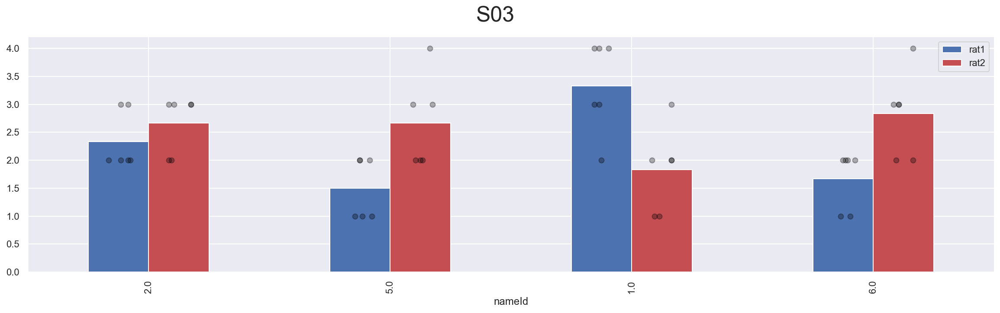

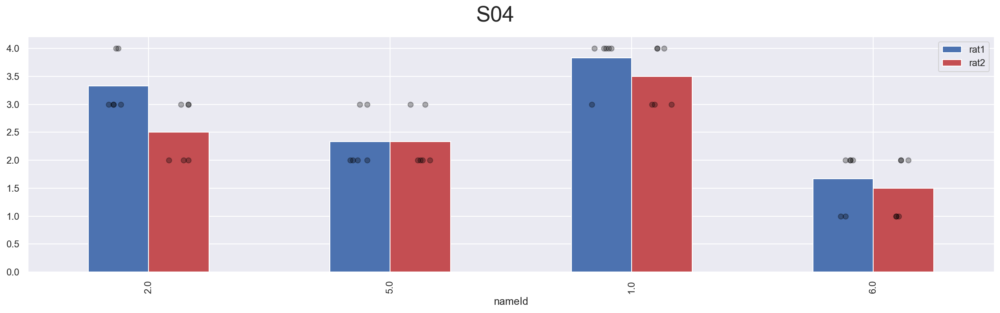

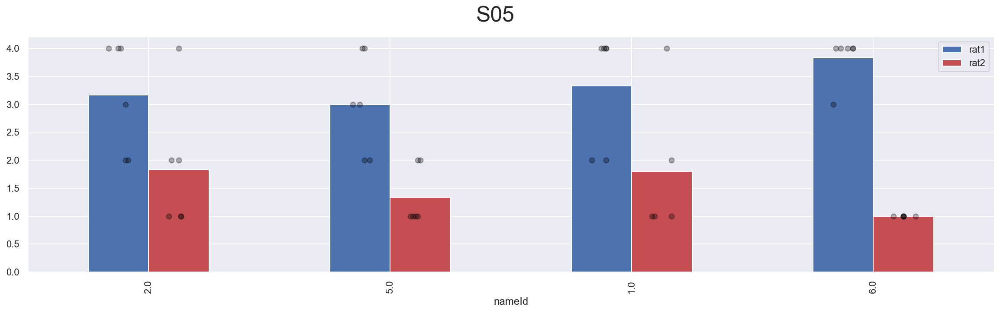

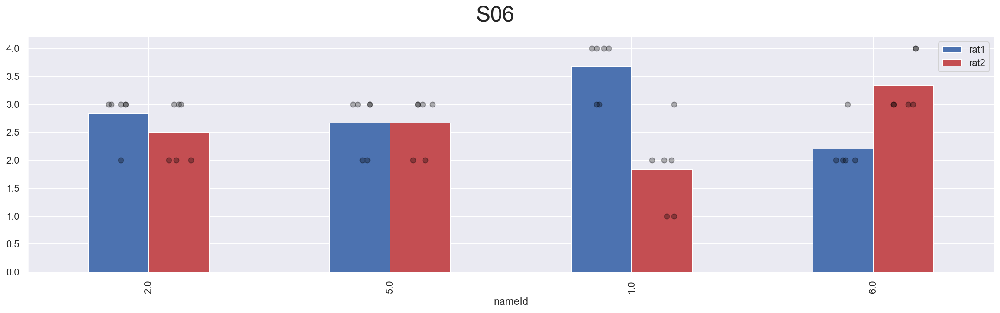

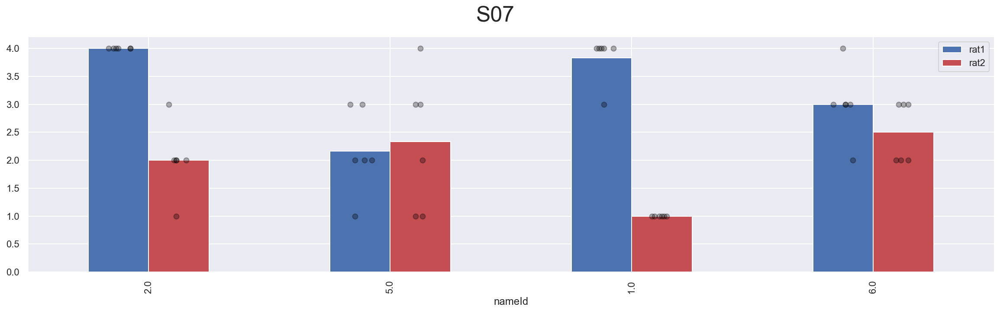

...

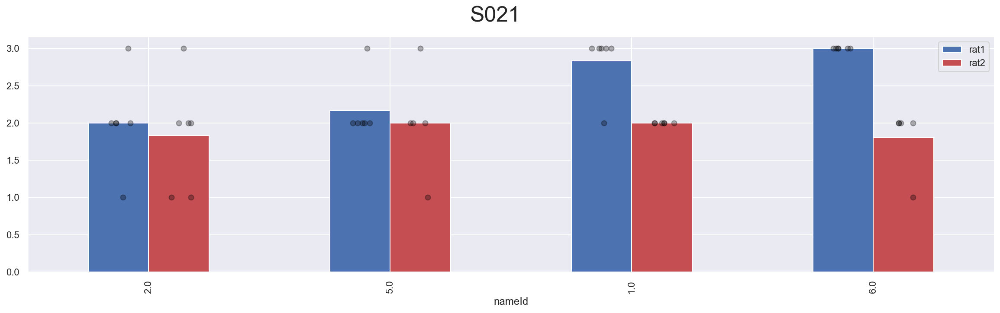

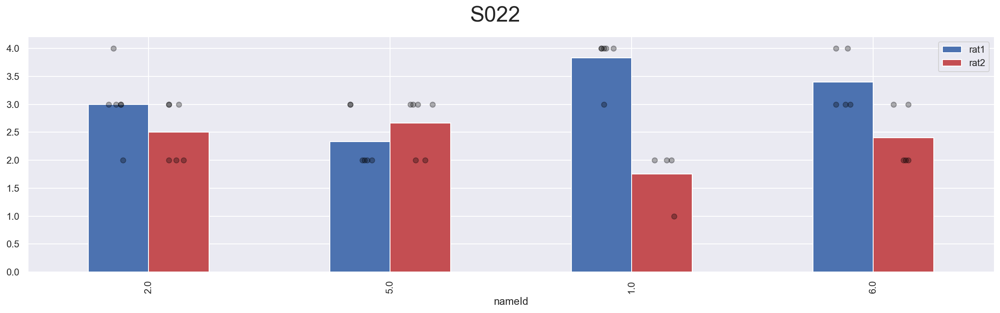

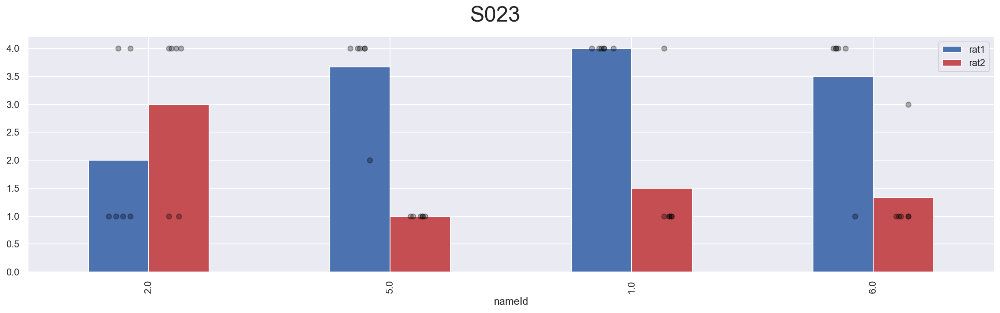

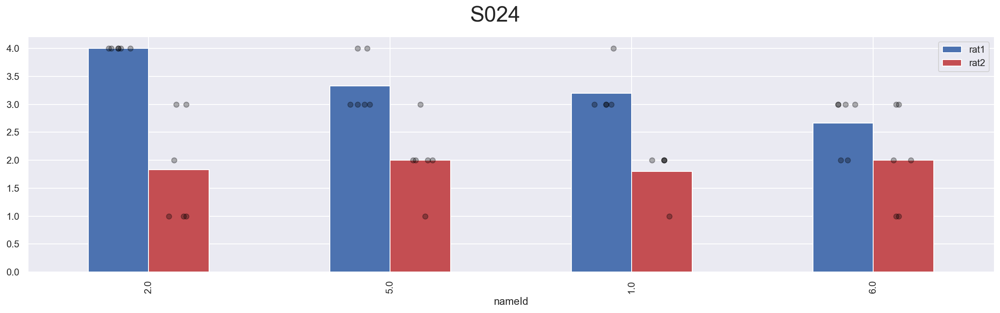

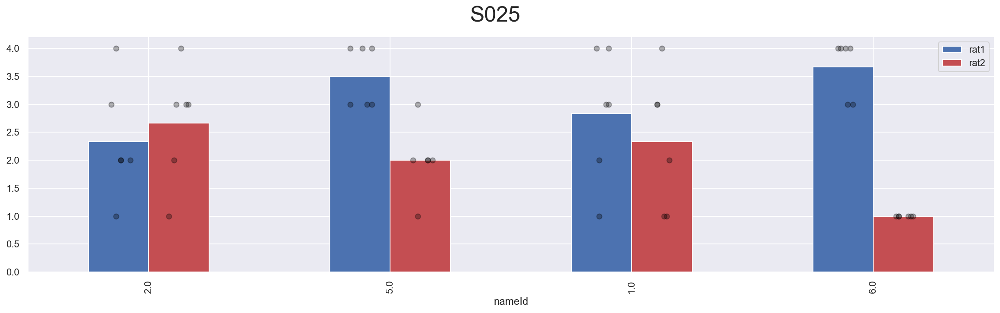

In [29]:
#sns.set(font_scale=1.5, style='white')


for part in data_exp1["Part"].unique(): 
    ax = data_exp_ratings_2.loc[(data_exp_ratings_2['Part'] == part)].plot.bar(x='nameId',y=['rat1','rat2'], figsize=(20,5), color = ['b','r'],zorder=1)
    
    
    for i in range(len(data_exp_ratings_2.loc[(data_exp_ratings_2['Part'] == 3)].nameId.unique())):
        # for like
        ratings = data_exp_ratings_2.loc[(data_exp_ratings_2['Part'] == part)].AllRatings1.values[i][1:-2].split('.')
        ratings = [int(i) for i in ratings]    
        ax.scatter(np.subtract([i-0.125]*len(ratings), np.divide([random.randrange(-5, 5,1) for iter in range(len(ratings))], 100)),ratings, color='black', alpha=0.3, label = 'Like',zorder=2)
        # for dislike
        ratings = data_exp_ratings_2.loc[(data_exp_ratings_2['Part'] == part)].AllRatings2.values[i][1:-2].split('.')
        ratings = [int(i) for i in ratings]
        ax.scatter(np.subtract([i+0.125]*len(ratings), np.divide([random.randrange(-5, 5,1) for iter in range(len(ratings))], 100)),ratings, color='black', alpha=0.3, label = 'Dislike',zorder=2)
        
    plt.suptitle('S0' + str(part), fontsize = 25)
    
    sns.despine()
    plt.show()

## 2.reaction times for each participant in frame 1 (blue) and 2 (red)
### substract time till the response is available (raw RT in this case is the time from the beginning of the trial, which includes the sound stimuli)

participant: 0
RT frame 1: 0.7009877026666533
RT frame 2: 0.6566592079722113
participant: 1
RT frame 1: 0.4827509552917113
RT frame 2: 0.46979956605549766
participant: 2
RT frame 1: 0.5362393177713658
RT frame 2: 0.6110881041804026
participant: 3
RT frame 1: 0.9375675918888708
RT frame 2: 0.9824618607639071
participant: 4
RT frame 1: 0.8228576462916077
RT frame 2: 0.9487708636337198
participant: 5
RT frame 1: 0.4571078296805431
RT frame 2: 0.47581153205560955
participant: 6
RT frame 1: 0.6639819653195342
RT frame 2: 0.7626382734444581
participant: 7
RT frame 1: 0.5024040159167003
RT frame 2: 0.6230395852638821
participant: 8
RT frame 1: 0.4583658637500698
RT frame 2: 0.4639035050832945
participant: 9
RT frame 1: 0.4881985230277275
RT frame 2: 0.42836000248615225
participant: 10
RT frame 1: 0.632365590569476
RT frame 2: 0.61564972002778
participant: 11
RT frame 1: 0.5211088830416584
RT frame 2: 0.6696809363194989
participant: 12
RT frame 1: 0.5929996273888873
RT frame 2: 0.5483888934862

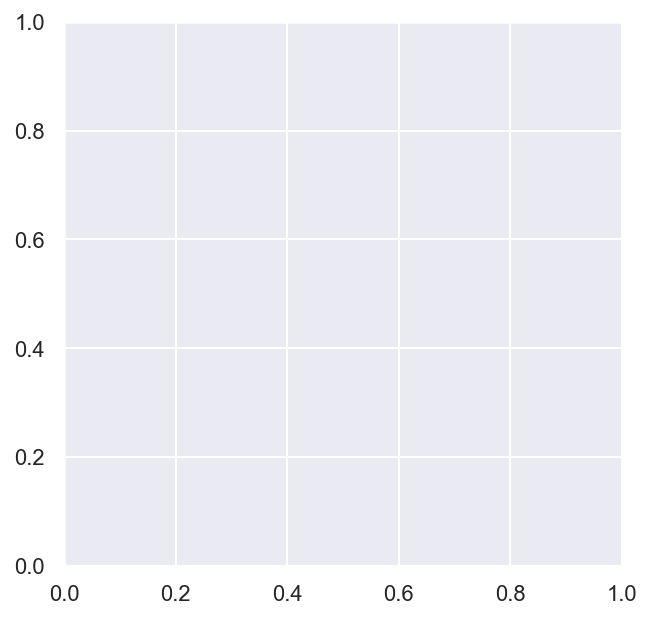

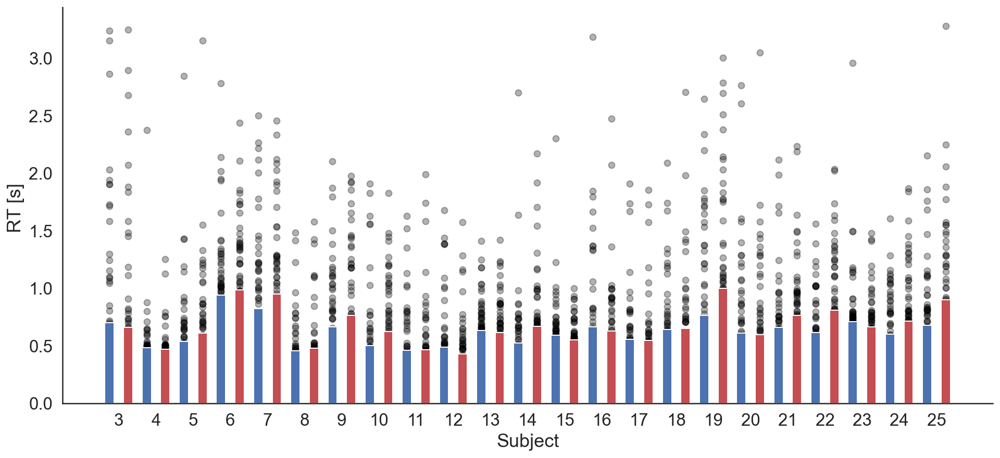

In [30]:
fig, ax = plt.subplots()
figure(figsize=(16,7))

sns.set(font_scale=1.5, style='white')

width = 0.25
#partNames = data_exp1.Part.unique()
partNames = range(3, 3+len(data_exp1["Part"].unique()))



for i in np.arange(len(partNames)):
    RT1 = data_exp1.loc[(data_exp1['Part'] == partNames[i]) & (data_exp1['frame'] == 1) ].RT-3.5
    RT2 = data_exp1.loc[(data_exp1['Part'] == partNames[i]) & (data_exp1['frame'] == 2) ].RT-3.5

    RT_mean1 = data_exp1.loc[(data_exp1['Part'] == partNames[i]) & (data_exp1['frame'] == 1) ].RT.mean()-3.5
    RT_mean2 = data_exp1.loc[(data_exp1['Part'] == partNames[i]) & (data_exp1['frame'] == 2) ].RT.mean()-3.5
    print ('participant: ' + str(i))
    print ('RT frame 1: ' + str(RT_mean1))
    print ('RT frame 2: ' + str(RT_mean2))

    plt.bar(i-0.25, RT_mean1,width,color='b', label = 'Like')

    plt.scatter([i-0.25]*len(RT1),RT1 ,color='black', alpha=0.3, marker='o', label = 'Like')


    plt.bar(i+0.25, RT_mean2,width,color='r', label = 'Dislike')
    plt.scatter([i+0.25]*len(RT2),RT2 ,color='black', alpha=0.3, marker='o', label = 'Dislike')

plt.xticks(range(len(partNames)), partNames)
plt.xlabel("Subject")
plt.ylabel("RT [s] ")
#plt.xticks([i-0.5,i+0.5],["Like ","Dislike"], rotation=0, fontsize=25)
#plt.legend()
sns.despine()

## 3. participant densities rate 

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element po

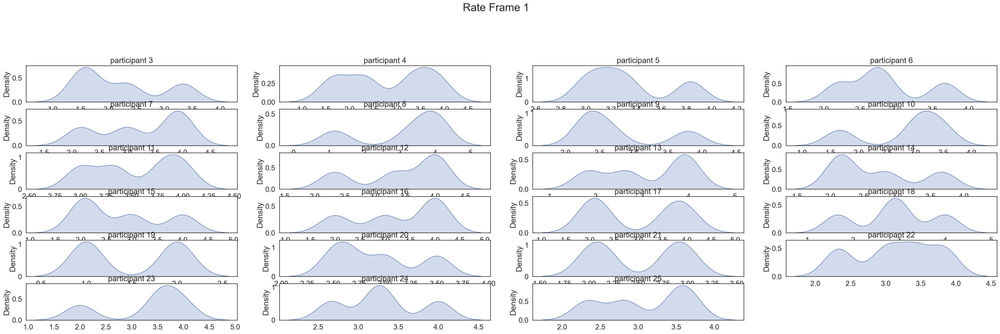

In [31]:
participant_densities(data_exp1,'RRat1', title = 'Rate Frame 1')

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element po

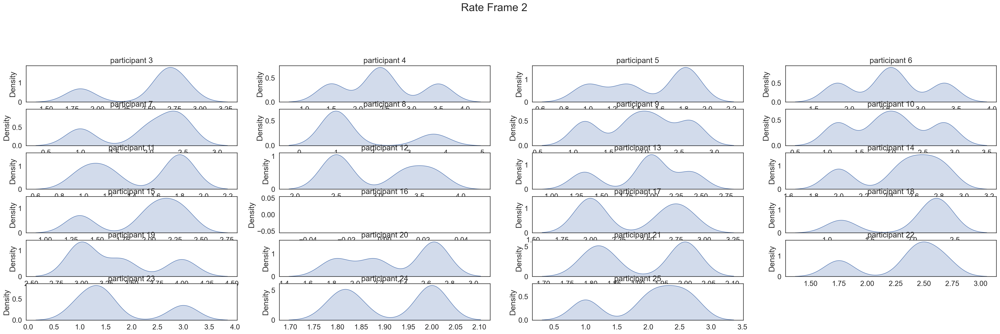

In [32]:
participant_densities(data_exp1,'RRat2', title = 'Rate Frame 2 ')

## 4. participants densities variability 
## (variability corresponds to the standard deviation of the ratings for each pet)

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element po

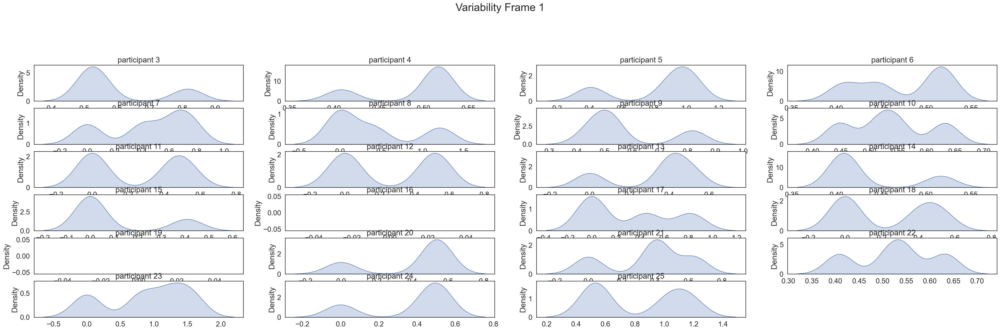

In [33]:
participant_densities(data_exp1,'RVar1', title = 'Variability Frame 1')

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element po

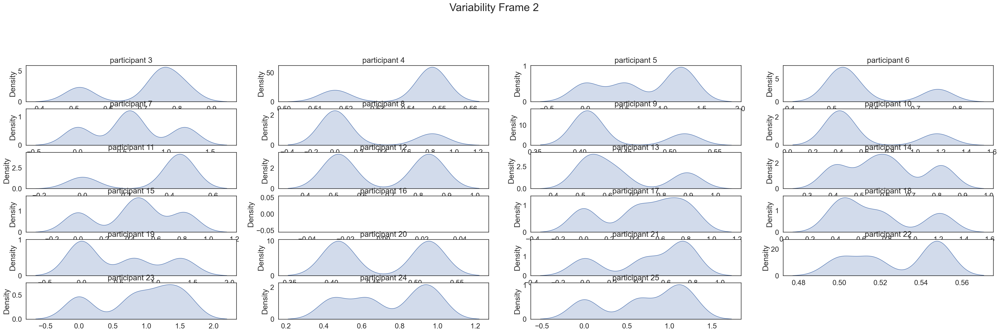

In [34]:
participant_densities(data_exp1,'RVar2', title = 'Variability Frame 2')

## 5. pet ratings in both frames
### each dot corresponds to a pet (4 pets) for each participant (3 participant)

In [35]:
data_exp_ratings_2

,index,nameId,rat1,rat2,var1,var2,Part,AllRatings1,AllRatings2
0,0,2.0,2.333333,2.666667,0.516398,0.516398,3,[3. 2. 3. 2. 2. 2.],[3. 2. 2. 3. 3. 3.]
1,1,5.0,1.500000,2.666667,0.547723,0.816497,3,[1. 1. 2. 2. 1. 2.],[2. 3. 2. 2. 3. 4.]
2,2,1.0,3.333333,1.833333,0.816497,0.752773,3,[4. 3. 4. 2. 3. 4.],[2. 1. 1. 3. 2. 2.]
3,3,6.0,1.666667,2.833333,0.516398,0.752773,3,[2. 2. 2. 2. 1. 1.],[2. 2. 3. 3. 4. 3.]
4,4,2.0,3.333333,2.500000,0.516398,0.547723,4,[4. 3. 3. 3. 4. 3.],[2. 2. 3. 3. 2. 3.]
...,...,...,...,...,...,...,...,...,...
87,87,6.0,2.666667,2.000000,0.516398,0.894427,24,[3. 3. 2. 3. 2. 3.],[3. 2. 3. 2. 1. 1.]
88,88,2.0,2.333333,2.666667,1.032796,1.032796,25,[3. 1. 2. 4. 2. 2.],[4. 2. 3. 1. 3. 3.]
89,89,5.0,3.500000,2.000000,0.547723,0.632456,25,[3. 4. 4. 3. 3. 4.],[1. 2. 3. 2. 2. 2.]
90,90,1.0,2.833333,2.333333,1.169045,1.211060,25,[2. 1. 3. 3. 4. 4.],[3. 4. 2. 3. 1. 1.]


In [36]:
data_exp_ratings_2.loc[(data_exp_ratings_2['Part'] == 3)]

,index,nameId,rat1,rat2,var1,var2,Part,AllRatings1,AllRatings2
0,0,2.0,2.333333,2.666667,0.516398,0.516398,3,[3. 2. 3. 2. 2. 2.],[3. 2. 2. 3. 3. 3.]
1,1,5.0,1.500000,2.666667,0.547723,0.816497,3,[1. 1. 2. 2. 1. 2.],[2. 3. 2. 2. 3. 4.]
2,2,1.0,3.333333,1.833333,0.816497,0.752773,3,[4. 3. 4. 2. 3. 4.],[2. 1. 1. 3. 2. 2.]
3,3,6.0,1.666667,2.833333,0.516398,0.752773,3,[2. 2. 2. 2. 1. 1.],[2. 2. 3. 3. 4. 3.]


/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  
/Users/pradyumna/anacond

Pearson's r = -0.912 p =  0.088
Pearson's r = 0.934 p =  0.066
Pearson's r = -0.579 p =  0.421
Pearson's r = -0.985 p =  0.015
Pearson's r = -0.628 p =  0.372
Pearson's r = -0.972 p =  0.028
Pearson's r = -0.916 p =  0.084
Pearson's r = -0.926 p =  0.074
Pearson's r = -0.954 p =  0.046
Pearson's r = -0.555 p =  0.445
Pearson's r = 0.491 p =  0.509


/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:4023: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/pradyumna/anaconda3/lib/pytho

Pearson's r = -0.831 p =  0.169
Pearson's r = -0.951 p =  0.049
Pearson's r = nan p =  nan
Pearson's r = -0.963 p =  0.037
Pearson's r = -0.828 p =  0.172
Pearson's r = -0.855 p =  0.145
Pearson's r = -0.977 p =  0.023
Pearson's r = -0.106 p =  0.894
Pearson's r = -0.885 p =  0.115
Pearson's r = -0.917 p =  0.083
Pearson's r = -0.551 p =  0.449


/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  


Pearson's r = -0.877 p =  0.123


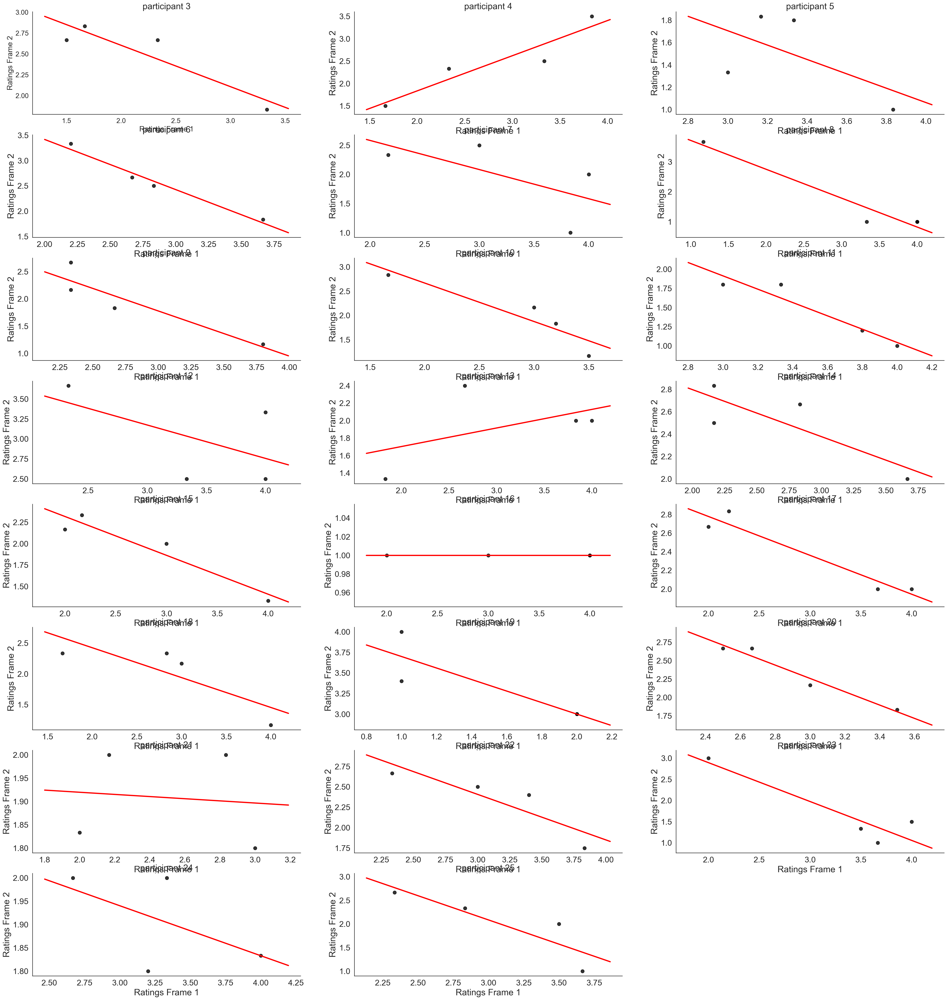

In [37]:
#corrPlotSimple(data_exp_ratings_2, 'rat1','Ratings Frame 1','rat2','Ratings Frame 2')
fig = figure(figsize=(40,60))
order = 1
for part in data_exp1["Part"].unique(): 
    sub={}
    sub['%s' % part] =plt.subplot(len(data_exp1["Part"].unique())/2, 3, order)
    corrPlotPart(data_exp_ratings_2.loc[(data_exp_ratings_2['Part'] == part)], 'rat1','Ratings Frame 1','rat2','Ratings Frame 2', title = 'S0'+str(part))
    #sub['%s' % part].set_title('participant %s' % part)
    sub['%s' % part].set_title('participant %s' % part)

    order += 1


    

Pearson's r = -0.912 p =  0.088
Pearson's r = 0.934 p =  0.066
Pearson's r = -0.579 p =  0.421
Pearson's r = -0.985 p =  0.015
Pearson's r = -0.628 p =  0.372
Pearson's r = -0.972 p =  0.028
Pearson's r = -0.916 p =  0.084
Pearson's r = -0.926 p =  0.074
Pearson's r = -0.954 p =  0.046
Pearson's r = -0.555 p =  0.445
Pearson's r = 0.491 p =  0.509
Pearson's r = -0.831 p =  0.169
Pearson's r = -0.951 p =  0.049
Pearson's r = nan p =  nan
Pearson's r = -0.963 p =  0.037
Pearson's r = -0.828 p =  0.172
Pearson's r = -0.855 p =  0.145
Pearson's r = -0.977 p =  0.023
Pearson's r = -0.106 p =  0.894
Pearson's r = -0.885 p =  0.115


/Users/pradyumna/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:4023: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


Pearson's r = -0.917 p =  0.083
Pearson's r = -0.551 p =  0.449
Pearson's r = -0.877 p =  0.123


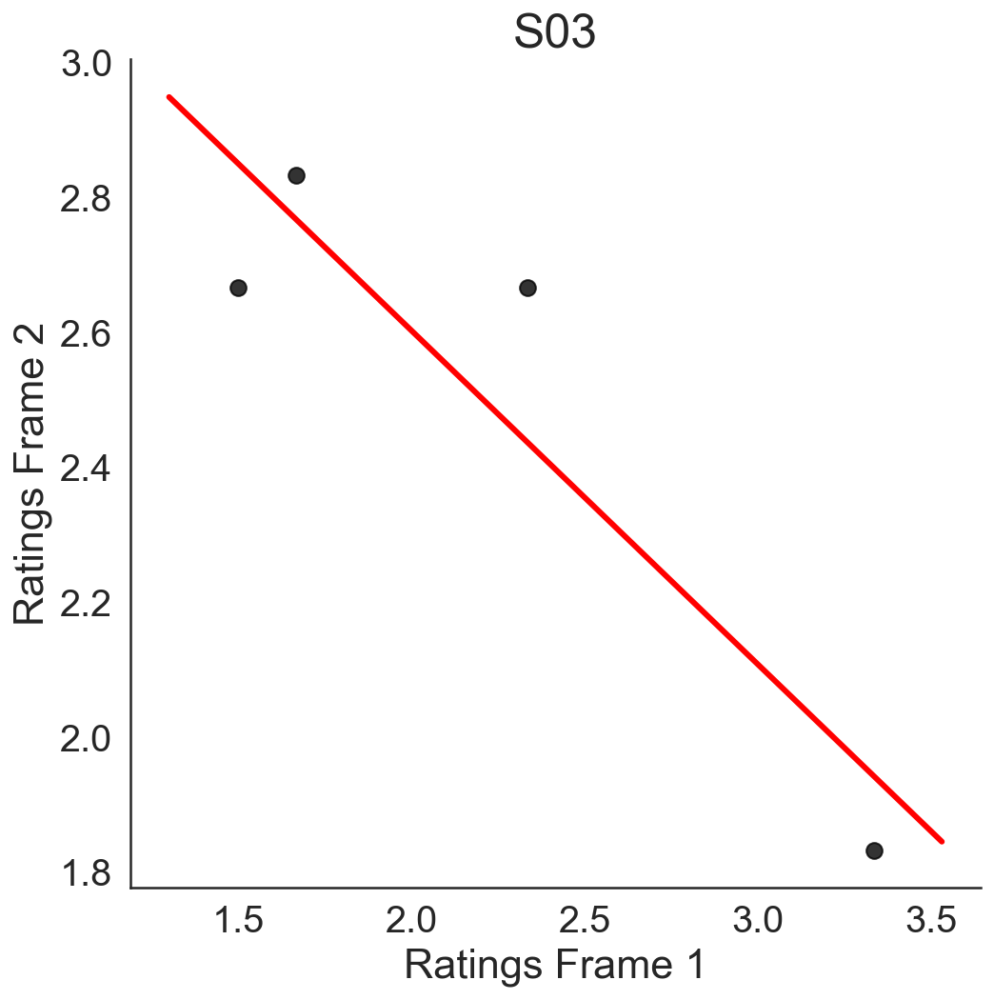

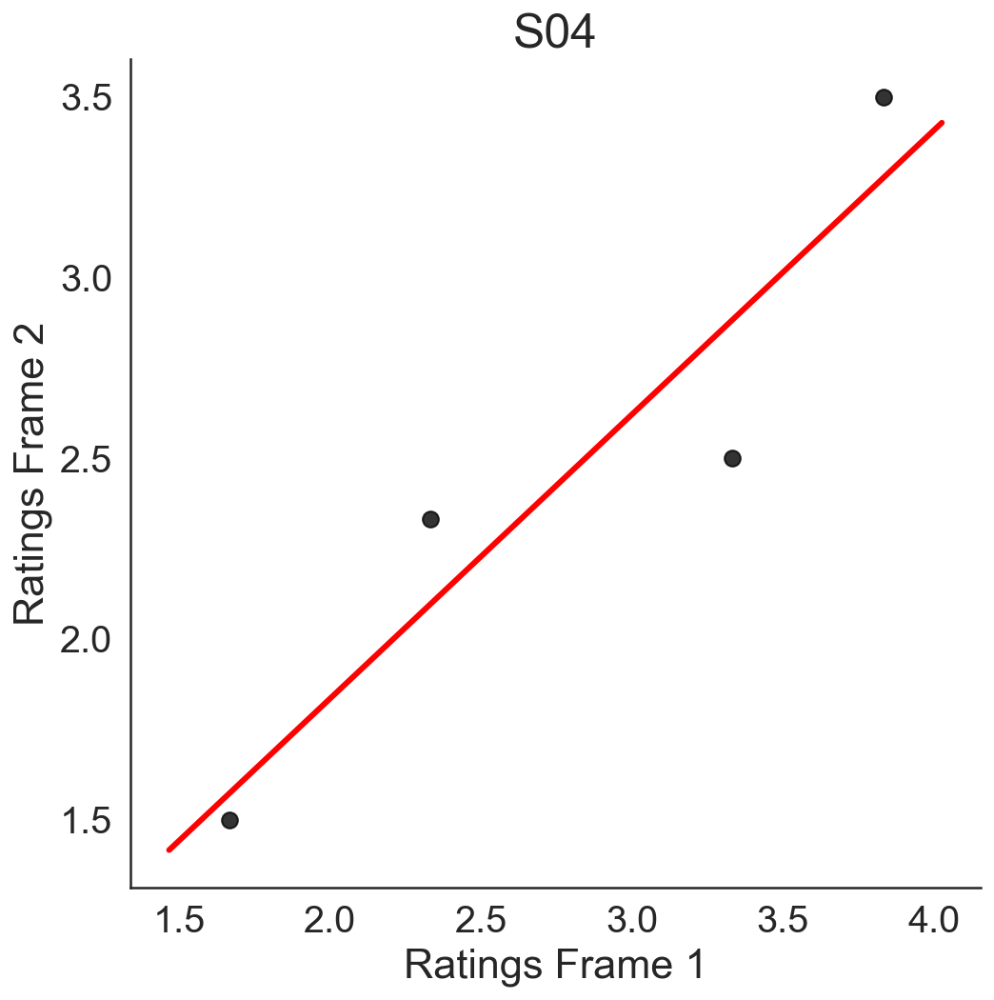

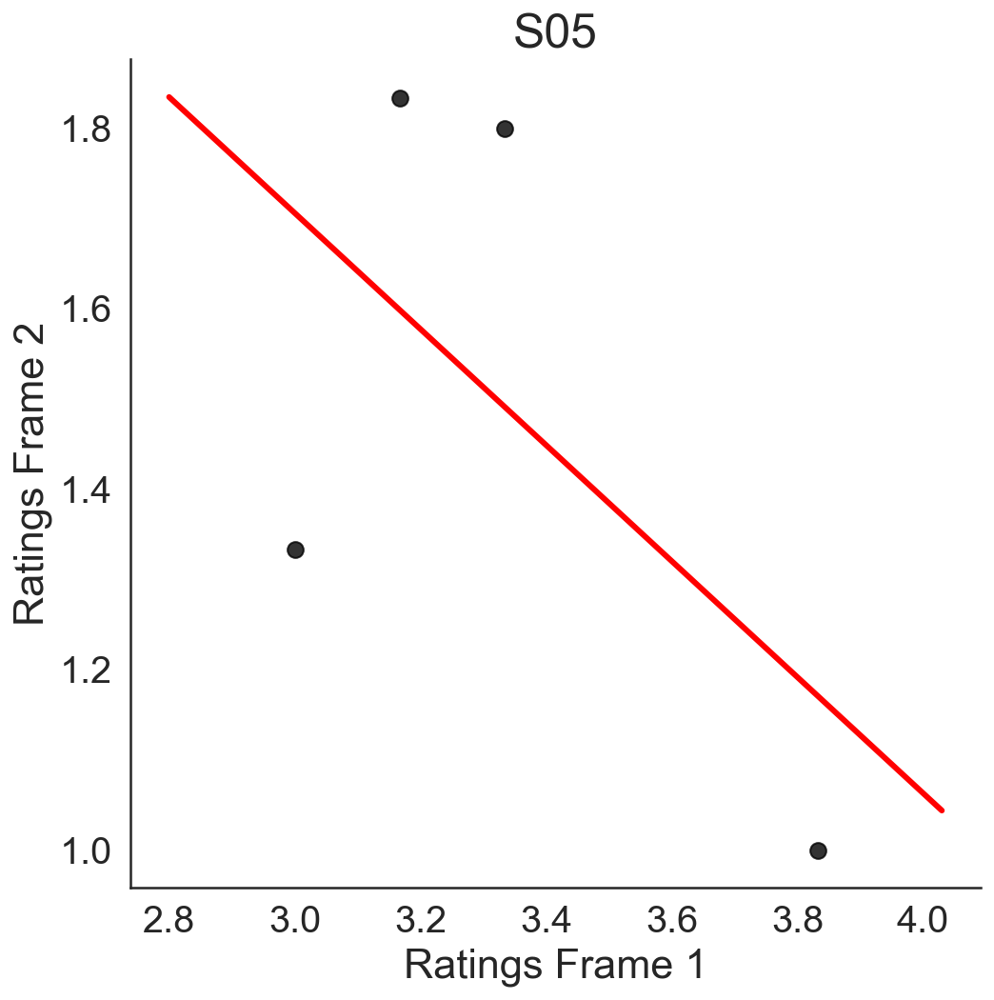

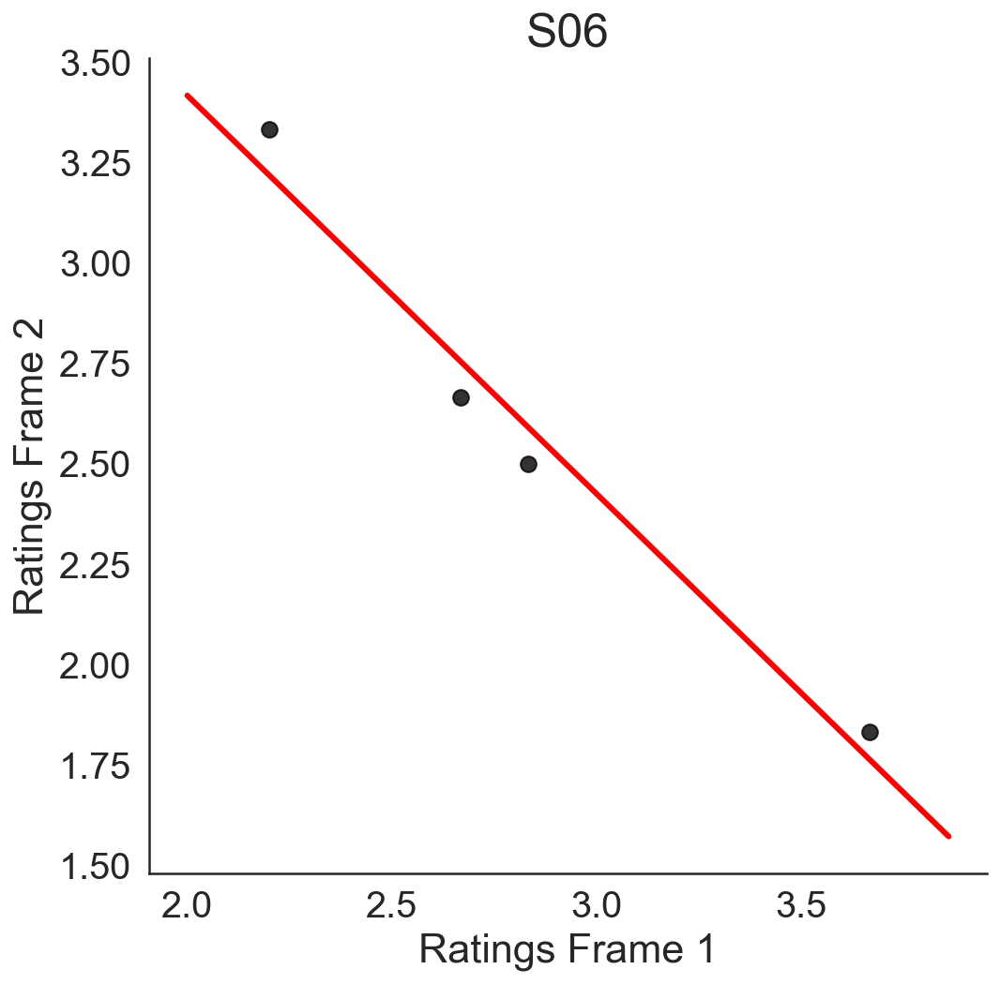

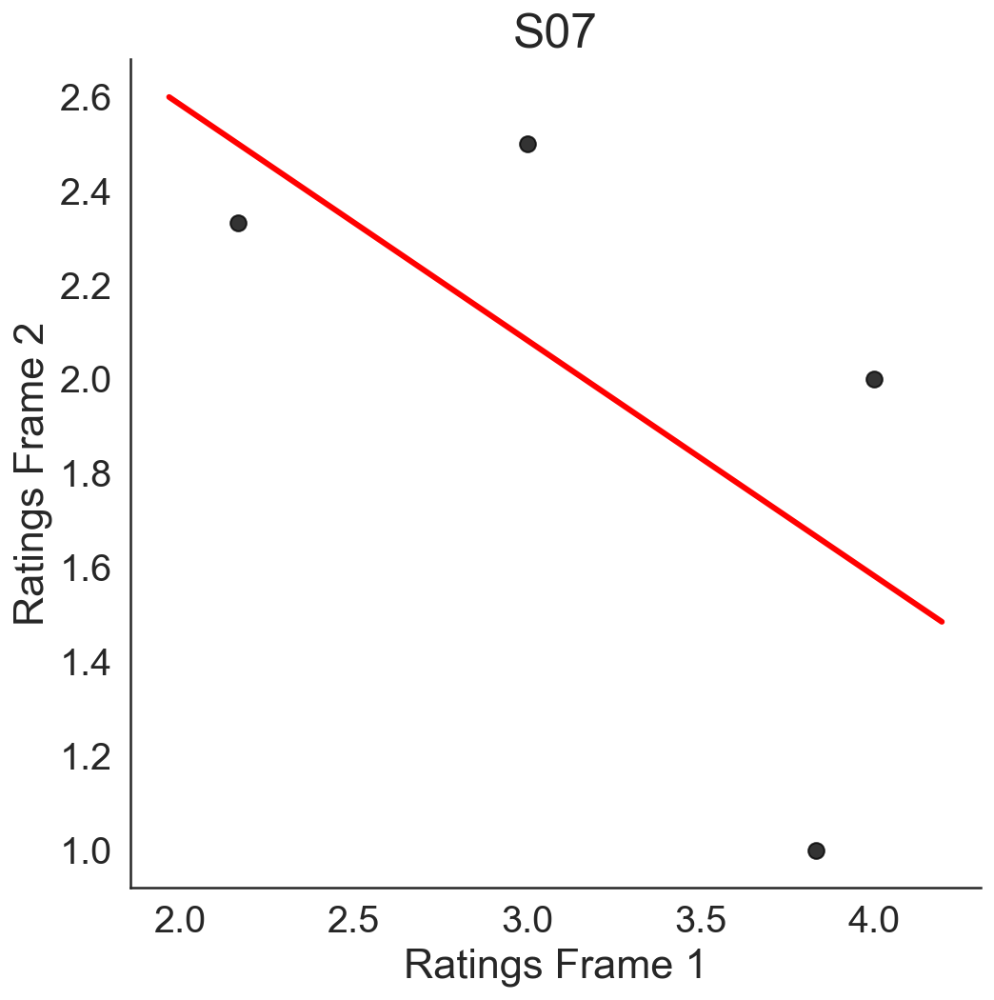

...

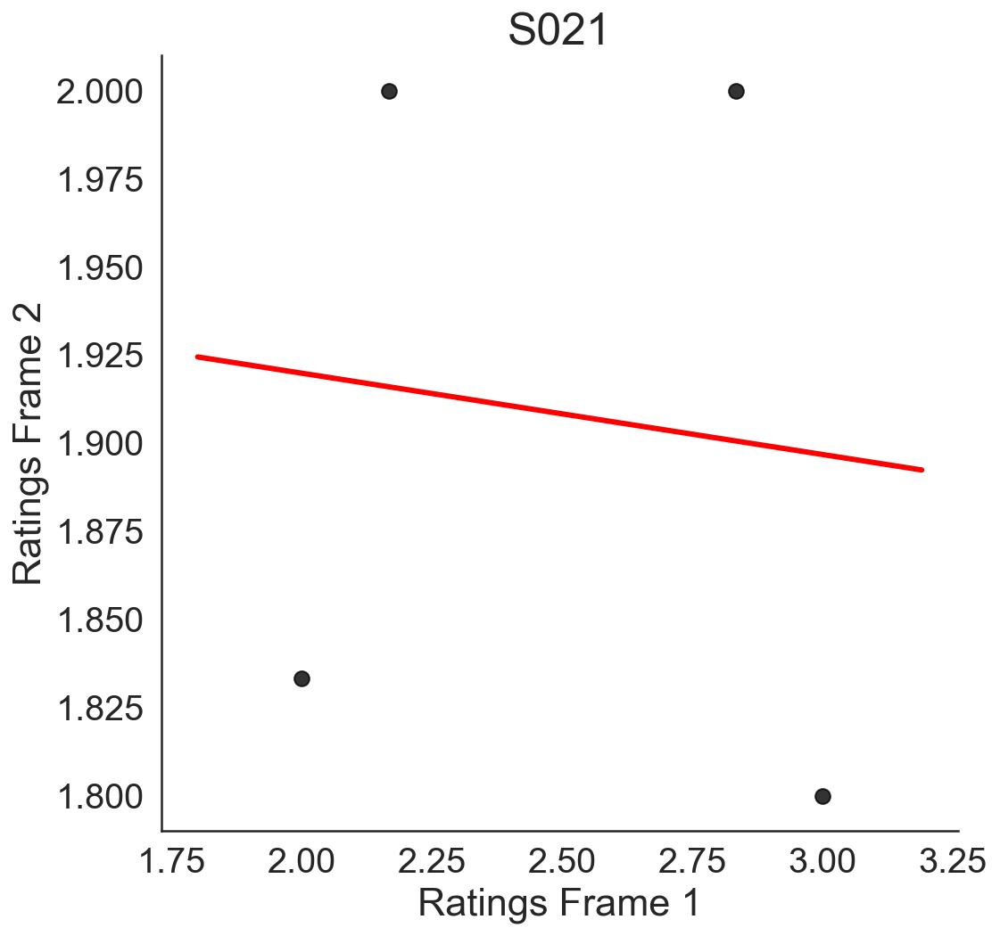

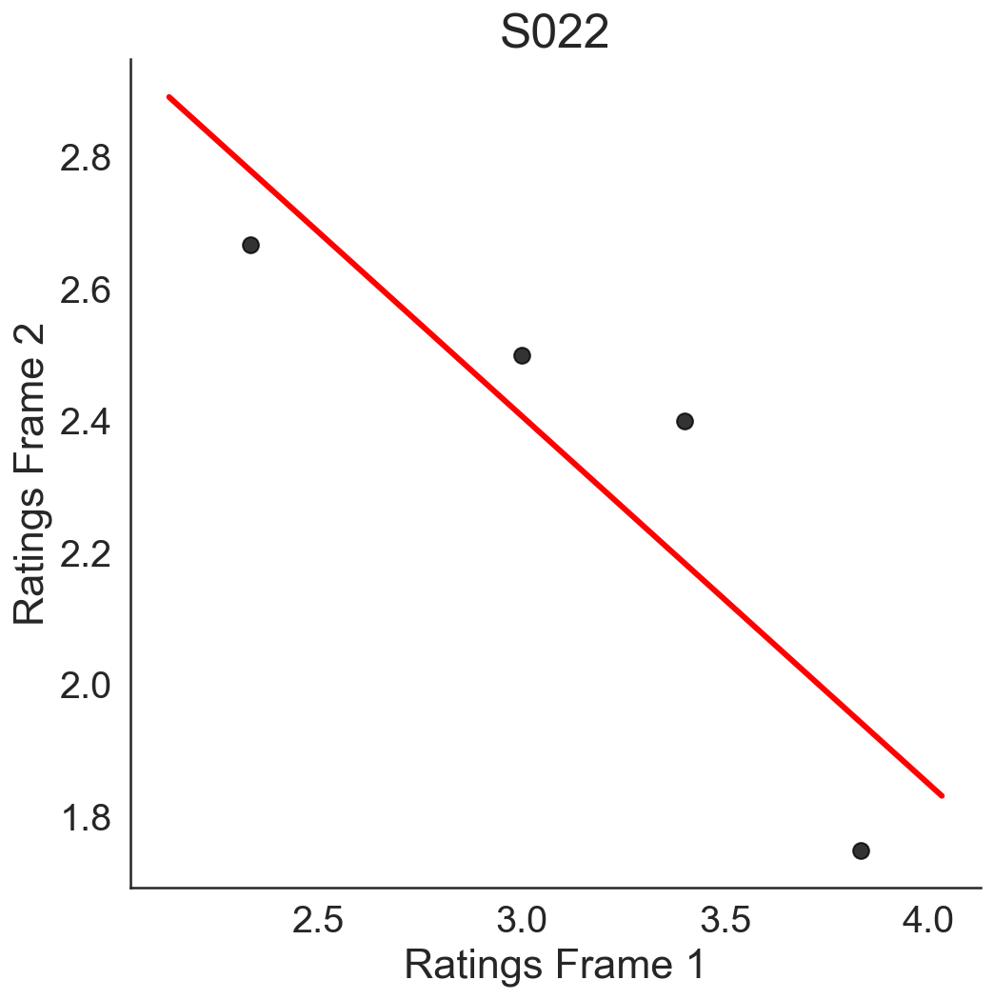

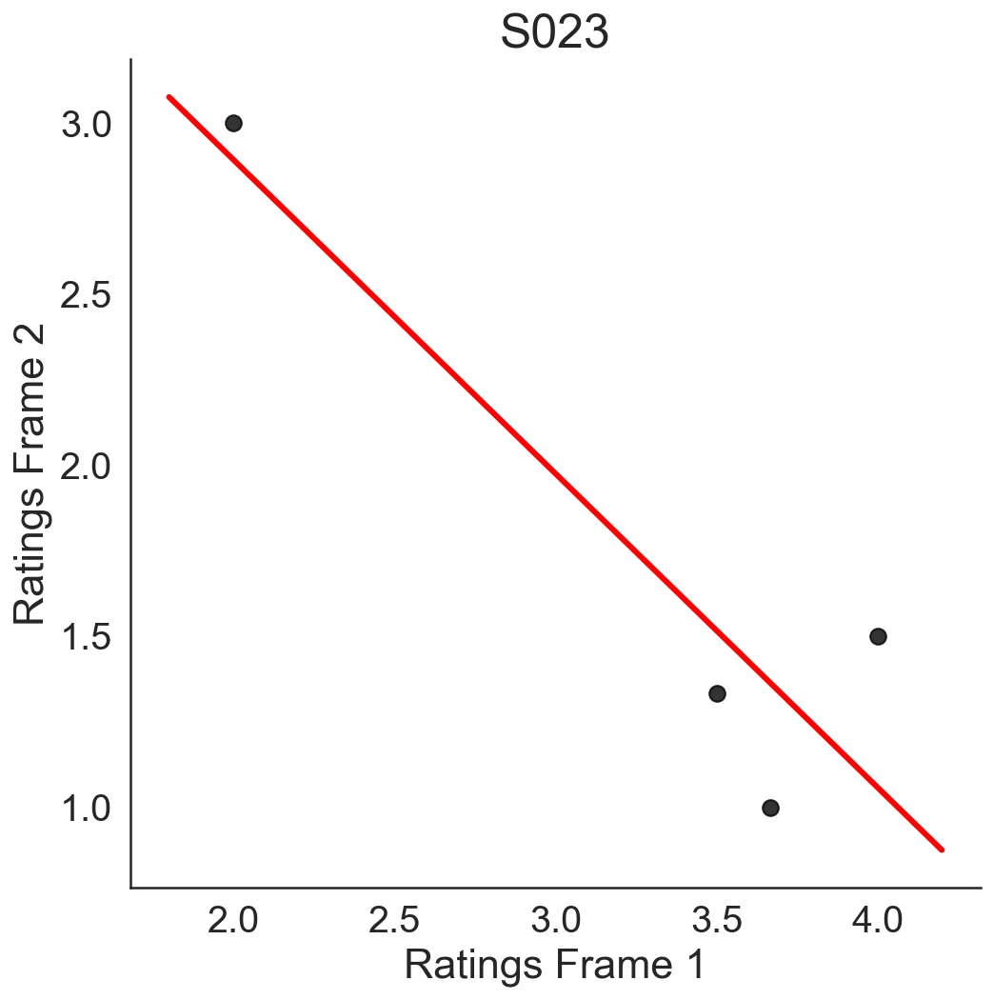

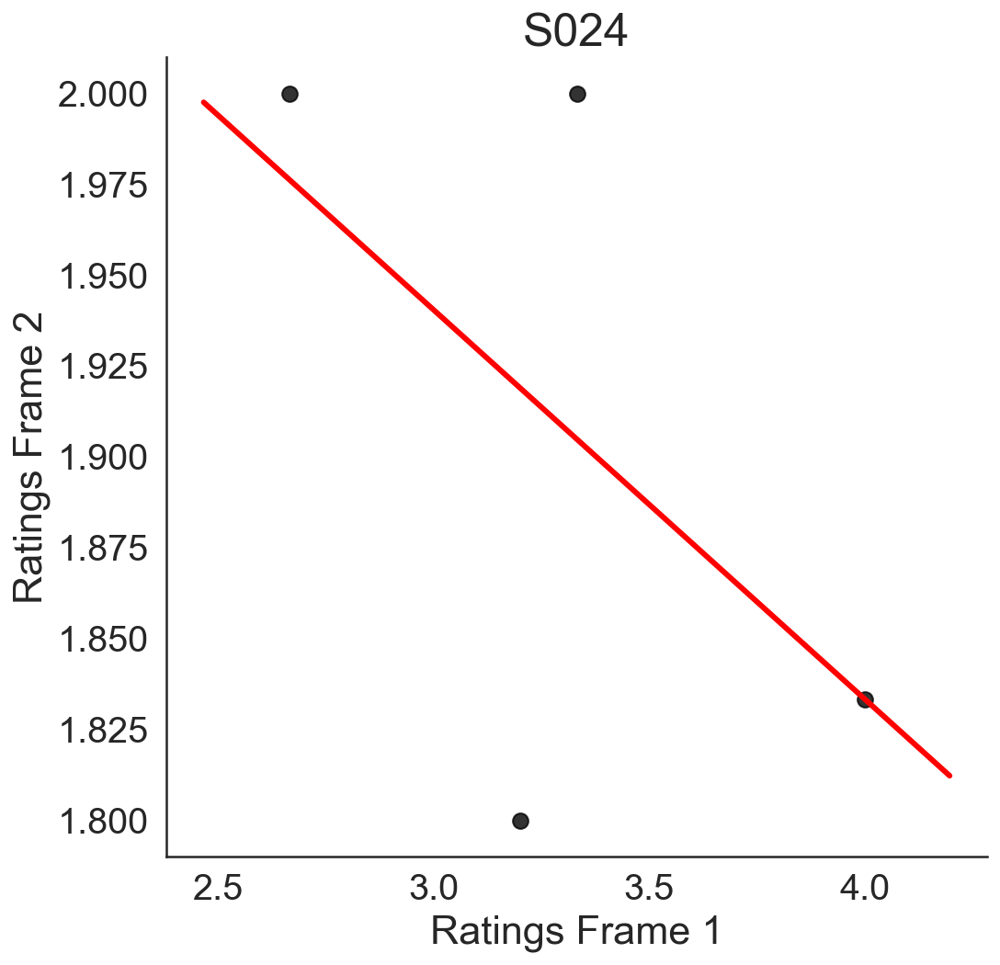

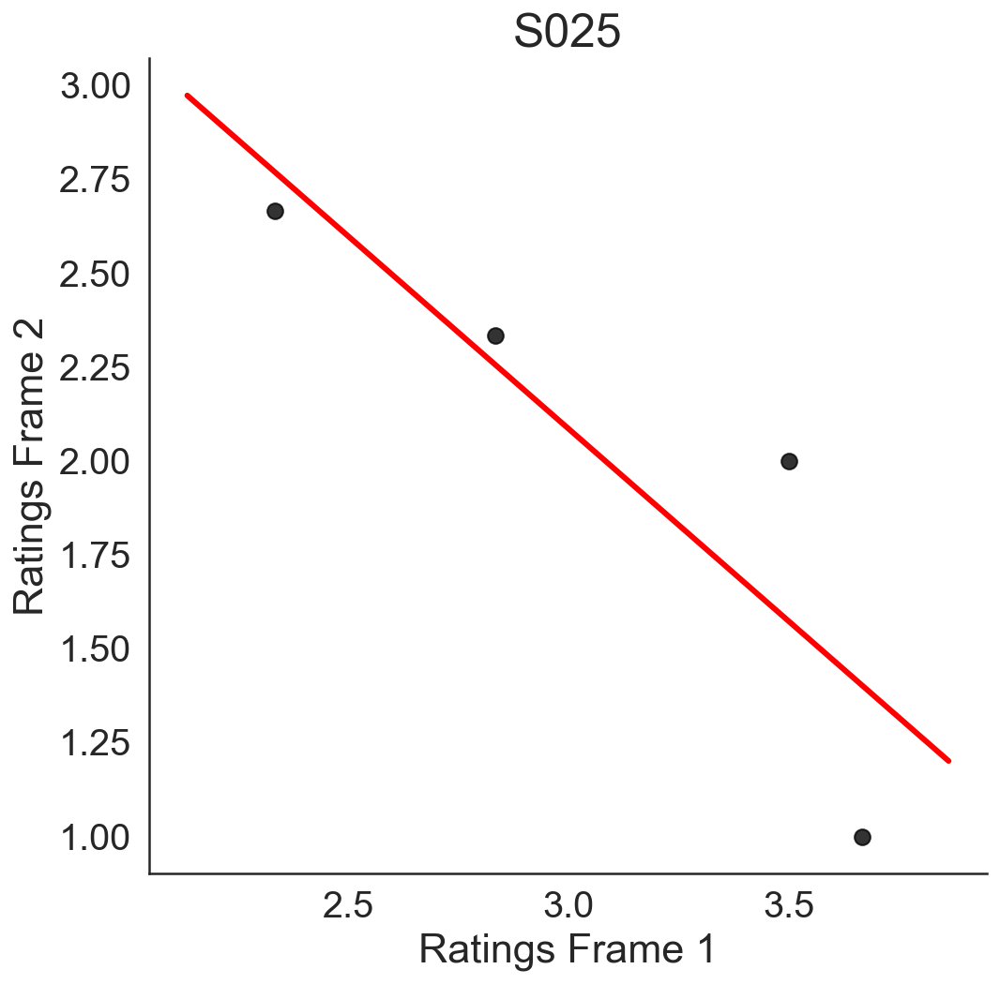

In [38]:
#corrPlotSimple(data_exp_ratings_2, 'rat1','Ratings Frame 1','rat2','Ratings Frame 2')
for part in data_exp1["Part"].unique(): 

    corrPlotSimple(data_exp_ratings_2.loc[(data_exp_ratings_2['Part'] == part)], 'rat1','Ratings Frame 1','rat2','Ratings Frame 2', title = 'S0'+str(part))


## 6. variability (std dev) of ratings for each pet in both frames 
### (frame 1: like; frame 2: dislike) 

Pearson's r = 0.282 p =  0.718
Pearson's r = -0.333 p =  0.667
Pearson's r = 0.918 p =  0.082
Pearson's r = 0.463 p =  0.537
Pearson's r = 0.377 p =  0.623
Pearson's r = 0.004 p =  0.996
Pearson's r = -0.233 p =  0.767
Pearson's r = 0.837 p =  0.163
Pearson's r = 0.574 p =  0.426
Pearson's r = 0.0 p =  1.0
Pearson's r = -0.039 p =  0.961
Pearson's r = 0.122 p =  0.878
Pearson's r = 0.16 p =  0.84
Pearson's r = 0.269 p =  0.731
Pearson's r = 0.583 p =  0.417
Pearson's r = nan p =  nan


/Users/pradyumna/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:4023: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/numpy/lib/polynomial.py:659: RuntimeWarning: invalid value encountered in true_divide
  lhs /= scale


LinAlgError: SVD did not converge in Linear Least Squares

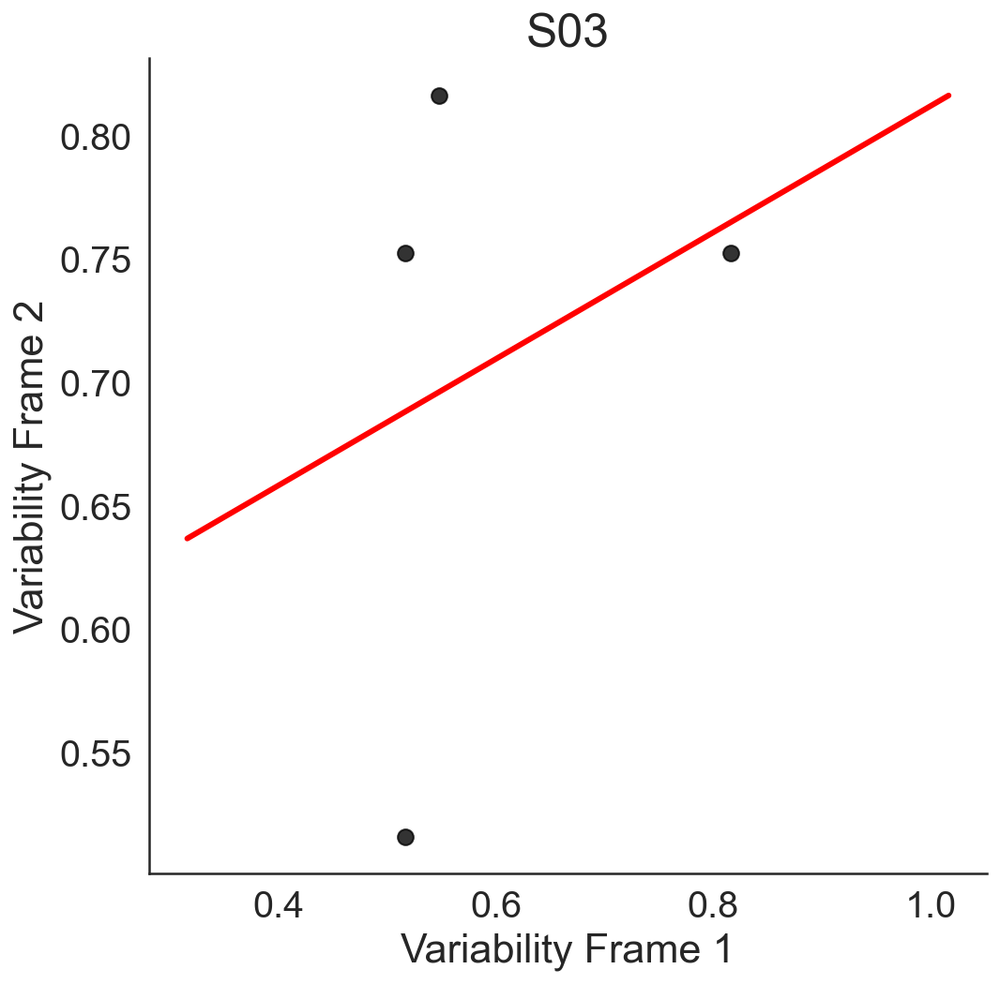

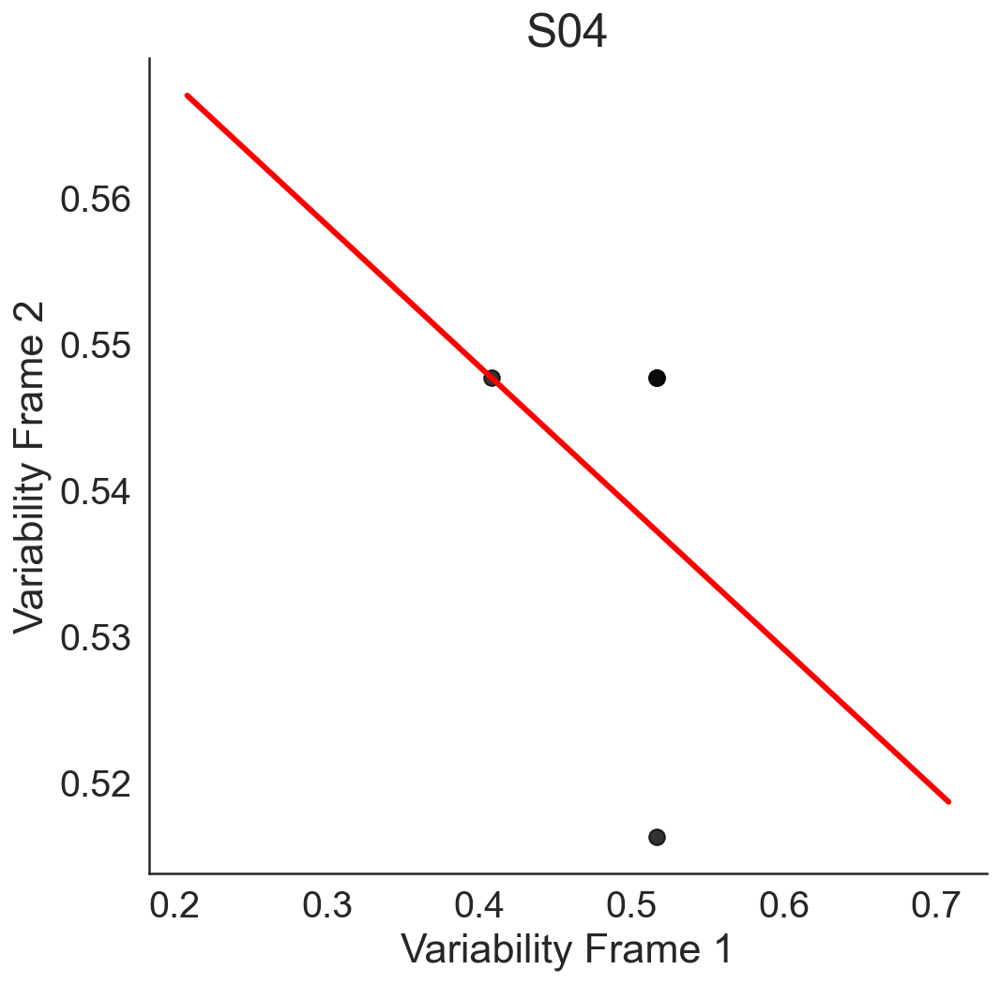

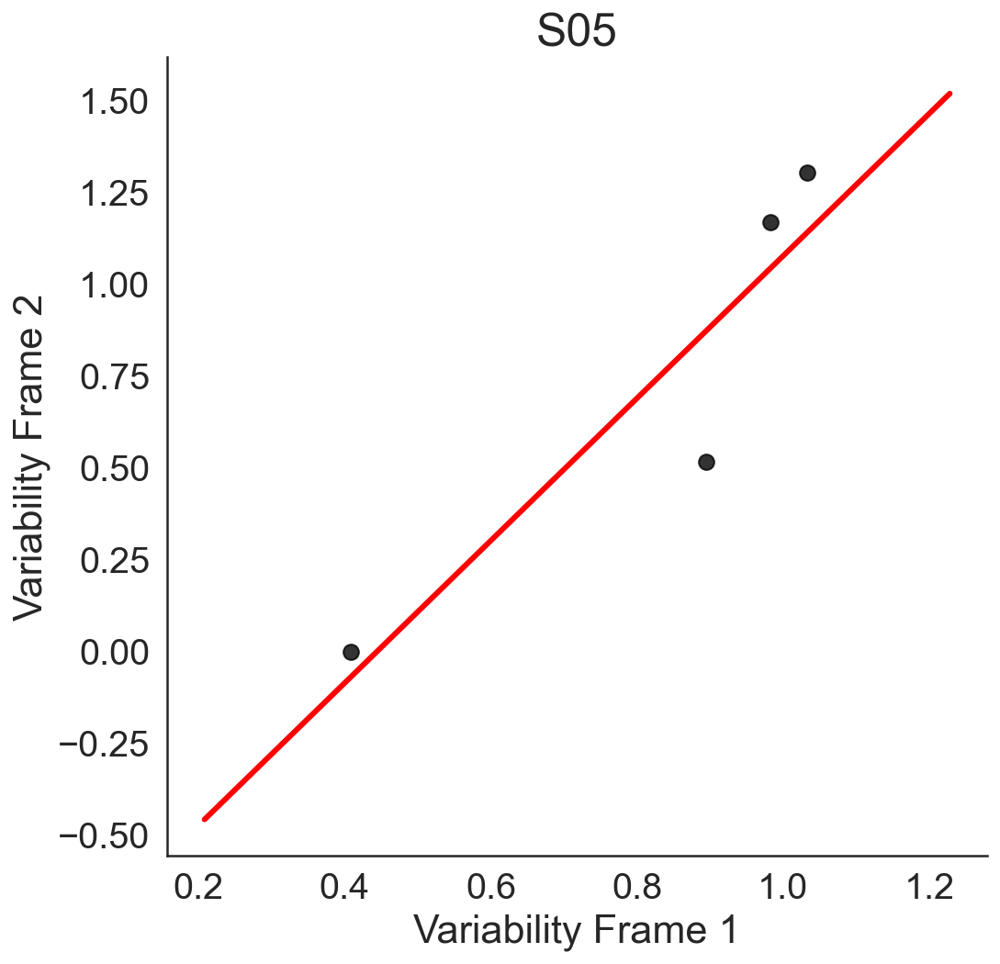

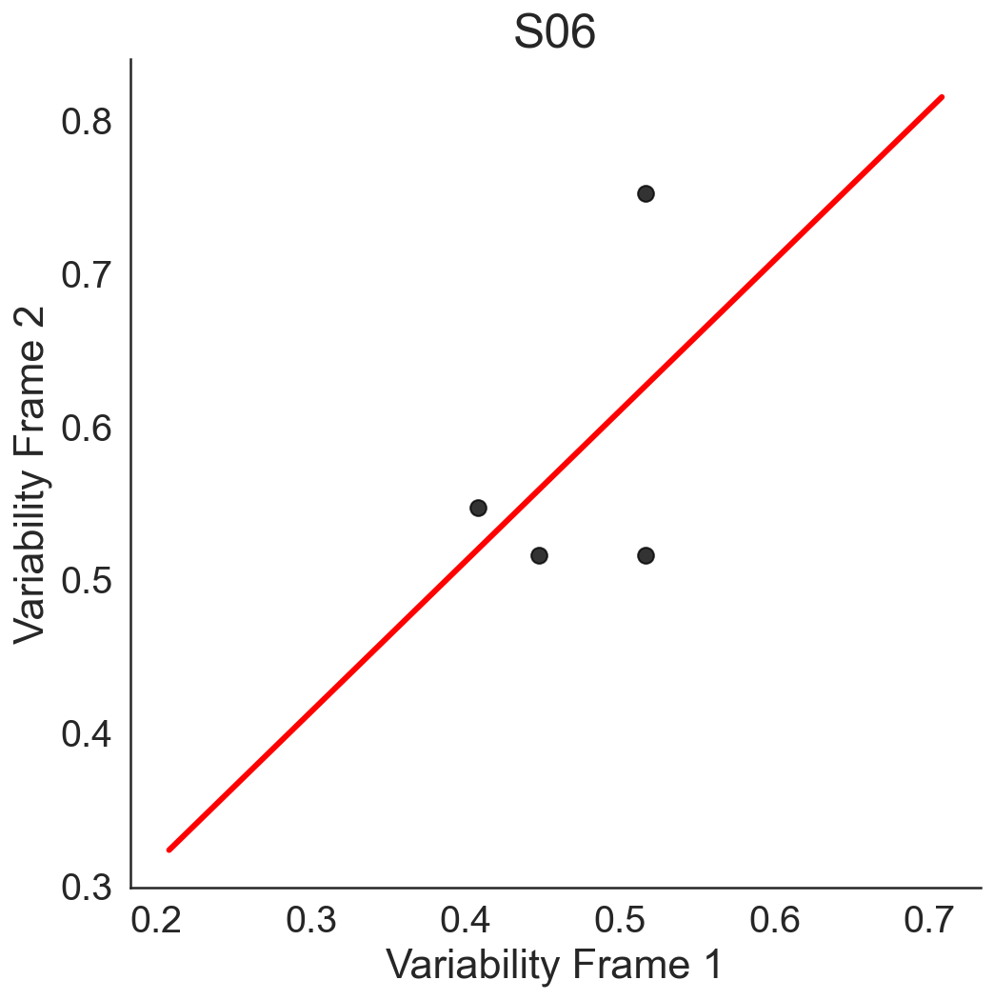

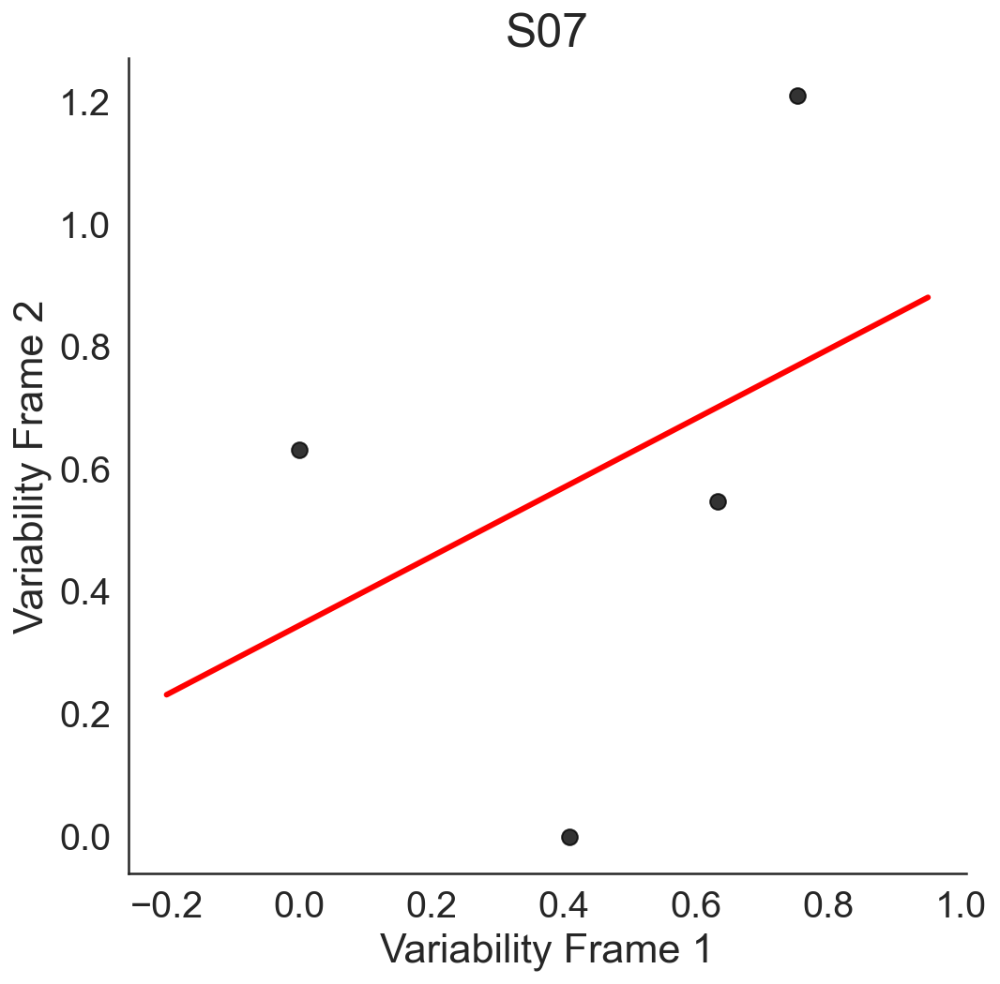

...

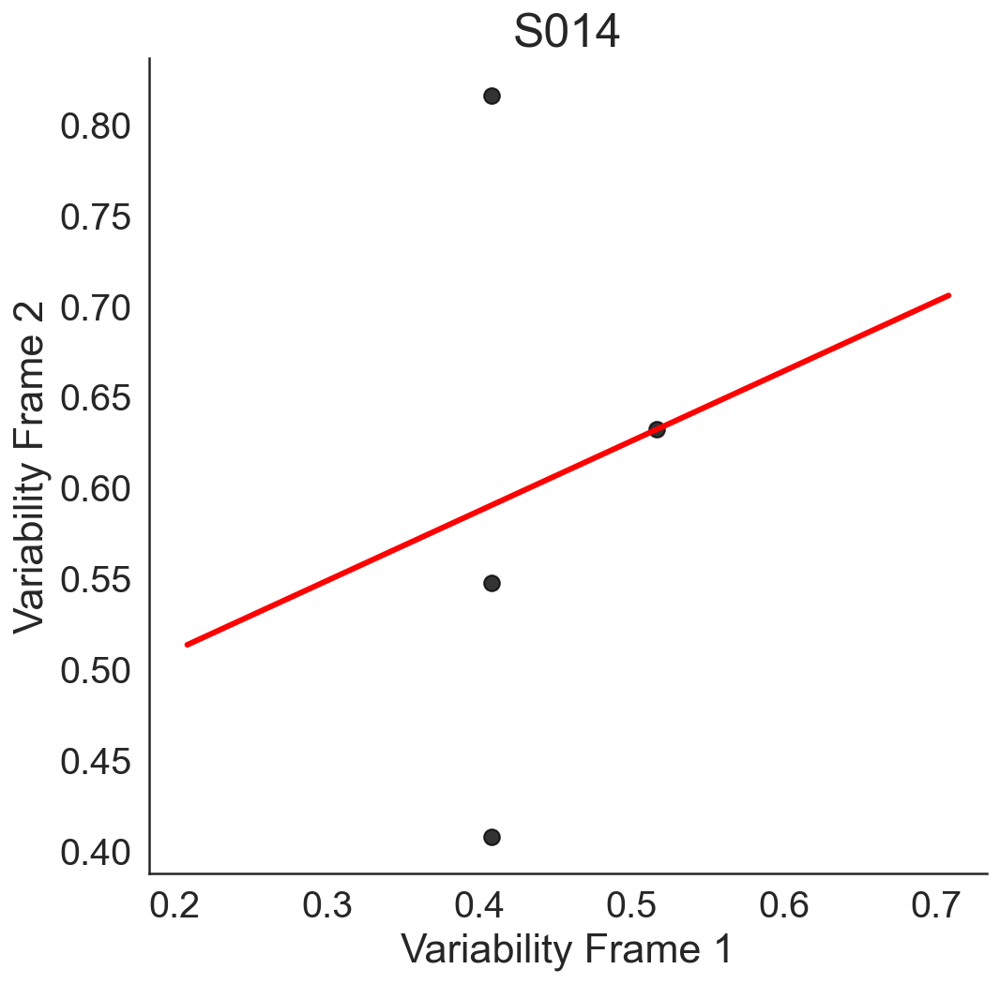

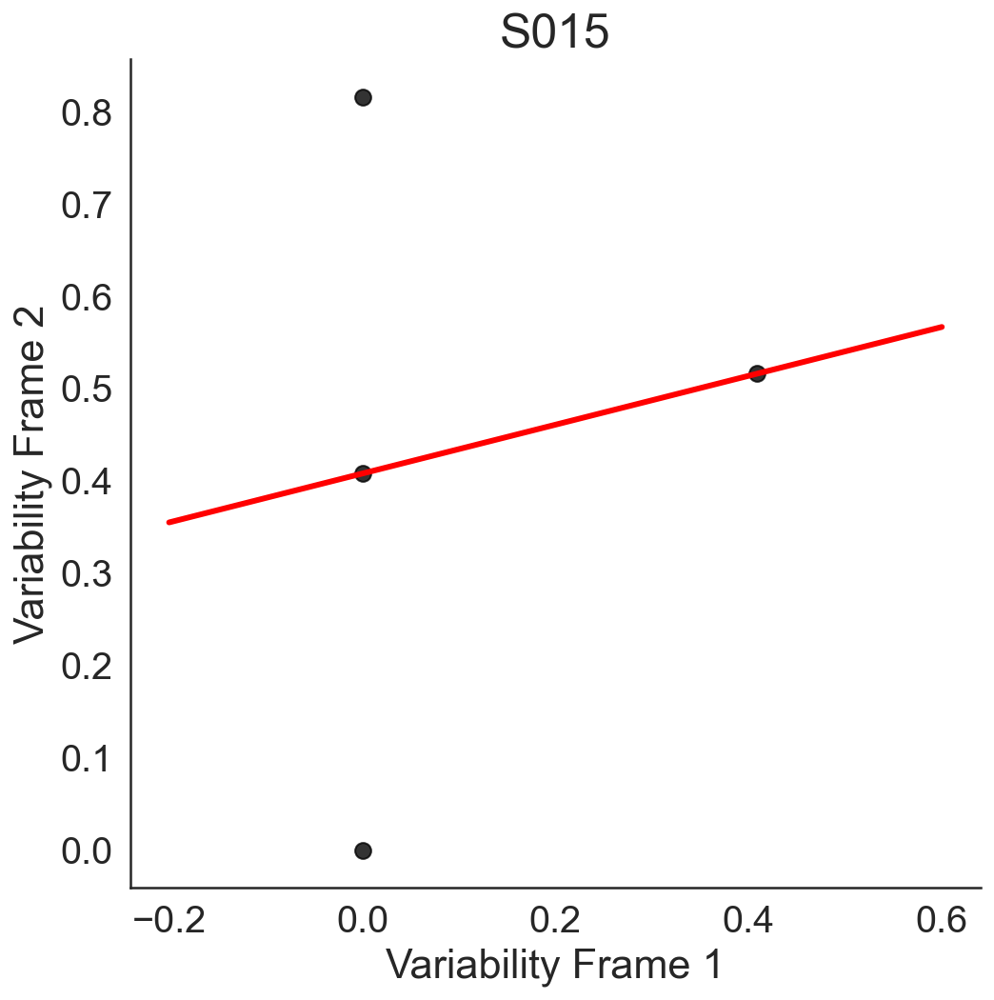

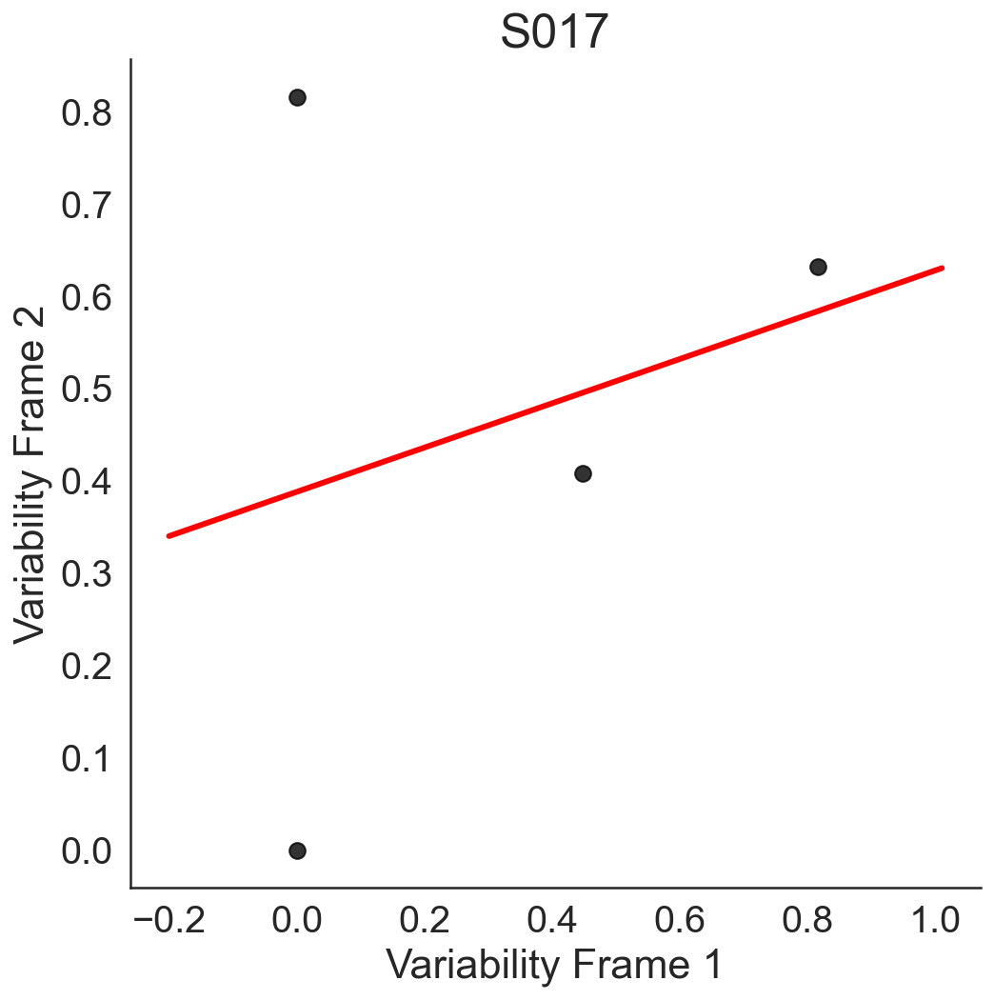

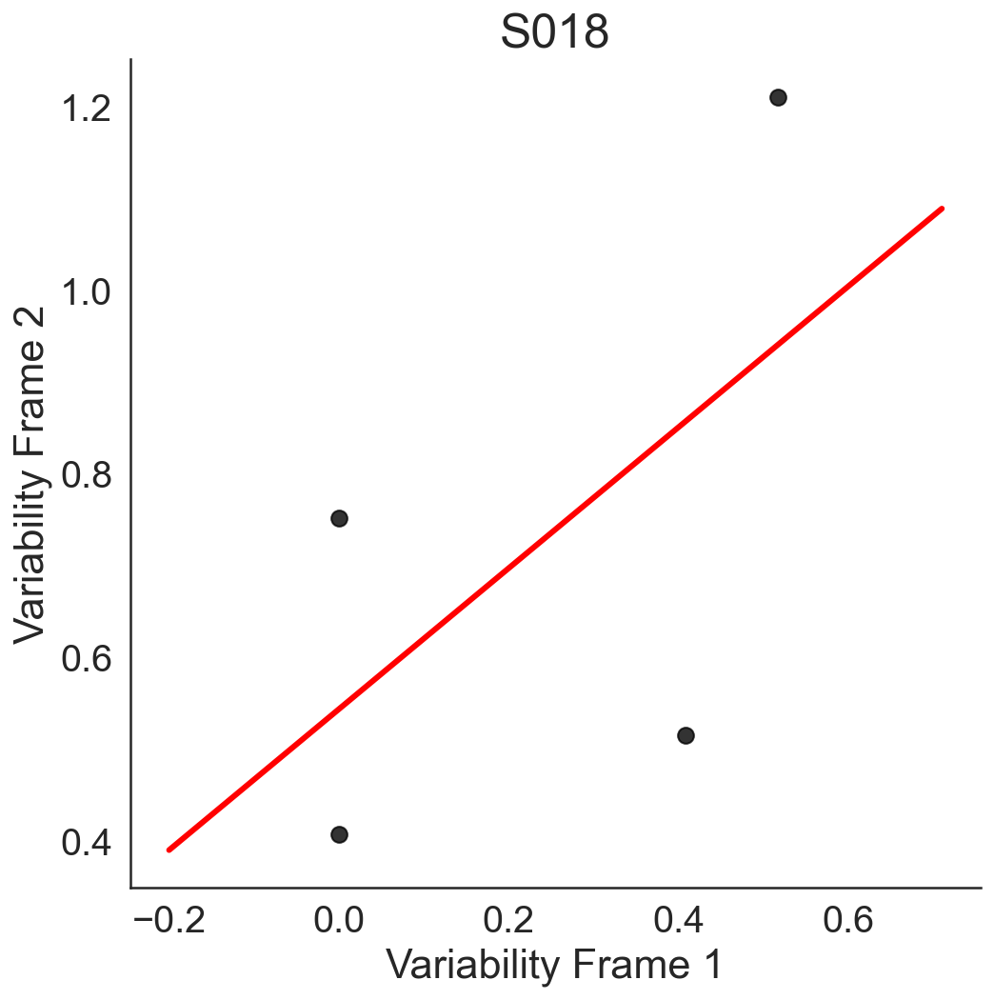

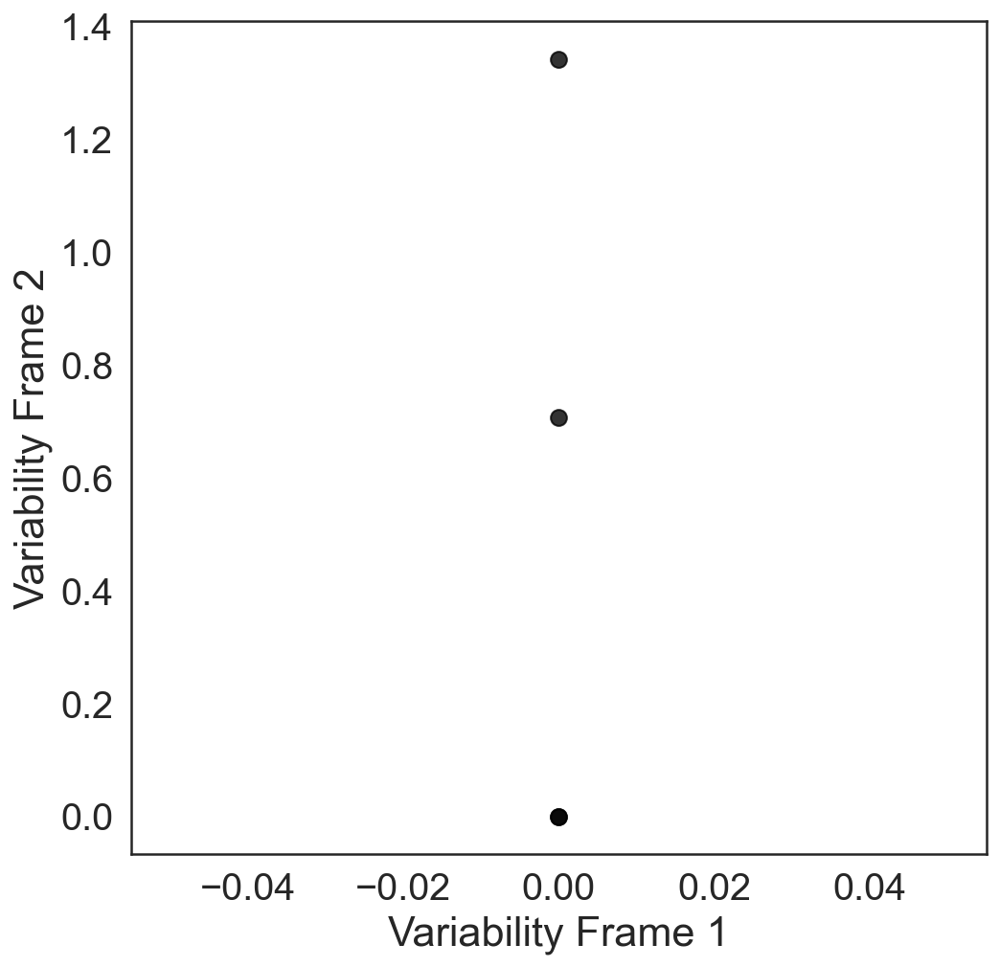

In [39]:
for part in data_exp1["Part"].unique(): 
    ## skip participant 16
    if part == 16:
        continue
    corrPlotSimple(data_exp_ratings_2.loc[(data_exp_ratings_2['Part'] == part)], 'var1','Variability Frame 1','var2','Variability Frame 2', title = 'S0'+str(part))

Pearson's r = 0.385 p =  0.0


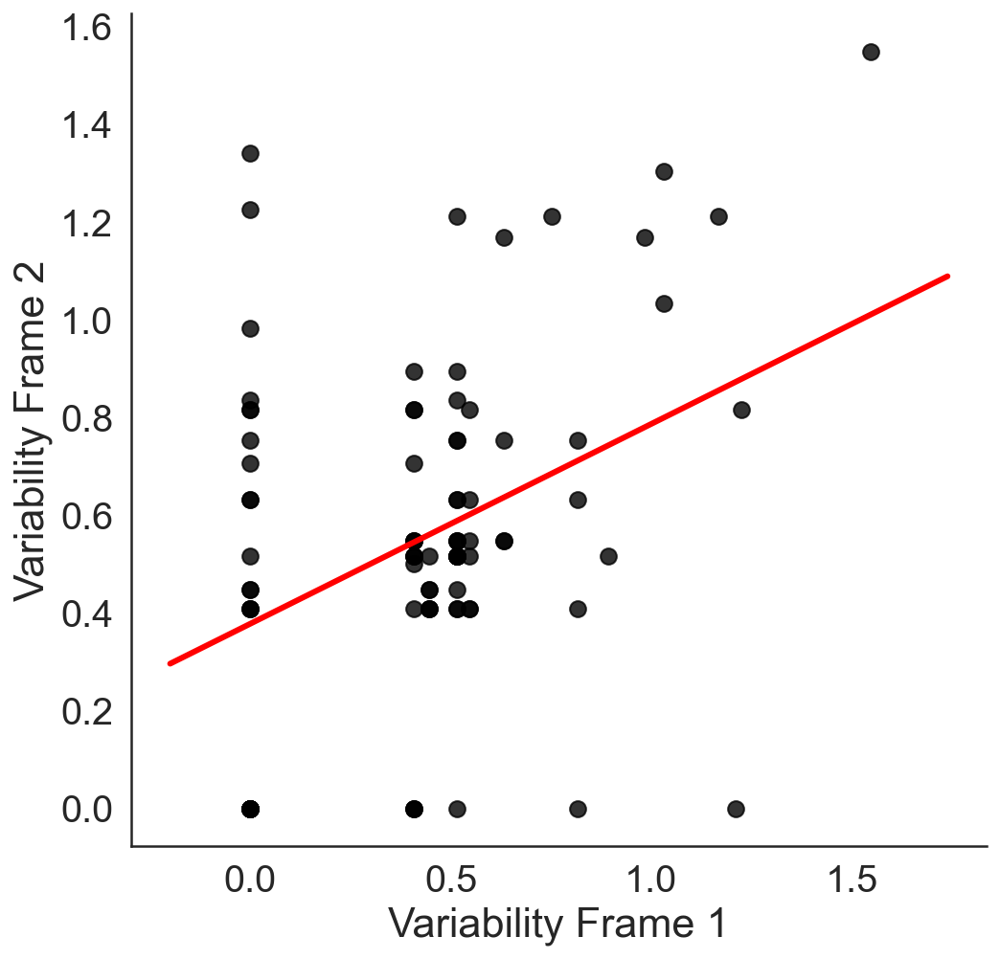

In [40]:
corrPlotSimple(data_exp_ratings_2, 'var1','Variability Frame 1','var2','Variability Frame 2')


## 7. relationship between rating and variability.

Pearson's r = -0.137 p =  0.192


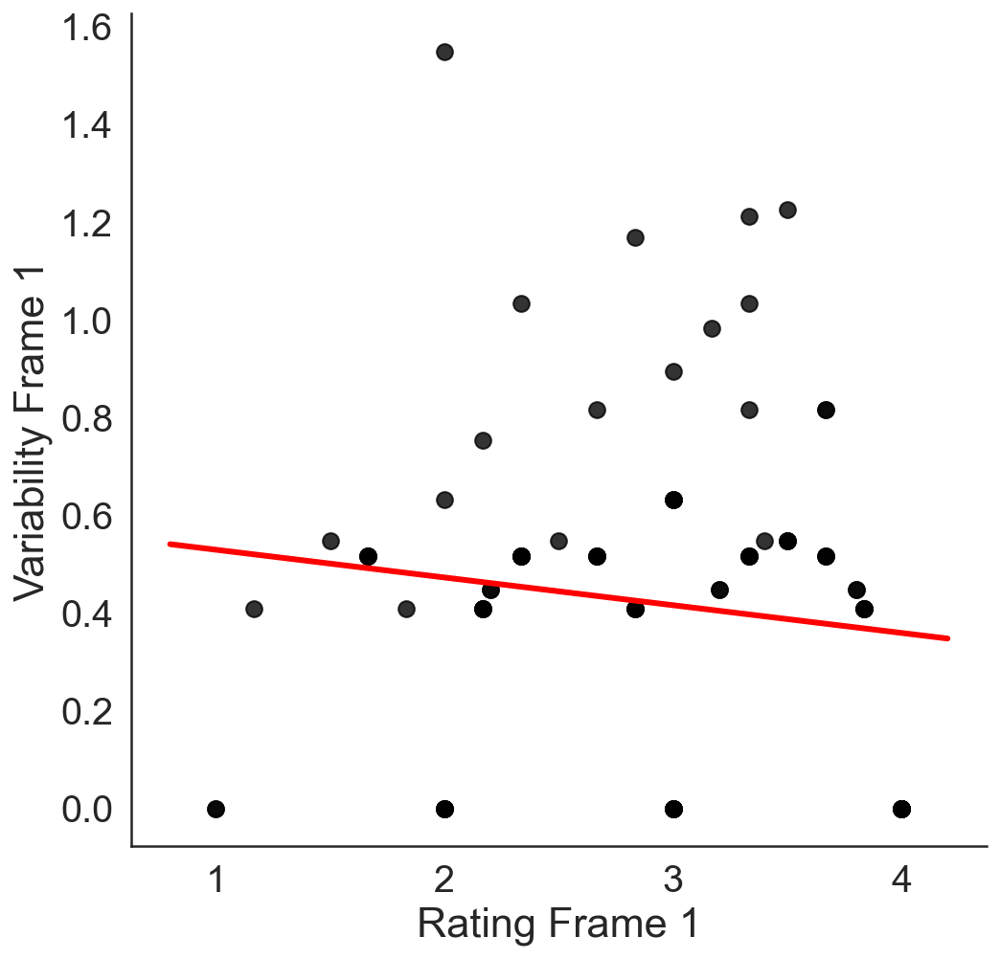

In [41]:
corrPlotSimple(data_exp_ratings_2, 'rat1','Rating Frame 1','var1','Variability Frame 1')

Pearson's r = -0.161 p =  0.839
Pearson's r = 0.102 p =  0.898
Pearson's r = 0.992 p =  0.008
Pearson's r = -0.854 p =  0.146
Pearson's r = 0.778 p =  0.222
Pearson's r = 1.0 p =  0.0
Pearson's r = 0.751 p =  0.249
Pearson's r = 0.16 p =  0.84
Pearson's r = 0.728 p =  0.272
Pearson's r = -0.973 p =  0.027
Pearson's r = 0.209 p =  0.791
Pearson's r = -0.239 p =  0.761
Pearson's r = -0.522 p =  0.478
Pearson's r = nan p =  nan
Pearson's r = 0.407 p =  0.593
Pearson's r = 0.602 p =  0.398
Pearson's r = -0.197 p =  0.803
Pearson's r = 0.943 p =  0.057
Pearson's r = -0.363 p =  0.637
Pearson's r = 0.596 p =  0.404


/Users/pradyumna/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:4023: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RankWarning: Polyfit may be poorly conditioned
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


Pearson's r = 0.809 p =  0.191
Pearson's r = 0.227 p =  0.773
Pearson's r = 0.942 p =  0.058


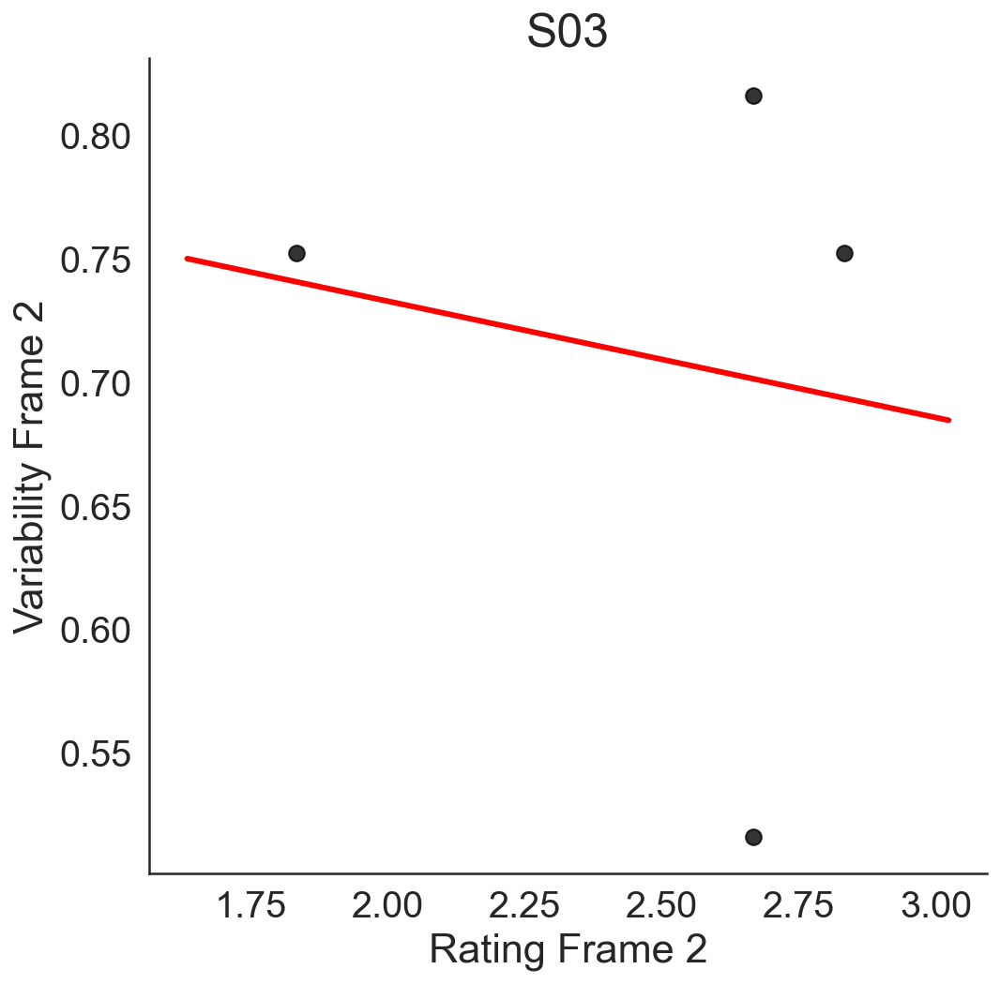

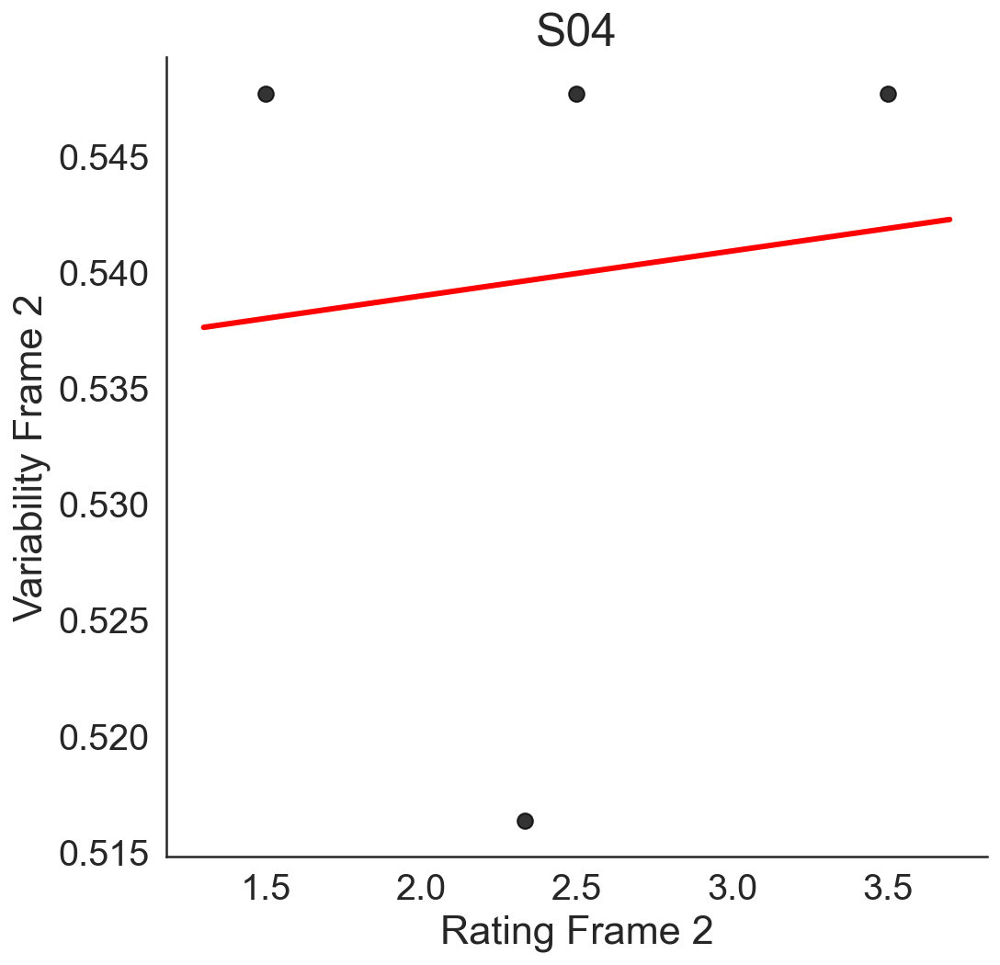

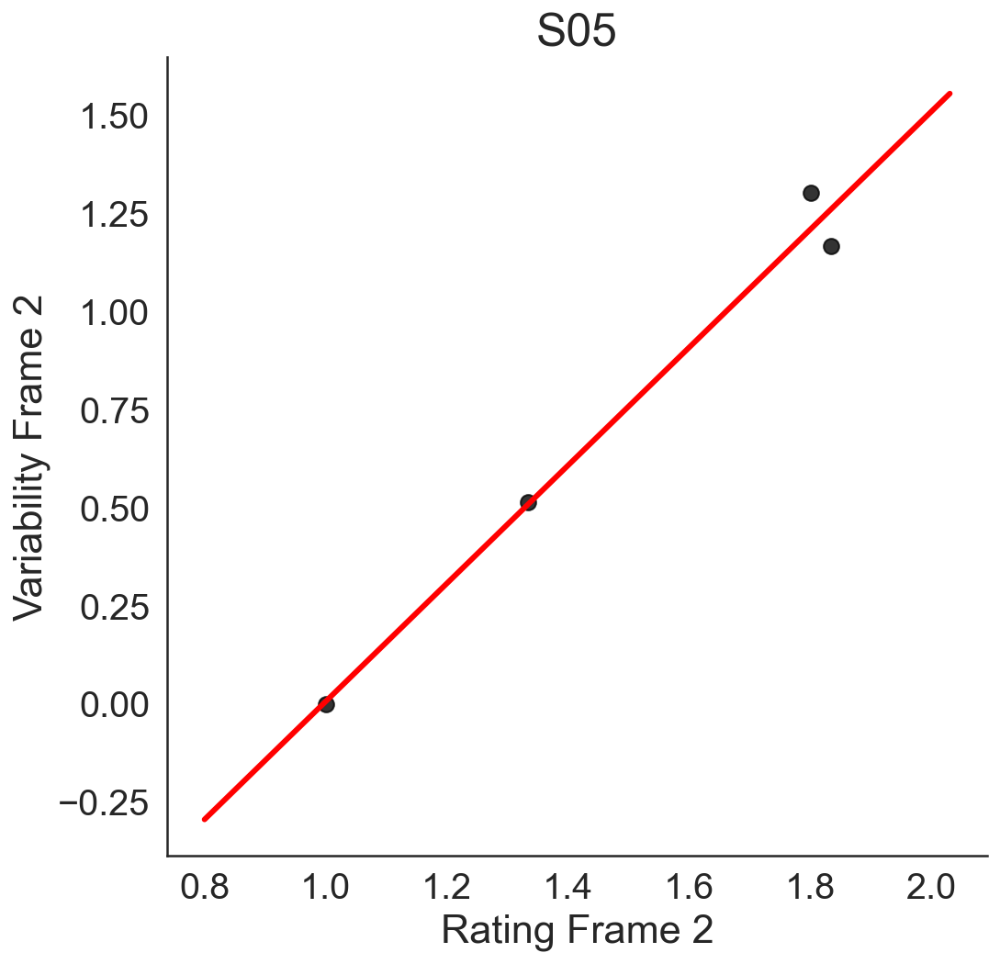

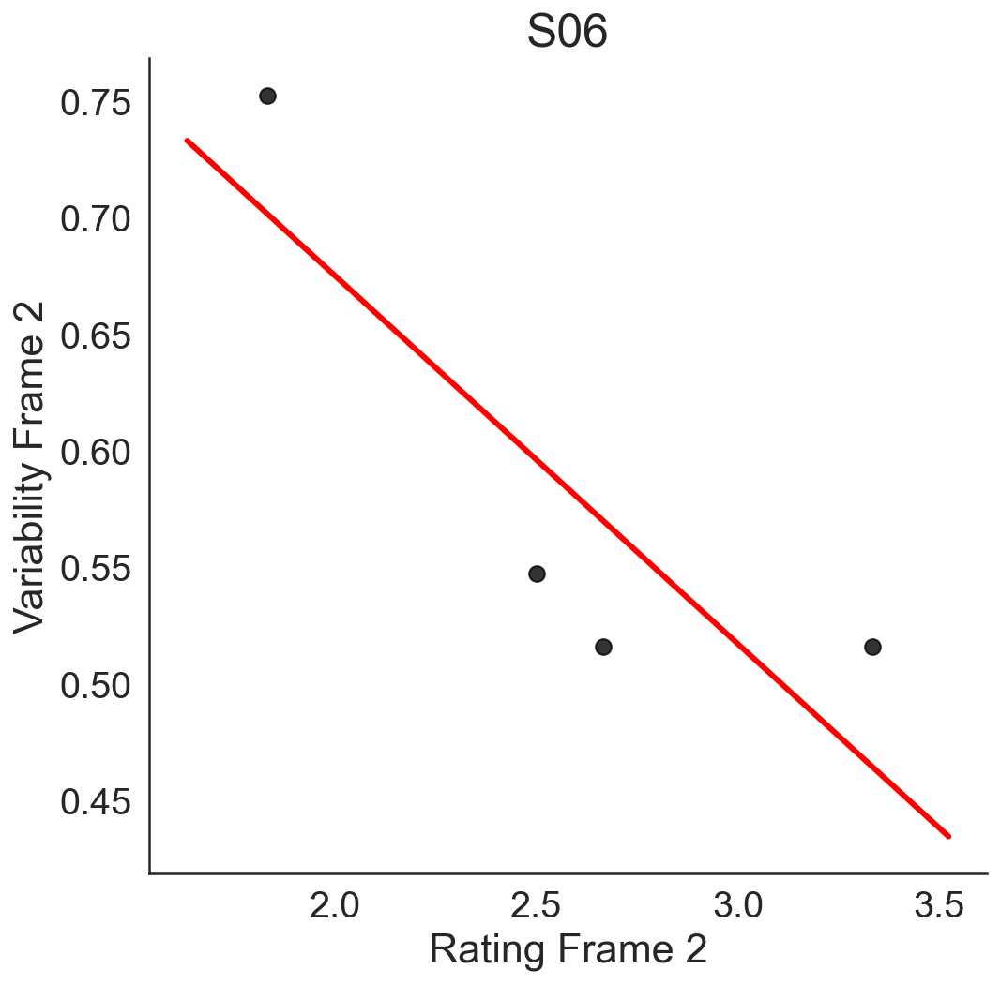

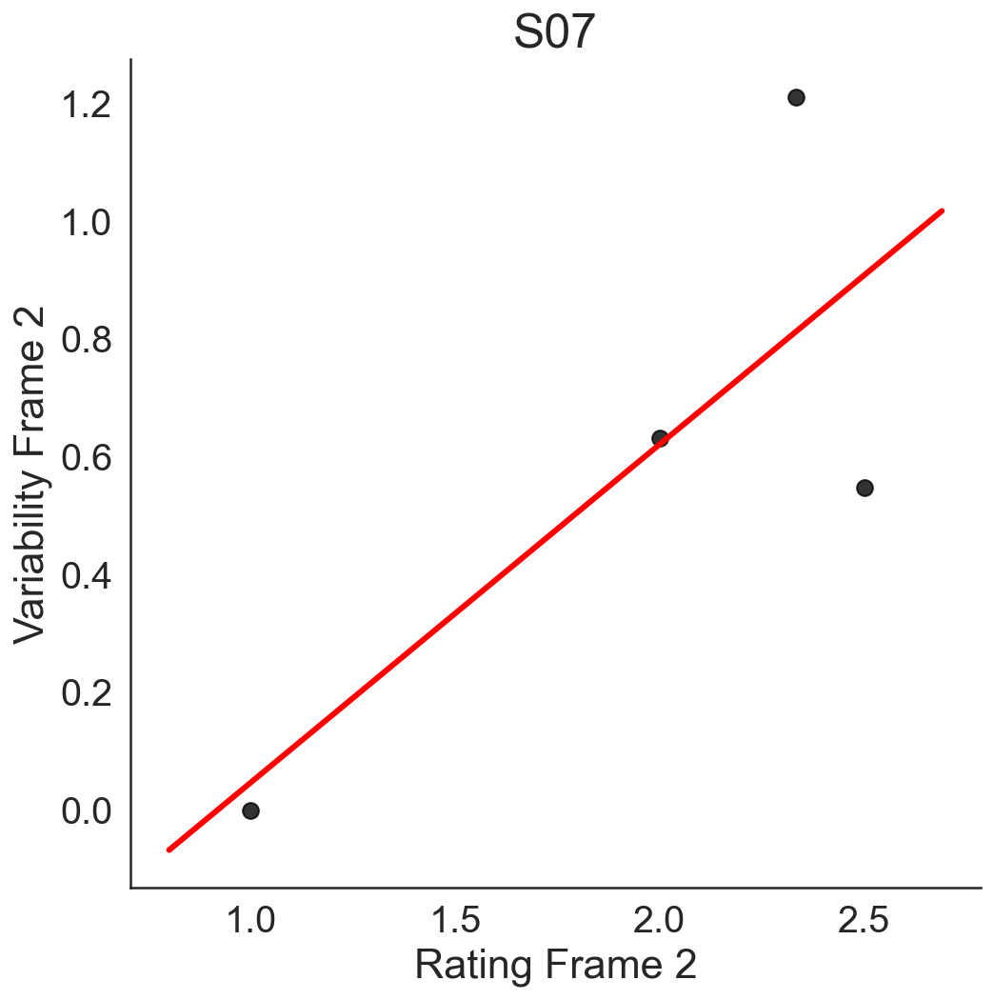

...

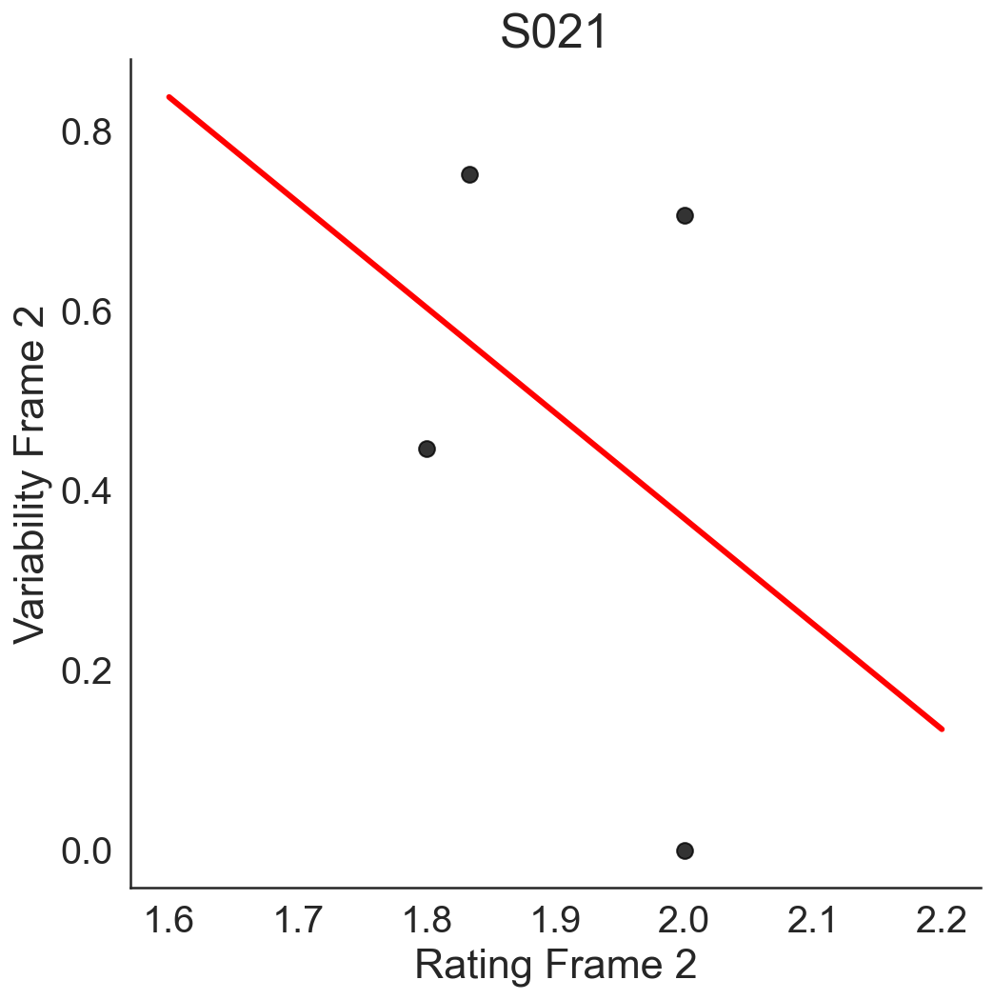

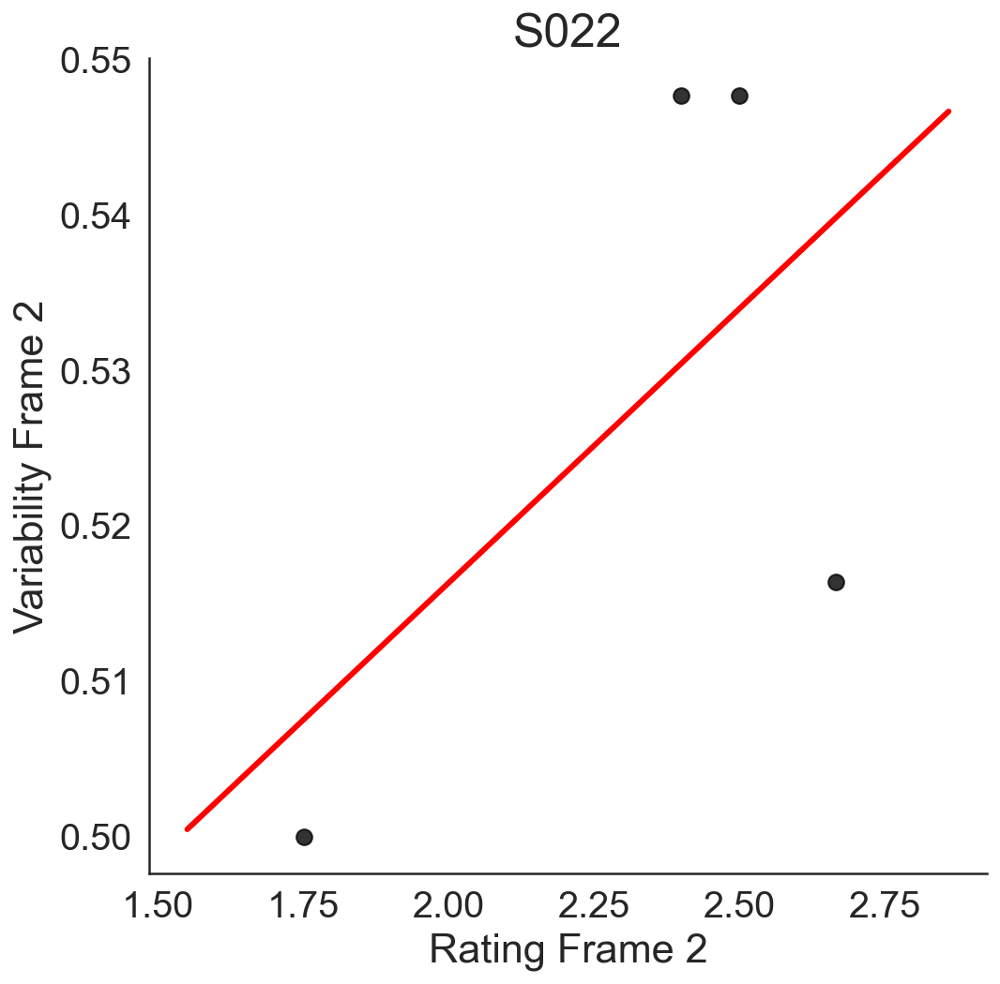

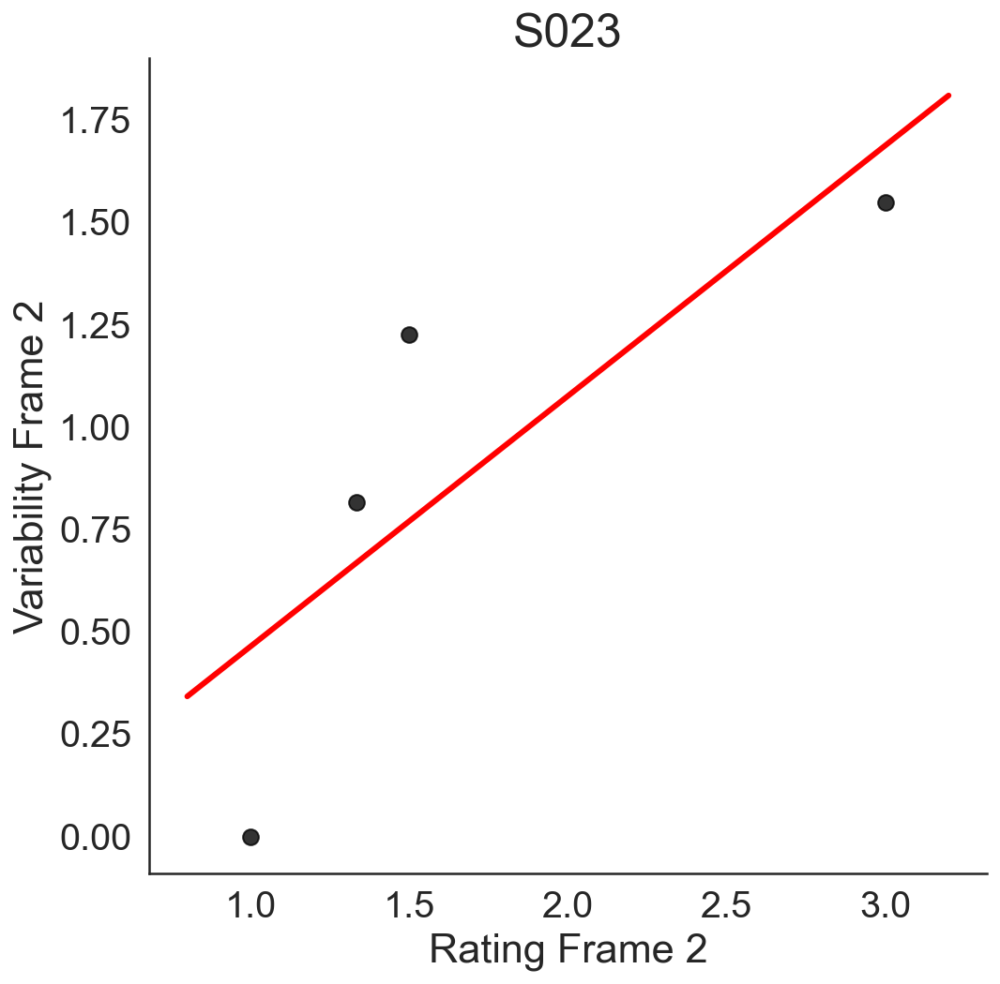

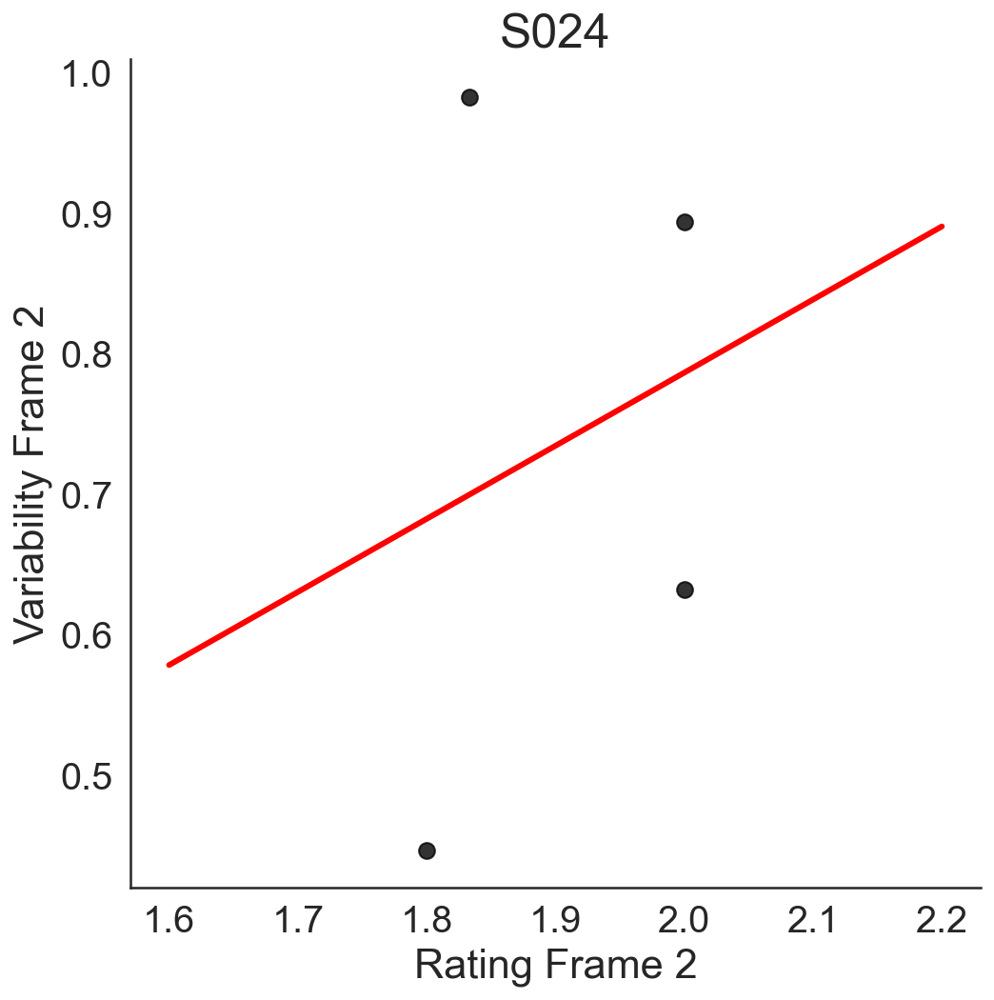

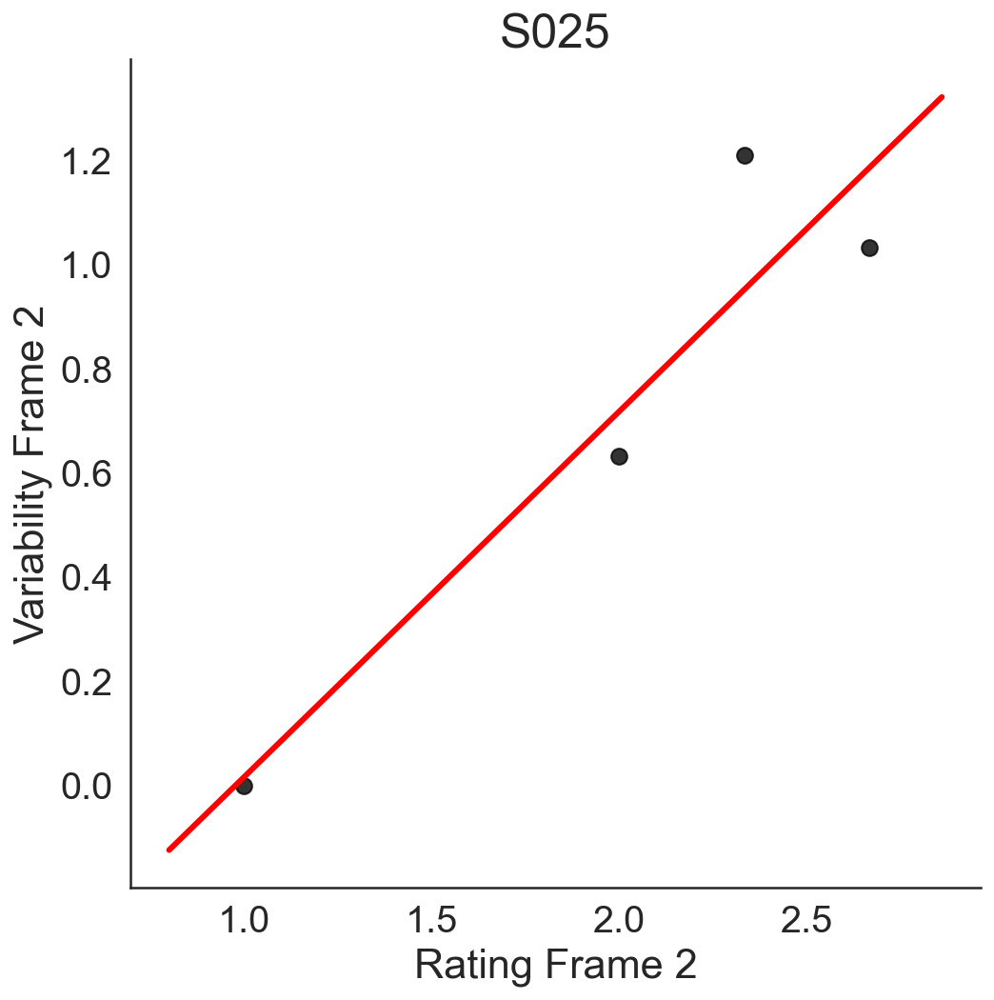

In [42]:
#corrPlotSimple(data_exp_ratings_2, 'rat2','Rating Frame 2','var2','Variability Frame 2')
for part in data_exp1["Part"].unique(): 
    corrPlotSimple(data_exp_ratings_2.loc[(data_exp_ratings_2['Part'] == part)], 'rat2','Rating Frame 2','var2','Variability Frame 2',title = 'S0'+str(part))


## 8. I created an index of partiallity ( how much I like/dislike something, with 0 representing indifference and 2.5 representing absolute like/dislike for that animal)

In [43]:
# if we adapt the rating scale to leave value 2.5 at the center of the scale (0) we can characterize the level of indifference that the animal generates
data_exp_ratings_2['partiality1'] = np.abs(data_exp_ratings_2.rat1-2.5)
data_exp_ratings_2['partiality2'] = np.abs(data_exp_ratings_2.rat2-2.5)

Pearson's r = -0.357 p =  0.0


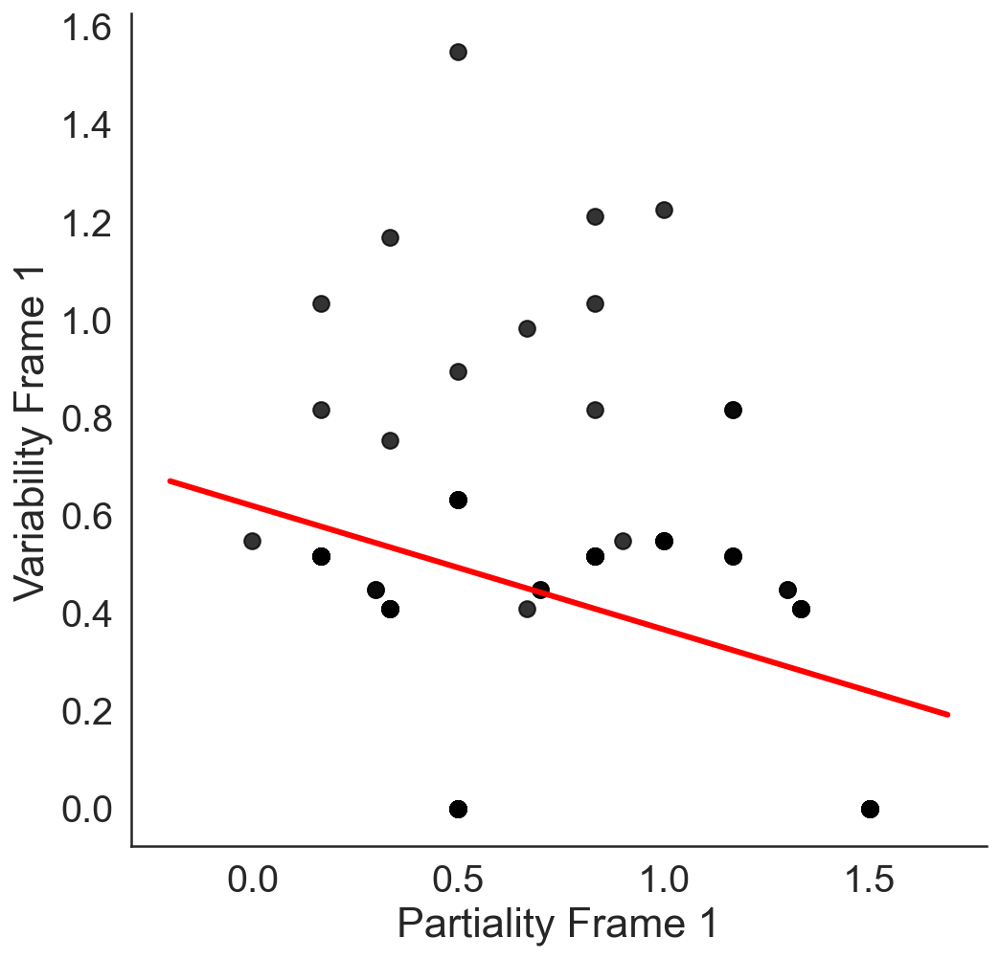

In [44]:
corrPlotSimple(data_exp_ratings_2, 'partiality1','Partiality Frame 1','var1','Variability Frame 1')

Pearson's r = 0.308 p =  0.692
Pearson's r = 0.469 p =  0.531
Pearson's r = -0.992 p =  0.008
Pearson's r = 0.34 p =  0.66
Pearson's r = -0.778 p =  0.222
Pearson's r = -1.0 p =  0.0
Pearson's r = -0.592 p =  0.408
Pearson's r = -0.471 p =  0.529
Pearson's r = -0.728 p =  0.272
Pearson's r = -0.973 p =  0.027
Pearson's r = -0.209 p =  0.791
Pearson's r = -0.117 p =  0.883
Pearson's r = 0.522 p =  0.478
Pearson's r = nan p =  nan
Pearson's r = -0.642 p =  0.358
Pearson's r = -0.602 p =  0.398
Pearson's r = -0.197 p =  0.803
Pearson's r = -0.816 p =  0.184
Pearson's r = 0.363 p =  0.637


/Users/pradyumna/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:4023: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RankWarning: Polyfit may be poorly conditioned
  
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


Pearson's r = -0.869 p =  0.131
Pearson's r = -0.942 p =  0.058
Pearson's r = -0.227 p =  0.773
Pearson's r = -0.972 p =  0.028


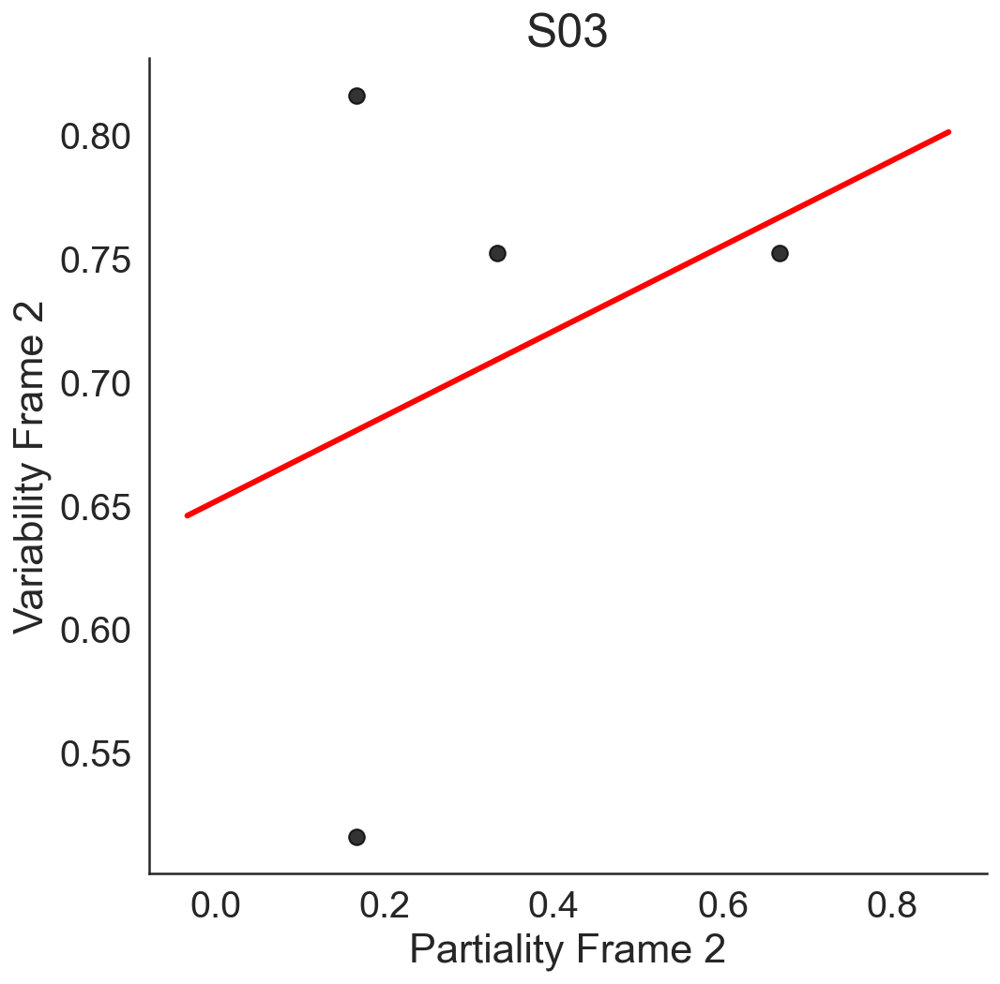

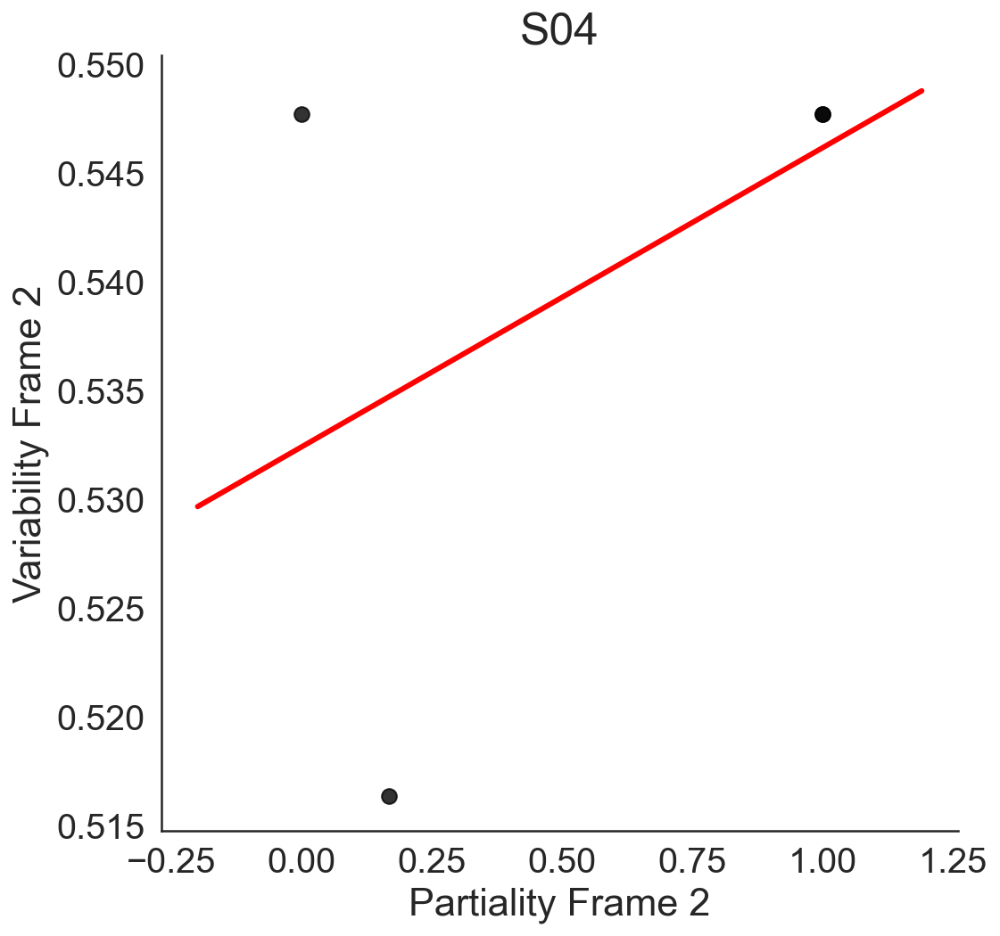

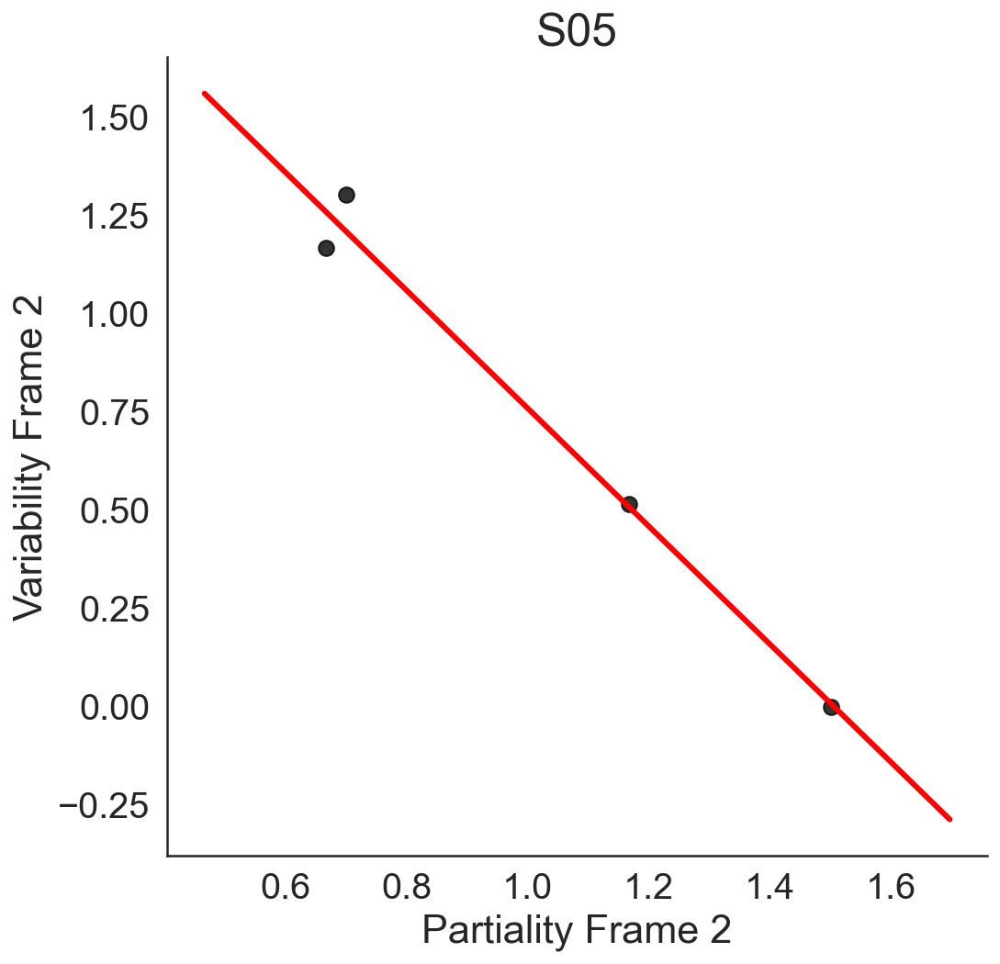

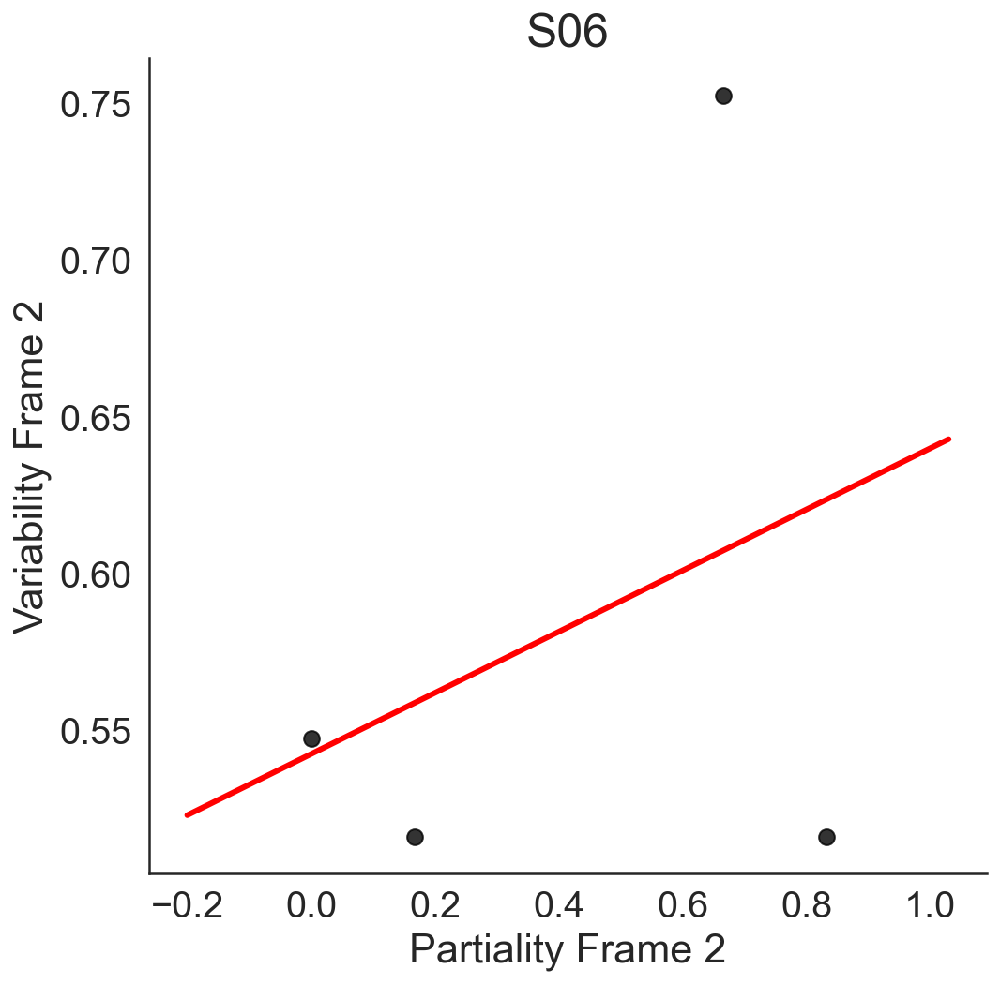

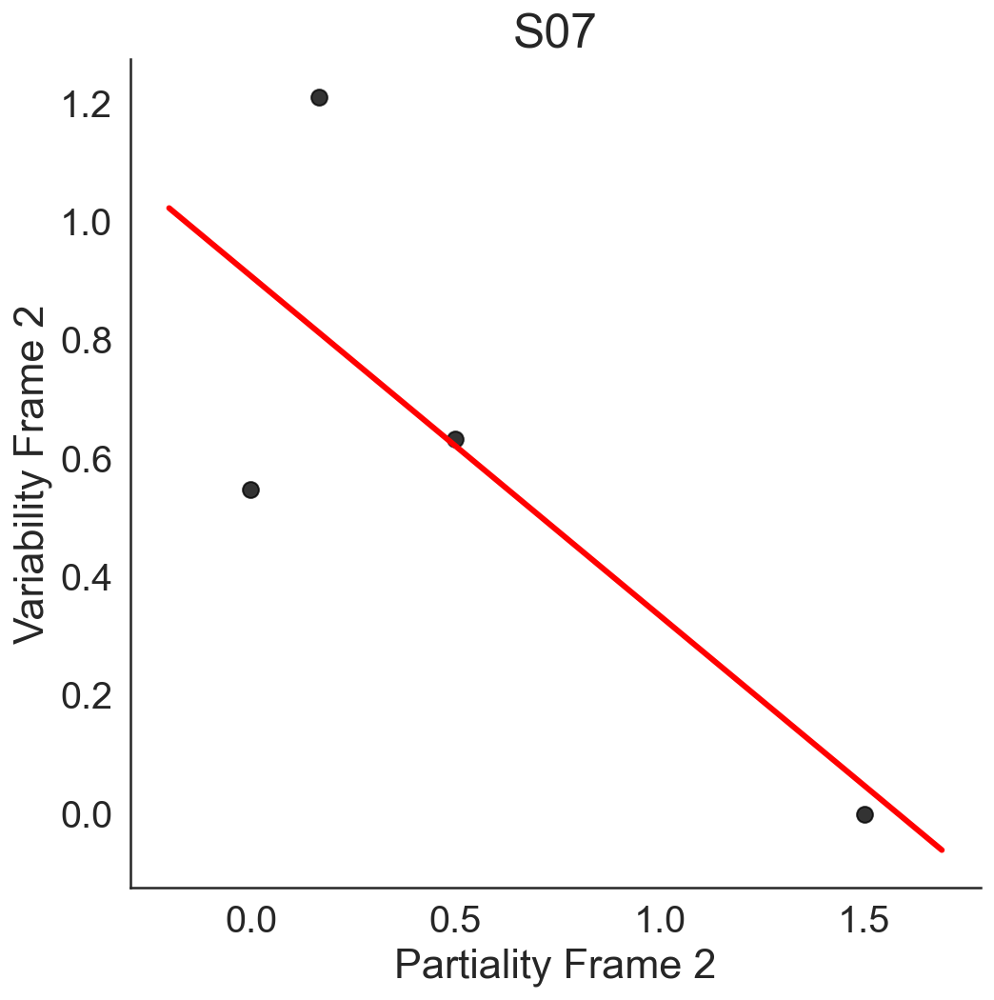

...

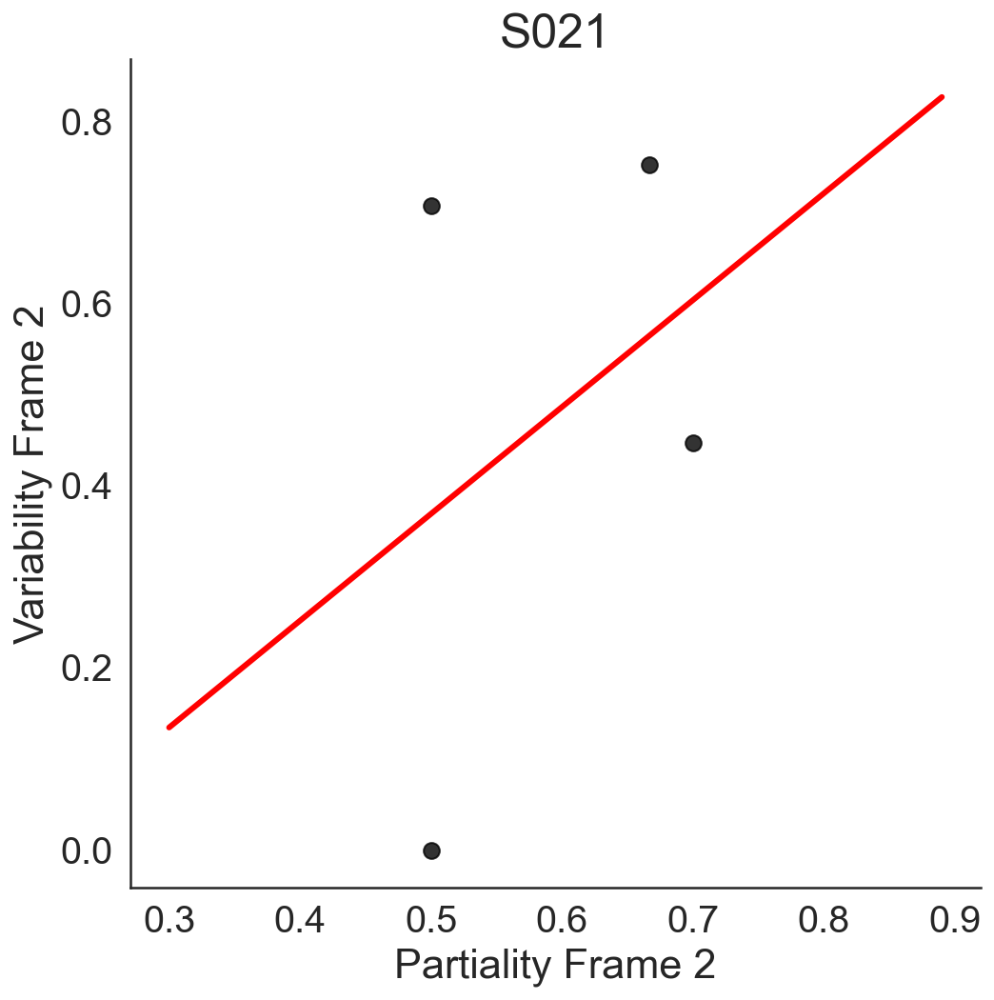

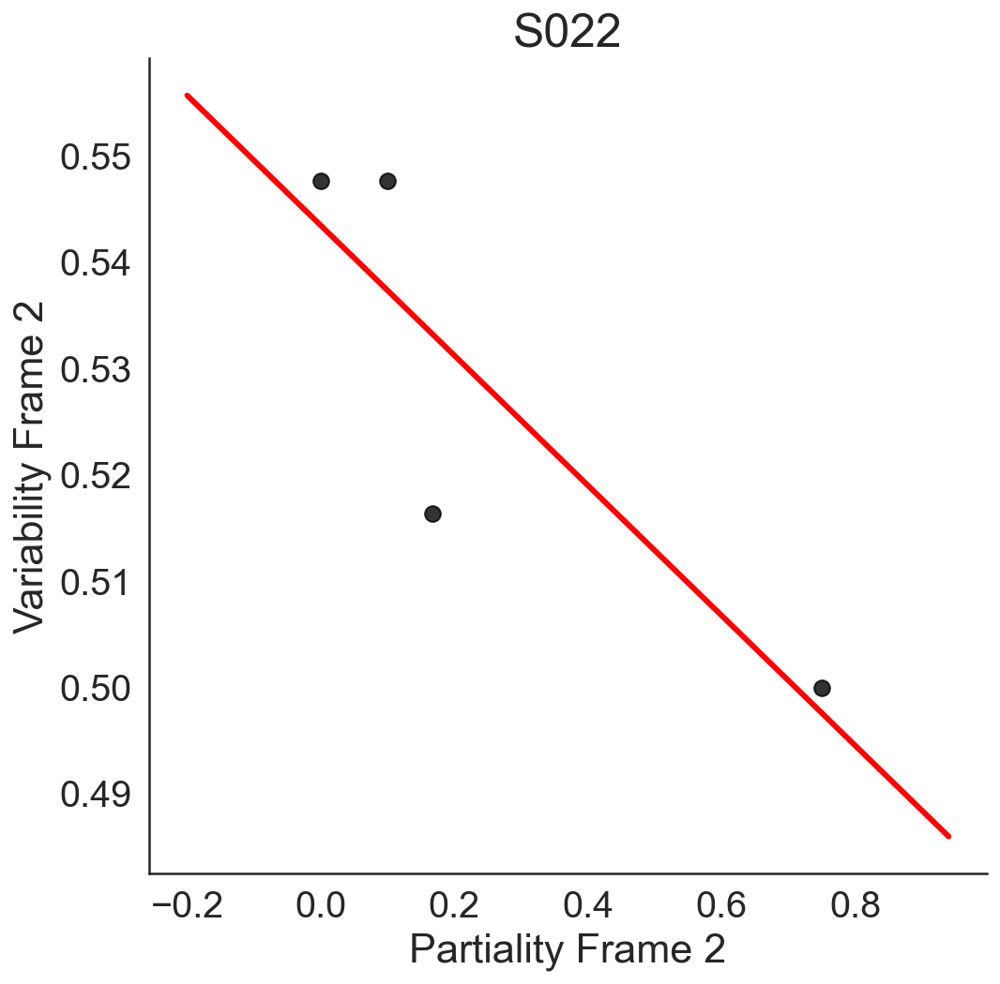

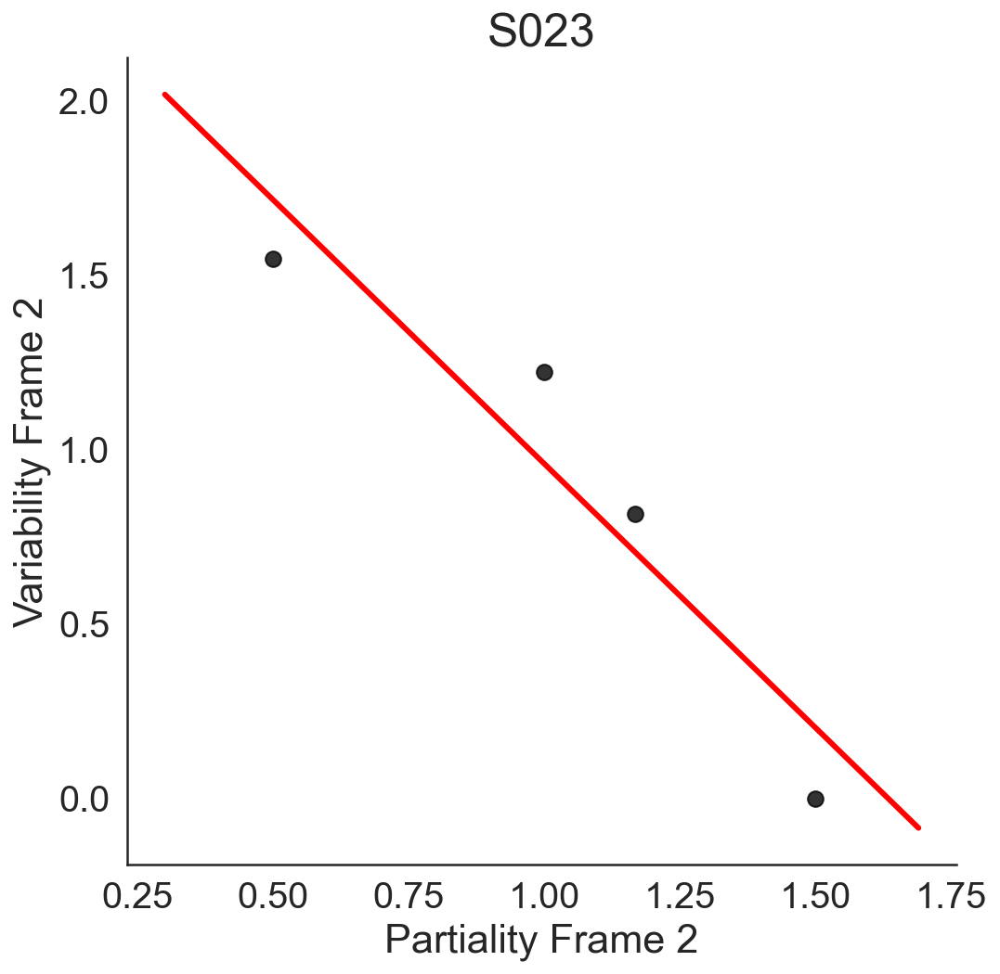

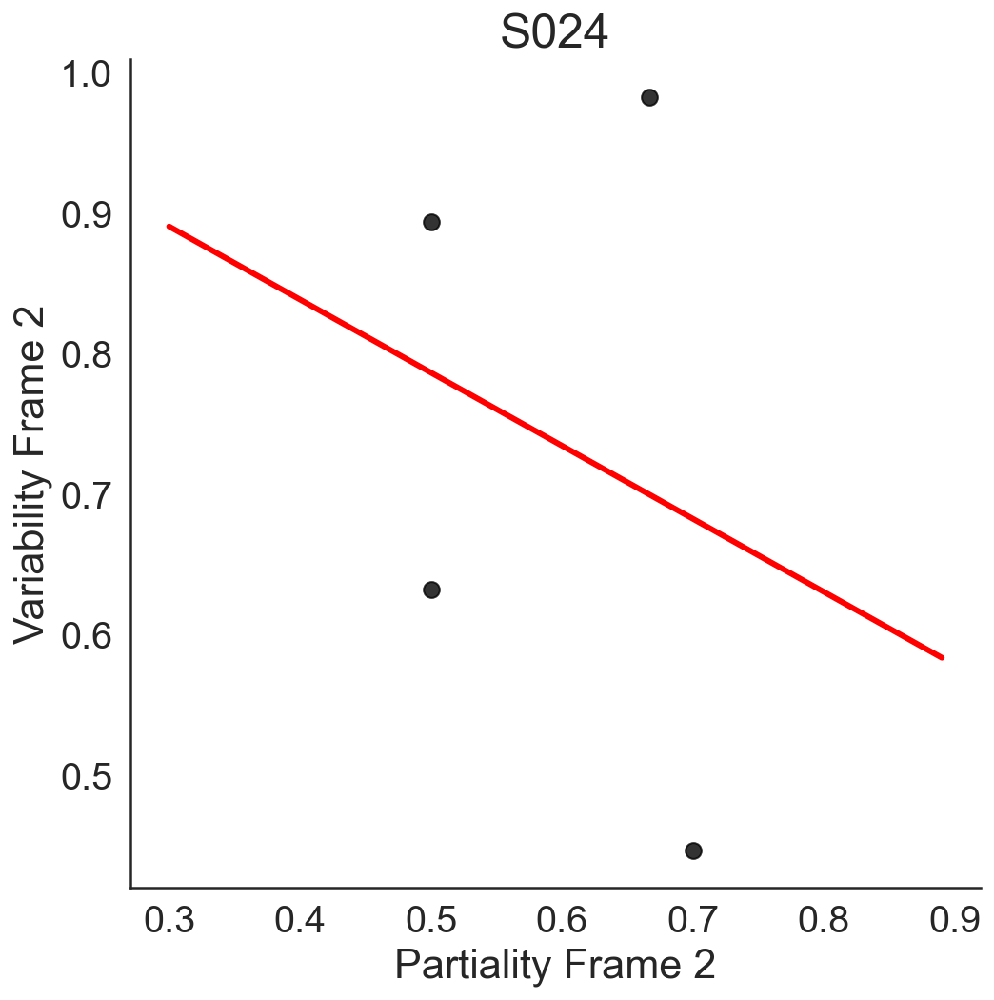

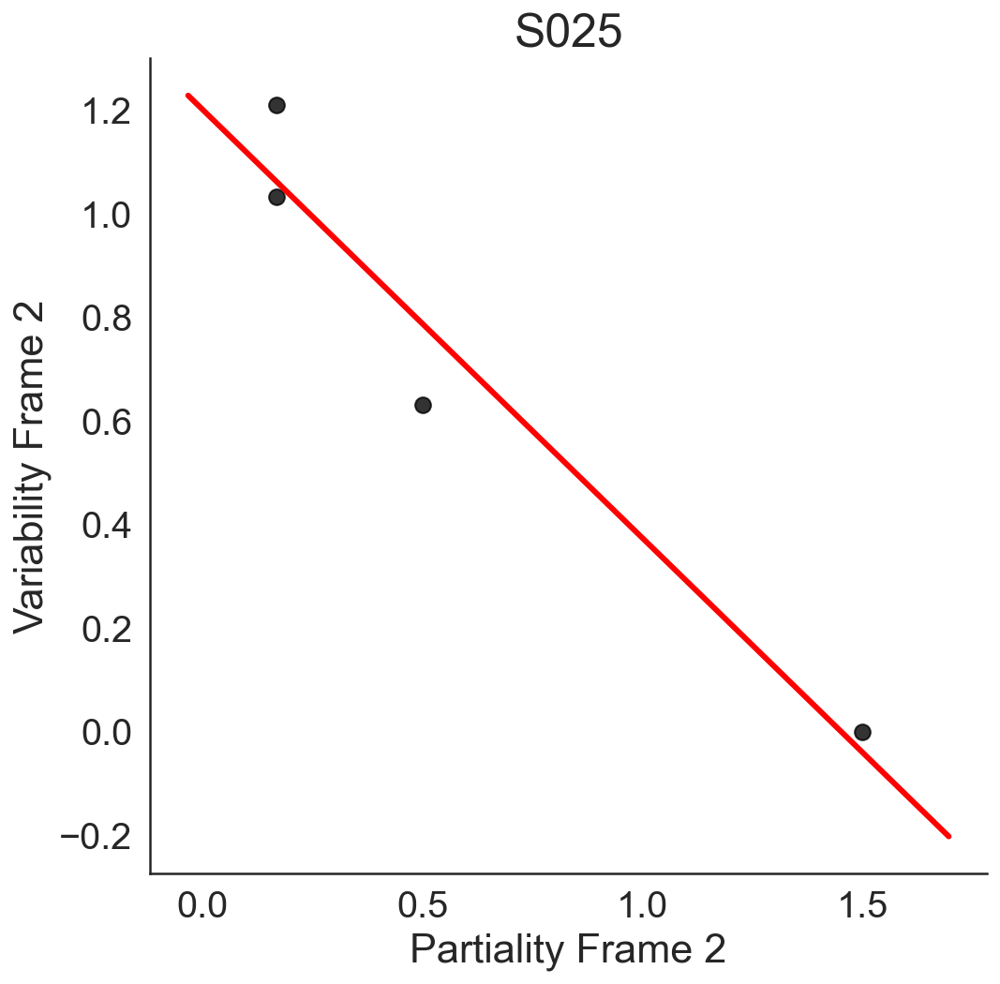

In [45]:
for part in data_exp1["Part"].unique(): 
    corrPlotSimple(data_exp_ratings_2.loc[(data_exp_ratings_2['Part'] == part)], 'partiality2','Partiality Frame 2','var2','Variability Frame 2', title = 'S0'+str(part))

### 

## 9. example ratings for each pet in one participant

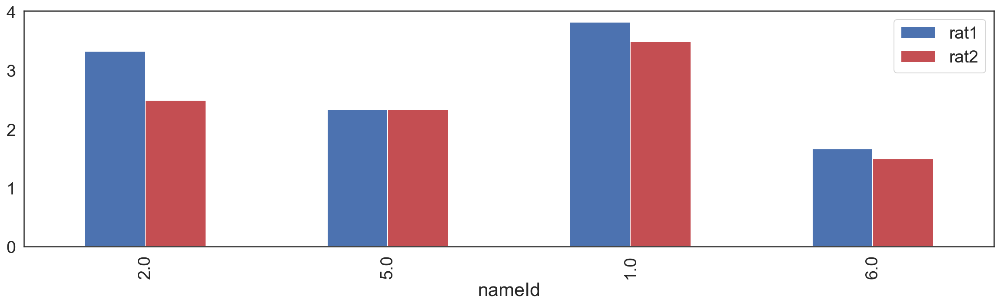

In [46]:
ax = data_exp_ratings_2.loc[(data_exp_ratings_2['Part'] == 4)].plot.bar(x='nameId',y=['rat1','rat2'], figsize=(20,5),color = ['b','r'] )


### **Note**: participant 4 doesn't report ratings for dislike correctly

## 10. example ratings  for each pet for all participants

<AxesSubplot:xlabel='nameId'>

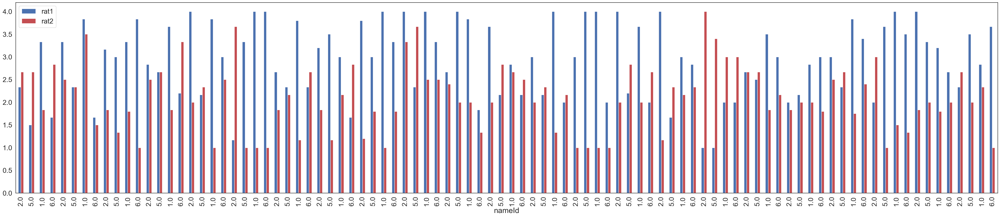

In [47]:
data_exp_ratings_2.plot.bar(x='nameId',y=['rat1','rat2'], figsize=(50,10),color = ['b','r'])

#  Choice data analysis
-----------------------------------------------------------------------

## 1. data visualization

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element po

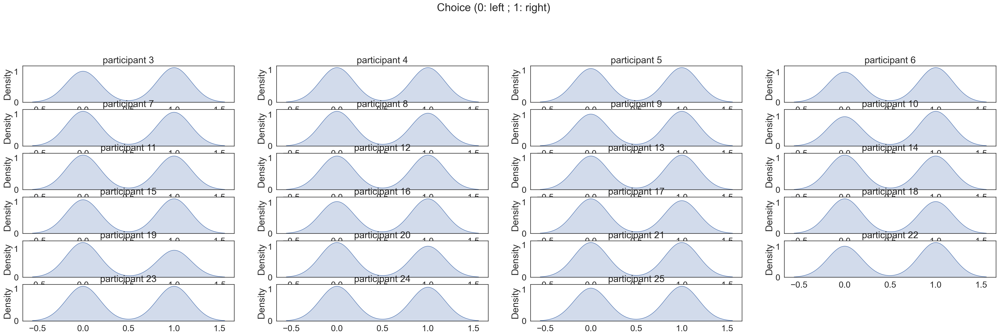

In [48]:
participant_densities(data_exp1,'choices', title = 'Choice (0: left ; 1: right)')

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element po

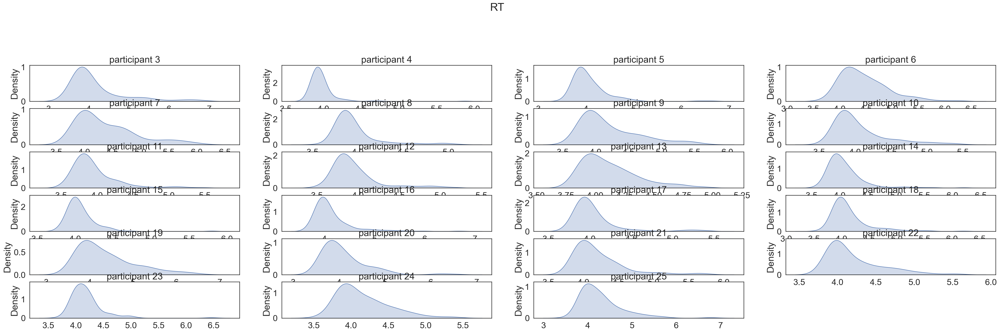

In [49]:
participant_densities(data_exp1,'RT',title = 'RT')

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element po

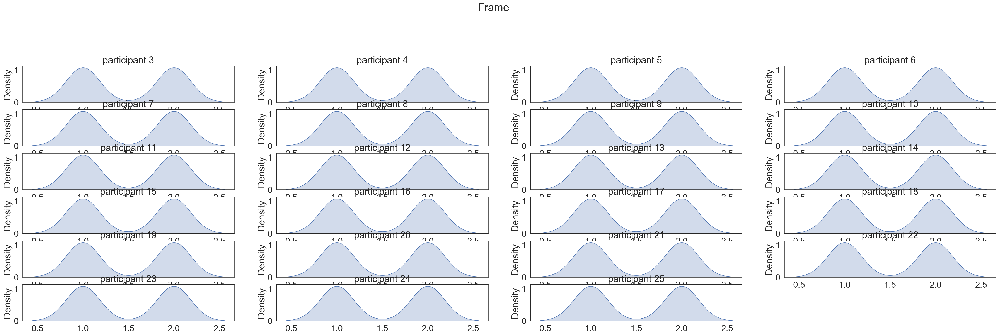

In [50]:
participant_densities(data_exp1,'frame',title = 'Frame')

#### This plot is just to check if I am presenting a comparable number of trials for each frames (in some cases is different because participants can miss the response)

## 2. accuracy per participant

In [51]:
accuracies = pd.DataFrame( columns = [])

In [52]:
accuracy_like = []
accuracy_dislike = []

for i in data_exp1.Part.unique():
    print(i)
    accuracy_like.append(data_exp1.loc[(data_exp1['frame'] == 1) & (data_exp1['Part'] == i)].correct1.mean())
    #print(accuracy_like)

    accuracy_dislike.append(data_exp1.loc[(data_exp1['frame'] == 2) & (data_exp1['Part'] == i)].correct1.mean())
    #print(accuracy_dislike)

accuracies['participant'] = range(len(data_exp1.Part.unique()))
accuracies['like'] = accuracy_like
accuracies['dislike'] = accuracy_dislike


3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25


In [53]:
accuracies

,participant,like,dislike
0,0,0.888889,0.958333
1,1,1.000000,1.000000
2,2,0.166667,0.138889
3,3,0.986111,0.944444
4,4,0.736111,0.611111
5,5,0.986111,1.000000
6,6,0.958333,0.986111
7,7,0.708333,0.708333
8,8,0.972222,0.986111
9,9,0.986111,1.000000


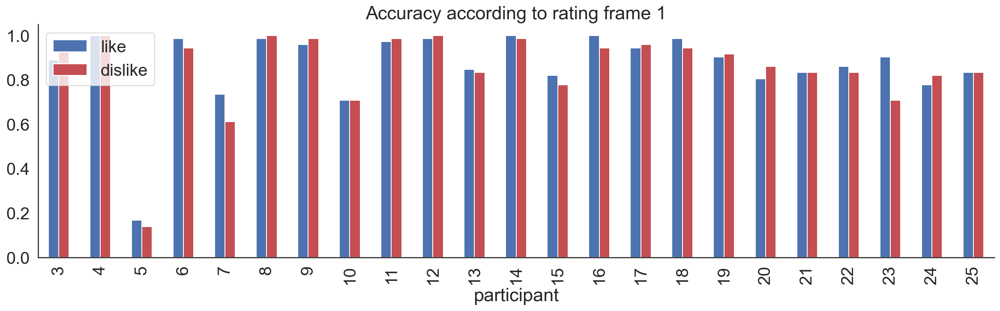

In [54]:
accuracies.plot.bar(x='participant',y=['like','dislike'], figsize=(20,5),title = 'Accuracy according to rating frame 1',color = ['b','r'])
ax.set_ylim(0, 1)
plt.xticks(range(0,len(data_exp1["Part"].unique())), data_exp1["Part"].unique())

sns.despine()


In [55]:
accuracies = pd.DataFrame( columns = [])

In [56]:
accuracy_like = []
accuracy_dislike = []

for i in data_exp1.Part.unique():
    print(i)
    accuracy_like.append(data_exp1.loc[(data_exp1['frame'] == 1) & (data_exp1['Part'] == i)].correct2.mean())
    accuracy_dislike.append(data_exp1.loc[(data_exp1['frame'] == 2) & (data_exp1['Part'] == i)].correct2.mean())
    #print(accuracy_dislike)
accuracies['participant'] = range(len(data_exp1.Part.unique()))
accuracies['like'] = accuracy_like
accuracies['dislike'] = accuracy_dislike

3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25


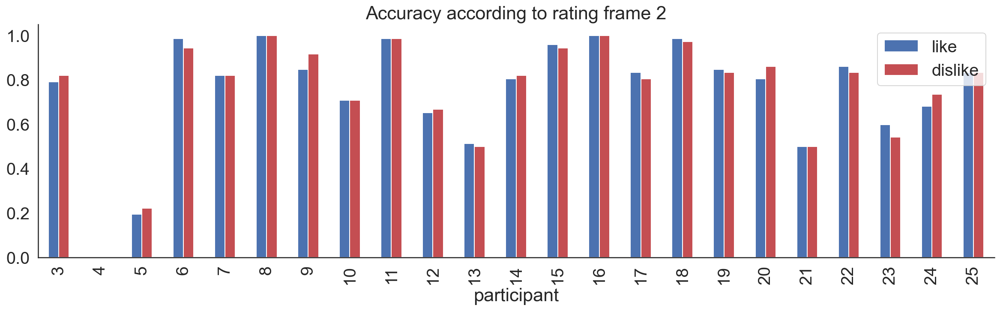

In [57]:
 accuracies.plot.bar(x='participant',y=['like','dislike'], figsize=(20,5),title = 'Accuracy according to rating frame 2',color = ['b','r'])
    
ax.set_ylim(0, 1)
plt.xticks(range(0,len(data_exp1["Part"].unique())), data_exp1["Part"].unique())

sns.despine()

## * Participant 4 didn't report ratings correctly for dislike frame (i.e. reported how much he liked the pet in both cases)

## Split dataframe for like and dislike

In [58]:
data_expL = data_exp1.loc[(data_exp1['frame'] == 1)] # 1 = Like, 2 = Dislike
data_expD = data_exp1.loc[(data_exp1['frame'] == 2)] # 1 = Like, 2 = Dislike

In [59]:
#data_expL = data_exp1.loc[(data_exp1['frame'] == 1) & (data_exp1['Part'] == 4)] # 1 = Like, 2 = Dislike
#data_expD = data_exp1.loc[(data_exp1['frame'] == 2) & (data_exp1['Part'] == 4)] # 1 = Like, 2 = Dislike

## 3. relationship between RT and |DV| (using ratings given in LIKE frame)

Pearson's r = -0.13 p =  0.0


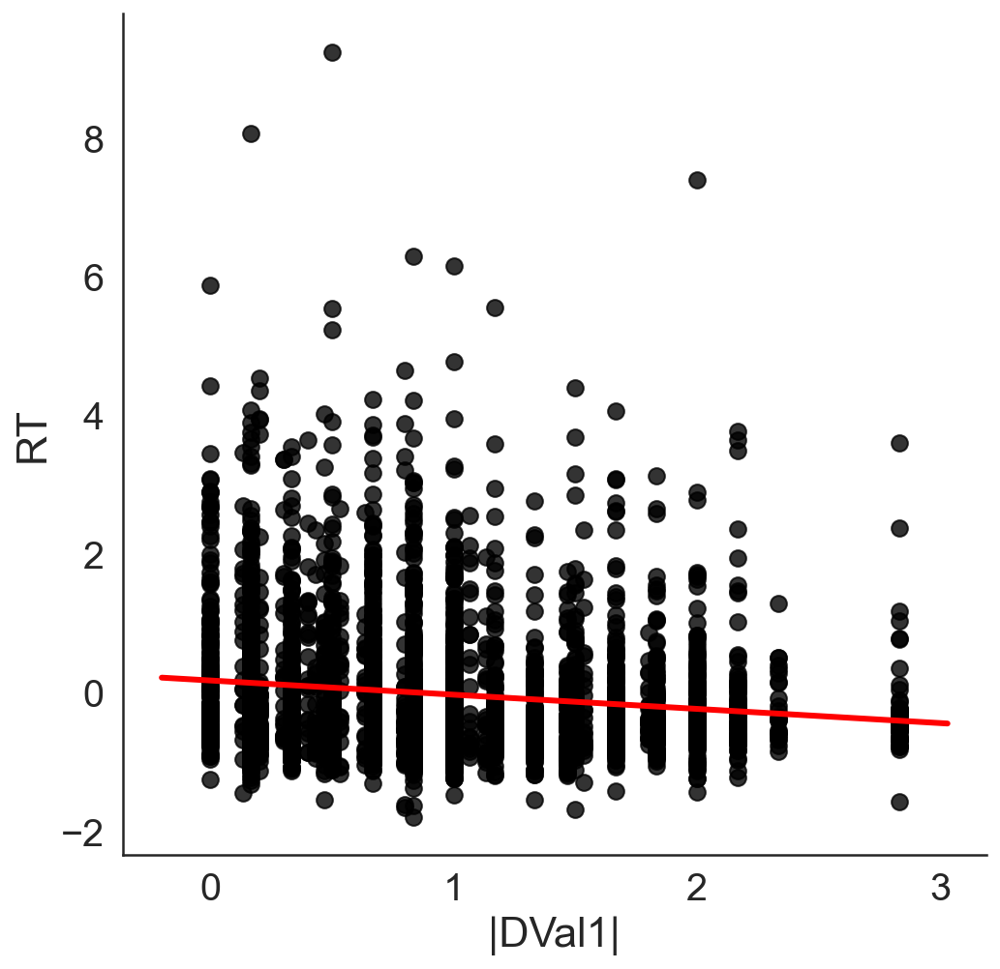

In [60]:
corrPlotSimple(data_exp1, 'absDVal1','|DVal1|','zRT','RT')

## 4. logistic plots for choice in like and dislike frames

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.

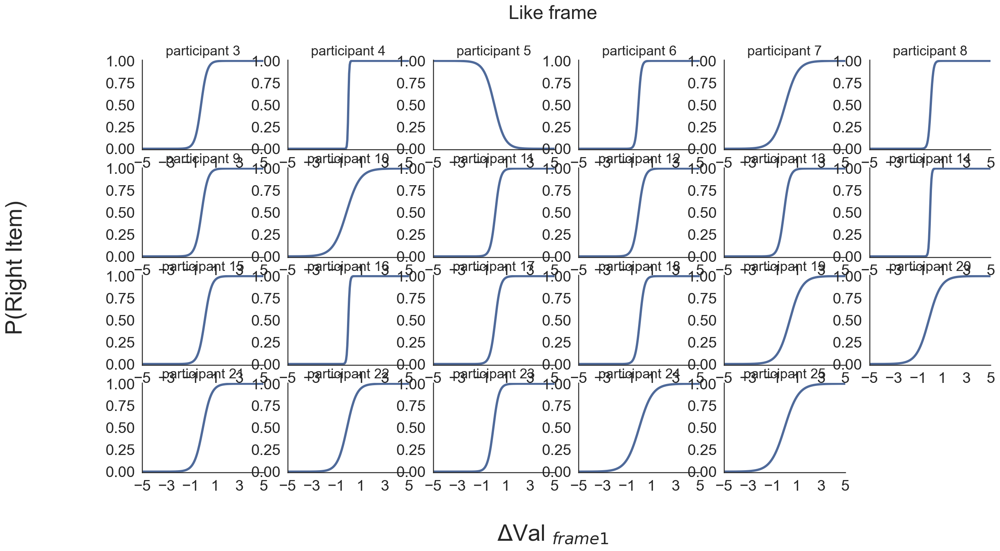

In [61]:
logisticplot_all_part( data=data_expL, xaxis='zDVal1', yaxis='choices', ylab='P(Right Item)', xlab= r'ΔVal $_{frame1}$',
                 modlowcol='#4F6A9A', title='Like frame', parvar='Part')

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.

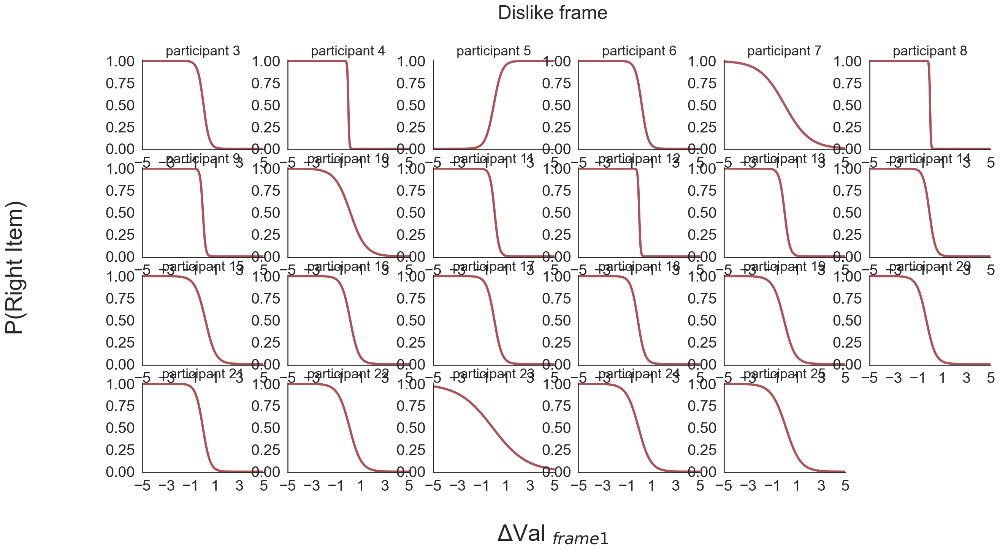

In [62]:
logisticplot_all_part( data=data_expD, xaxis='zDVal1', yaxis='choices', ylab='P(Right Item)', xlab= r'ΔVal $_{frame1}$',
                 modlowcol='#AC5255', title='Dislike frame', parvar='Part')

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

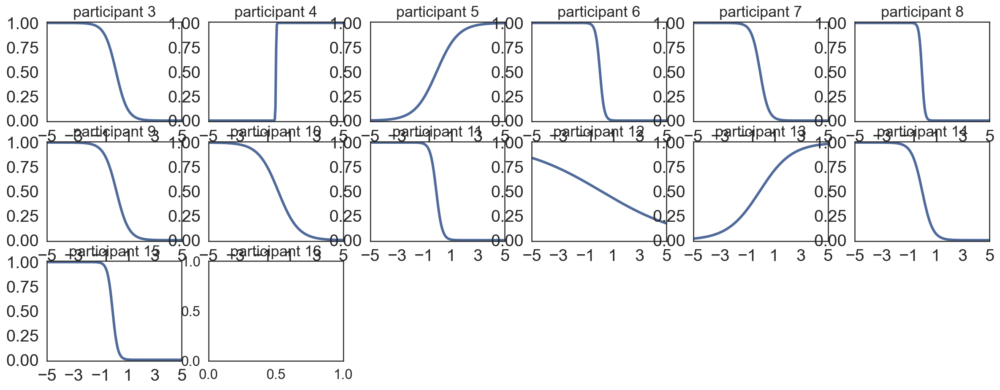

In [64]:
logisticplot_all_part( data=data_expL, xaxis='zDVal2', yaxis='choices', ylab='P(Right Item)', xlab= r'ΔVal $_{frame2}$',
                 modlowcol='#4F6A9A', title='Like frame', parvar='Part')

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

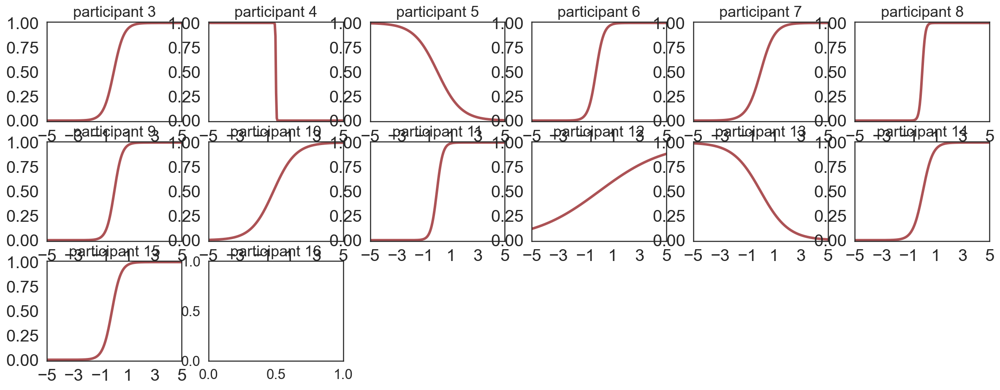

In [65]:
logisticplot_all_part( data=data_expD, xaxis='zDVal2', yaxis='choices', ylab='P(Right Item)', xlab= r'ΔVal $_{frame2}$',
                 modlowcol='#AC5255', title='Dislike frame', parvar='Part')

## 5. considering logistics plots aggregating all participants

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.


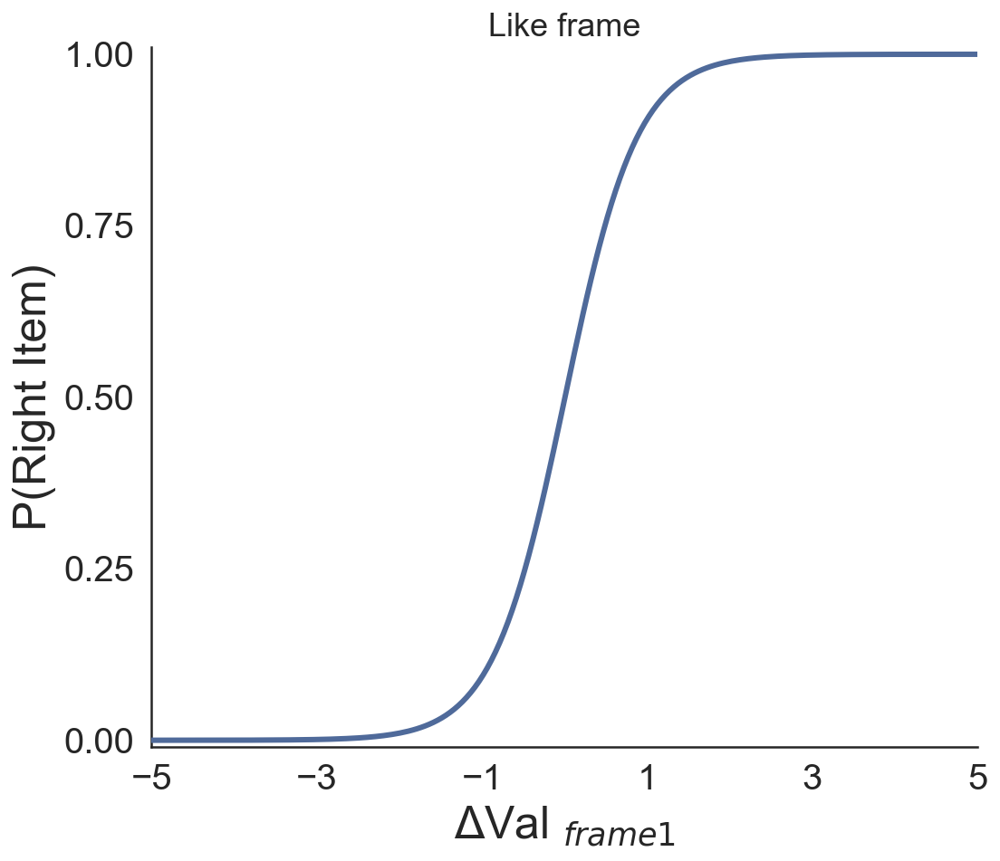

In [66]:
logisticplot_all( data=data_expL, xaxis='zDVal1', yaxis='choices', ylab='P(Right Item)', xlab= r'ΔVal $_{frame1}$',
                 modlowcol='#4F6A9A', title='Like frame', parvar='Part')
plt.tight_layout()

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.


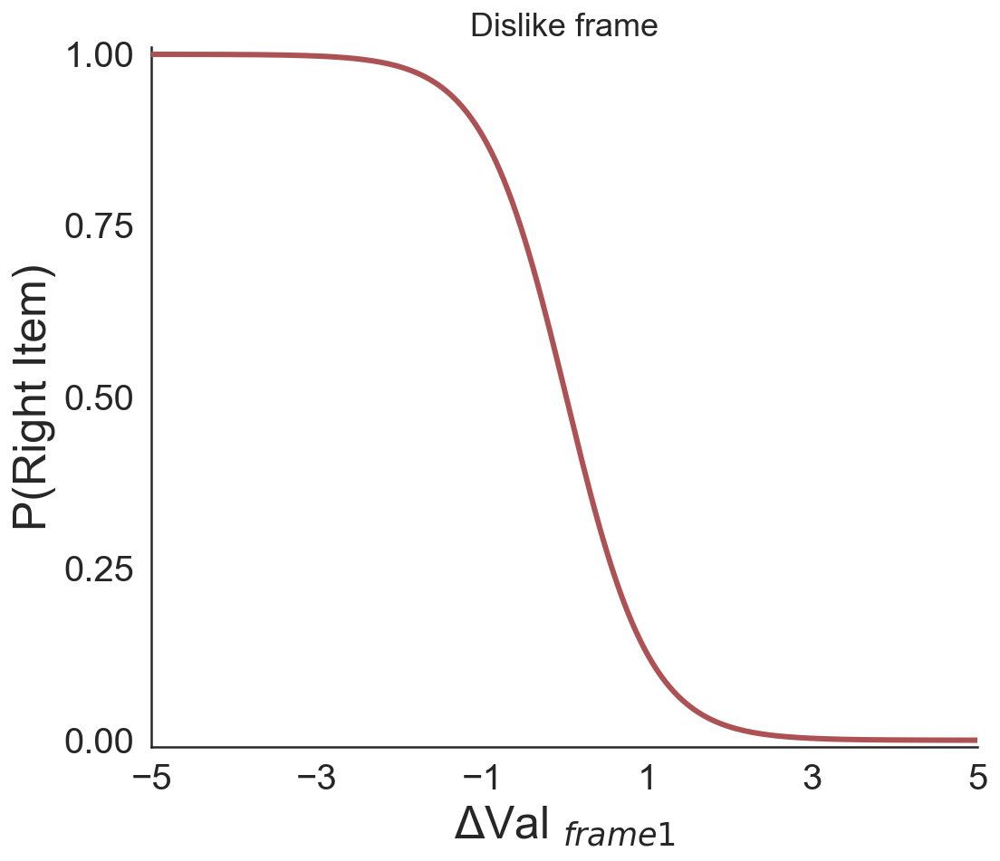

In [67]:
logisticplot_all( data=data_expD, xaxis='zDVal1', yaxis='choices', ylab='P(Right Item)', xlab= r'ΔVal $_{frame1}$',
                 modlowcol='#AC5255', title='Dislike frame', parvar='Part')
plt.tight_layout()

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.


ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

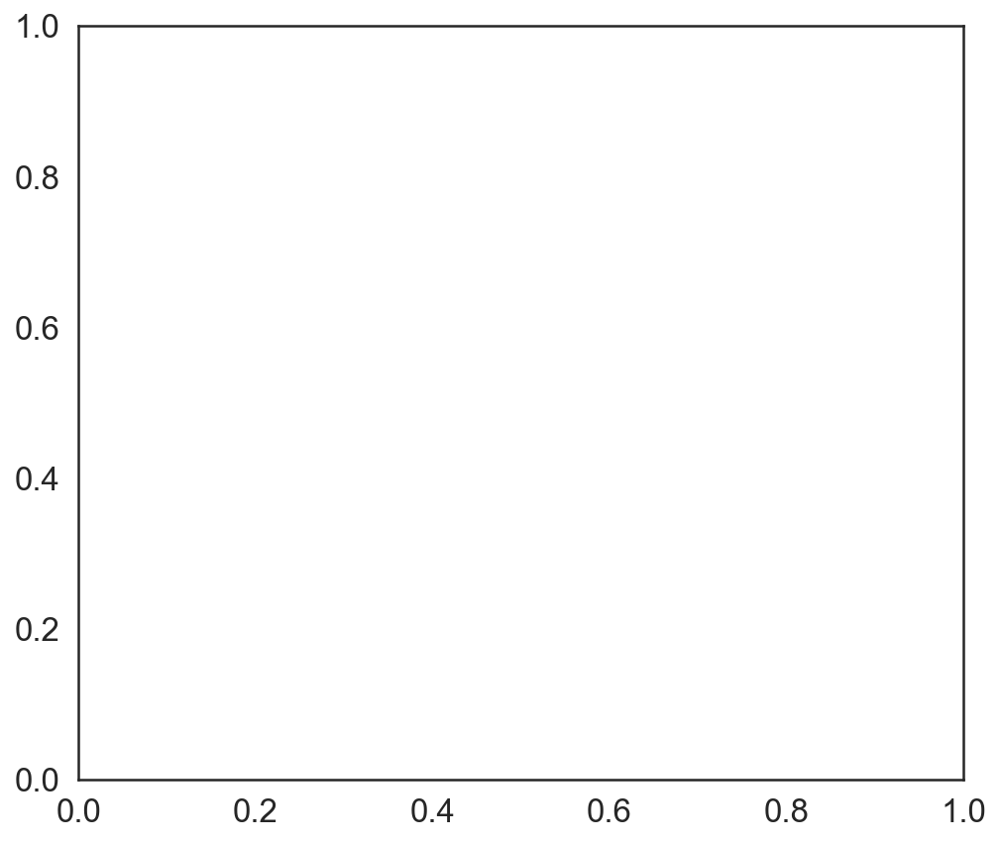

In [68]:
logisticplot_all( data=data_expL, xaxis='zDVal2', yaxis='choices', ylab='P(Right Item)', xlab= r'ΔVal $_{frame2}$',
                 modlowcol='#4F6A9A', title='Like frame', parvar='Part')
plt.tight_layout()

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.


ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

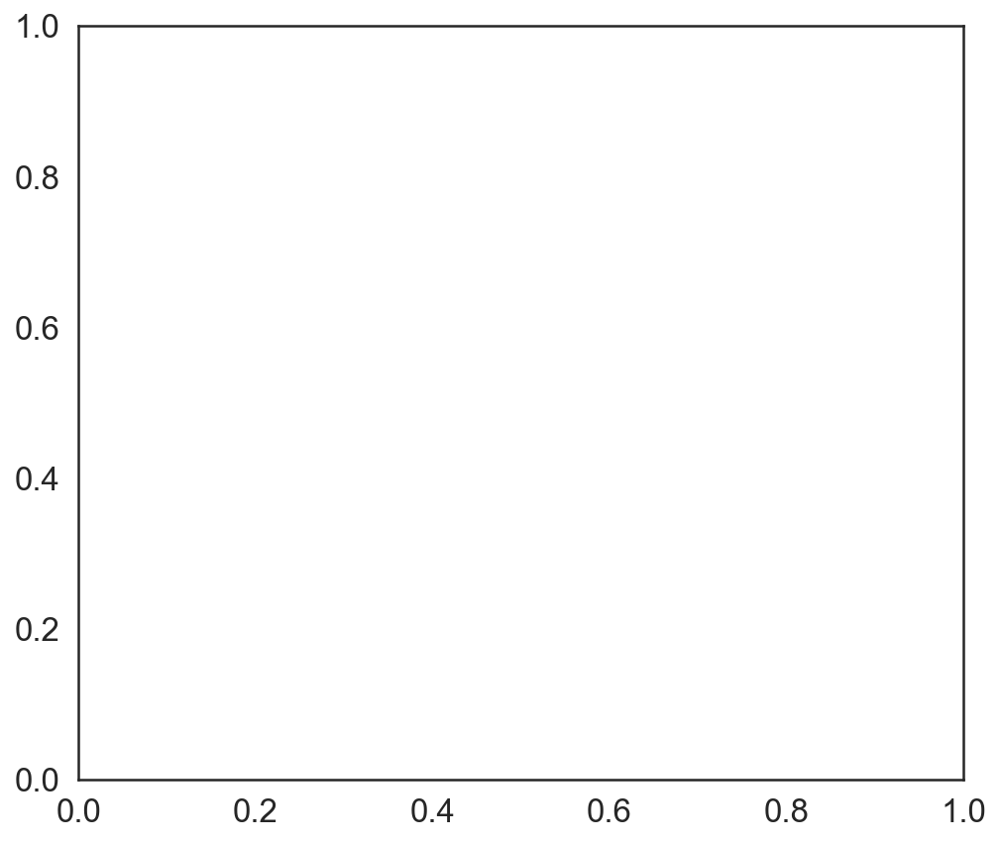

In [69]:
logisticplot_all( data=data_expD, xaxis='zDVal2', yaxis='choices', ylab='P(Right Item)', xlab= r'ΔVal $_{frame2}$',
                 modlowcol='#AC5255', title='Dislike frame', parvar='Part')
plt.tight_layout()

## 6. (preliminar) regression analysis on Choice
### zDVal1: difference in value (mean ratings for pet right -left) in like frame (frame 1)
### zDVal2: difference in value (mean ratings for pet right -left) in dislike frame (frame 2)
### zDVarX: difference in rating variability (mean variability pet right -left)  in frame X


In [70]:
%R -i data_exp1
data_exp1

,index,trial,leftId,rightId,frame,endTime,choice,RT,LRat1,RRat1,...,zDVar1,zabsDVar1,zDVar2,zabsDVar2,zTotVal1,zTotVal2,zRT,correct1,correct2,choices
0,0,0.0,6.0,2.0,2.0,NaN,1.0,6.394748,1.666667,2.333333,...,-5.355114e-16,-1.148483,-1.263697,0.772954,-0.500835,1.107823,3.183484,0,0,1
1,1,1.0,5.0,6.0,1.0,NaN,1.0,4.217651,1.500000,1.666667,...,-1.521503e-01,-0.916784,-0.340678,-0.772954,-1.502506,1.107823,0.056447,1,0,1
2,2,2.0,6.0,2.0,1.0,NaN,1.0,5.529628,1.666667,2.333333,...,-5.355114e-16,-1.148483,-1.263697,0.772954,-0.500835,1.107823,1.940884,1,1,1
3,3,3.0,5.0,6.0,2.0,NaN,-1.0,3.821031,1.500000,1.666667,...,-1.521503e-01,-0.916784,-0.340678,-0.772954,-1.502506,1.107823,-0.513232,1,0,0
4,4,4.0,5.0,2.0,1.0,NaN,1.0,3.865194,1.500000,2.333333,...,-1.521503e-01,-0.916784,-1.604375,1.343534,-0.701170,0.738549,-0.449799,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3307,3307,19.0,2.0,1.0,2.0,NaN,-1.0,3.961115,2.333333,2.833333,...,2.890113e-01,-1.140141,0.234743,-1.398499,-1.623005,1.388730,-0.686258,1,1,0
3308,3308,20.0,2.0,1.0,1.0,NaN,1.0,3.922555,2.333333,2.833333,...,2.890113e-01,-1.140141,0.234743,-1.398499,-1.623005,1.388730,-0.767484,1,1,1
3309,3309,21.0,2.0,6.0,2.0,NaN,-1.0,4.158544,2.333333,3.666667,...,-1.095377e+00,0.459679,-1.360008,1.020707,-0.270501,-0.462910,-0.270383,1,1,0
3310,3310,22.0,1.0,2.0,2.0,NaN,1.0,4.000517,2.833333,2.333333,...,-2.890113e-01,-1.140141,-0.234743,-1.398499,-1.623005,1.388730,-0.603259,1,1,1


In [71]:
%%R
# Separating the data for both conditions 
data_exp1_Like <- data_exp1[ which(data_exp1$frame=='1'), ]
data_exp1_DisLike <- data_exp1[ which(data_exp1$frame=='2'), ]

[1] "Like BIC:"
[1] 1294.996
[1] "DisLike BIC:"
[1] 1431.227


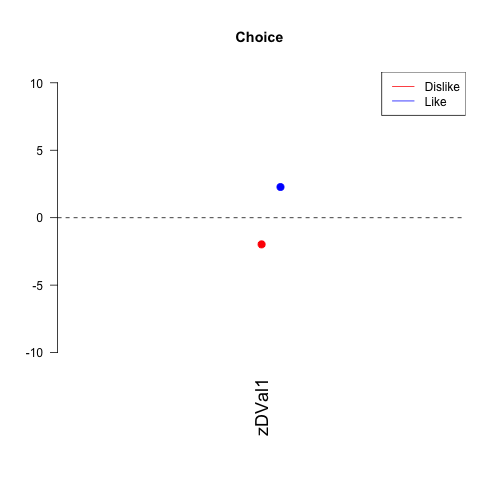

In [72]:
%%R
title_plot = "Choice "

ModelChoiceL_1 <- glm(choices ~ zDVal1 , data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_1 <- glm(choices ~ zDVal1 , data=data_exp1_DisLike, family=binomial(link="logit"))

BIC1 = BIC(ModelChoiceL_1)
BIC2 = BIC(ModelChoiceD_1)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelChoiceD_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-10, 10) ,main=title_plot)
coefplot(ModelChoiceL_1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 1878.794
[1] "DisLike BIC:"
[1] 1905.321


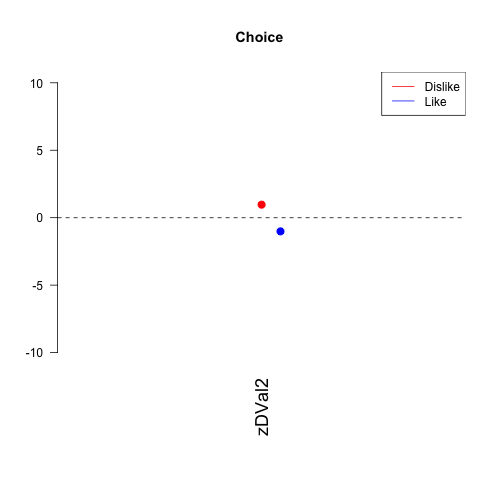

In [73]:
%%R
title_plot = "Choice "

ModelChoiceL_1 <- glm(choices ~ zDVal2 , data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_1 <- glm(choices ~ zDVal2 , data=data_exp1_DisLike, family=binomial(link="logit"))

BIC1 = BIC(ModelChoiceL_1)
BIC2 = BIC(ModelChoiceD_1)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelChoiceD_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-10, 10) ,main=title_plot)
coefplot(ModelChoiceL_1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

#### As expected, we observe that the rating given in dislike frame (Frame 2) accounts for the most disliked option

[1] "Like BIC:"
[1] 1192.375
[1] "DisLike BIC:"
[1] 1320.157


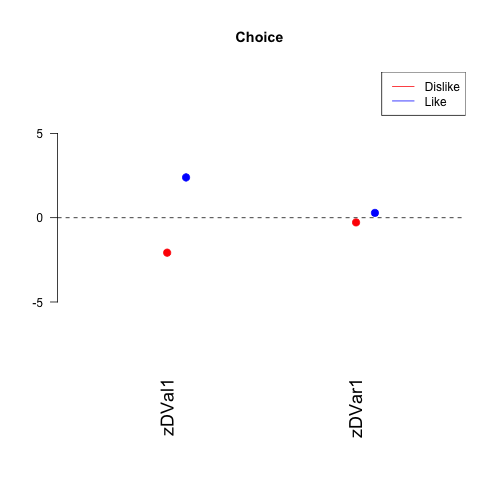

In [74]:
%%R
title_plot = "Choice "

ModelChoiceL_1 <- glm(choices ~ zDVal1 + zDVar1  , data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_1 <- glm(choices ~ zDVal1 + zDVar1  , data=data_exp1_DisLike, family=binomial(link="logit"))

BIC1 = BIC(ModelChoiceL_1)
BIC2 = BIC(ModelChoiceD_1)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelChoiceD_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-8, 8) ,main=title_plot)
coefplot(ModelChoiceL_1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 1886.141
[1] "DisLike BIC:"
[1] 1911.967


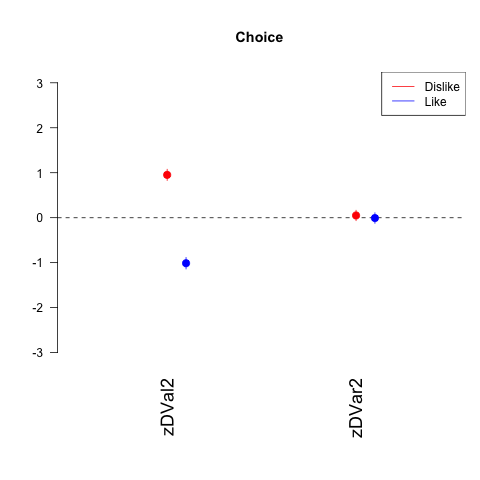

In [75]:
%%R
title_plot = "Choice "

ModelChoiceL_1 <- glm(choices ~ zDVal2 + zDVar2  , data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_1 <- glm(choices ~ zDVal2 + zDVar2  , data=data_exp1_DisLike, family=binomial(link="logit"))

BIC1 = BIC(ModelChoiceL_1)
BIC2 = BIC(ModelChoiceD_1)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelChoiceD_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-3, 3) ,main=title_plot)
coefplot(ModelChoiceL_1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

#### the difference in variability between items seems to not have an effect

## Since I don't have confidence I try to predict RT

[1] "Like BIC:"
[1] 4628.894
[1] "DisLike BIC:"
[1] 4654.249


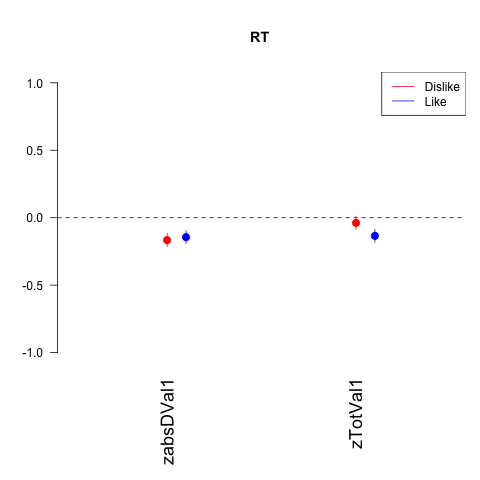

In [76]:
%%R
title_plot = "RT "

ModelChoiceL_1 <- glm(zRT ~ zabsDVal1 + zTotVal1  , data=data_exp1_Like, )
ModelChoiceD_1 <- glm(zRT ~ zabsDVal1 + zTotVal1  , data=data_exp1_DisLike, )

BIC1 = BIC(ModelChoiceL_1)
BIC2 = BIC(ModelChoiceD_1)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelChoiceD_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-1, 1) ,main=title_plot)
coefplot(ModelChoiceL_1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 4417.702
[1] "DisLike BIC:"
[1] 4489.75


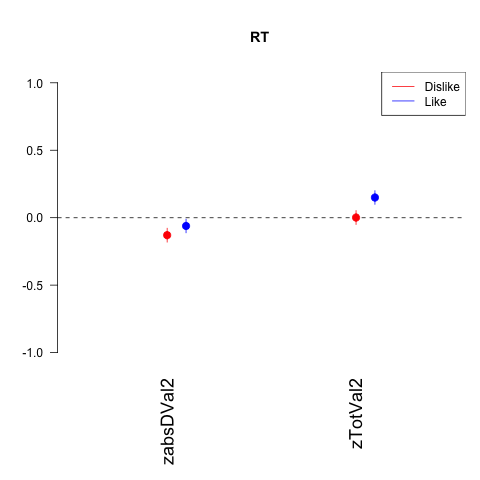

In [77]:
%%R
title_plot = "RT "

ModelChoiceL_1 <- glm(zRT ~ zabsDVal2 + zTotVal2  , data=data_exp1_Like, )
ModelChoiceD_1 <- glm(zRT ~ zabsDVal2 + zTotVal2  , data=data_exp1_DisLike, )

BIC1 = BIC(ModelChoiceL_1)
BIC2 = BIC(ModelChoiceD_1)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelChoiceD_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-1, 1) ,main=title_plot)
coefplot(ModelChoiceL_1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

-----------------------------------------------------

# Import toolboxes and functions

In [ ]:
import numpy as np
import pandas as pd
from pandas.core.frame import DataFrame as DF

import seaborn as sns
sns.set(color_codes=True)
#np.random.seed(sum(map(ord, "distributions")))
from sklearn import linear_model  # packages for the logistic regression function to plot the logistic regression 
from sklearn.linear_model import LogisticRegression # packages for the logistic regression function to plot the logistic regression 
import scipy
from scipy import stats, integrate
from scipy.stats import mode
from scipy.stats.stats import pearsonr # Pearson's correlation
from copy import copy as copy
import operator as operator
import pylab

# Plotting tools
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
%pylab inline
figsize(5, 5)

import glob

import os
# Added to avoid OMP:error#15
os.environ['KMP_DUPLICATE_LIB_OK']='True'

In [4]:
def logisticplot_all (data, xaxis='zDV', yaxis='G_choice', ylab='P(Chose Reference Item)', xlab='DV (Z-score)',
                 modlowcol='#AAAAAA', title='empty', parvar='SubNo'):
    
    sns.set(font_scale=1.5, style='white')
    fig = figure(figsize=(8,7))
    fig.set_facecolor('white')
    
    # defining the sigmoid function
    def model(x):
        y = 1 / (1 + np.exp(-x))
        return y
    
    sub = plt.subplot()

    #run the classifier
    clf = linear_model.LogisticRegression(C=1e5)

    logit_all = {}

    # I think this defines the problem space
    X_test = np.linspace(-5,10,300)

   #fitting the predictive logistic model for all the trials, for a participant specified by x
            # first I specify the value difference right - left, then I specify the choices, left or right
    clf.fit(data[xaxis][:, np.newaxis],
            data[yaxis])
    logit_all = model(X_test * clf.coef_ + clf.intercept_).ravel()

    #print ('Part: ',x ,' High measure:logit coef =',clf.coef_, '; Intercept: ', clf.intercept_)
    
    all_coef = clf.coef_
    all_intercept = clf.intercept_
    
    #Plotting the predictive lines
    line_all = sub.plot(X_test, logit_all, color=modlowcol, linewidth=3, zorder=5,linestyle='-')

   # #Plotting the binned data
   # data['DVBin2'] = data.groupby(parvar).apply(parsplit, input=xaxis, quantiles=4).values
    
   # # determine the x coordinates
   # x_cords= data.groupby('DVBin2')[xaxis].mean()
    
   # # determine low y coordinates
   # y_cords_low = data.loc[(data[moderator]==0), :].groupby('DVBin2')[yaxis].mean().values
    
   # # determine low y standard errors
   # test = pd.DataFrame(data.loc[(data[moderator]==0), :].groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
   # y_low_error = test.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))
    
    
   # # determine high y coordinates
   # y_cords_high = data.loc[(data[moderator]==1), :].groupby('DVBin2')[yaxis].mean().values
    
   # # determine high y standard errors
   # test2 = pd.DataFrame(data.loc[data[moderator]==1, :].groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
   # y_high_error = test2.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))
    
   # # plot the low points
   # plt.scatter(x_cords, y_cords_low, c=modlowcol, marker='D', s=60, zorder=1)
   # # plot low error bars
   # plt.errorbar(x_cords, y_cords_low, yerr=y_low_error, fmt='o', zorder=3, c=modlowcol)
    
   # # plot the high points
   # plt.scatter(x_cords, y_cords_high, c=modhighcol, marker='o', s=60, zorder=2)
   # # plot high error bars
   # plt.errorbar(x_cords, y_cords_high, yerr=y_high_error, fmt='o', zorder=4, c=modhighcol)
    
    
    # Set Labels
    sub.set_ylabel(ylab, fontsize=25)
    sub.set_xlabel(xlab, fontsize=25)

    # Set Ticks
    sub.set_xticks((-5,-3,-1,1,3,5))
    sub.set_yticks((0,0.25,0.5,0.75,1))
    sub.tick_params(axis='both', which='major', labelsize=20)

    # Set Limits
    sub.set_ylim(-0.01, 1.01)
    sub.set_xlim(-5, 5)

    # Set Title
    if title == 'empty':
        sub.set_title('')
    else:
        sub.set_title(title)
    
    #sub.legend(loc=0, prop={'size':20})
    sns.despine()

In [5]:
def logisticplot_all_part (data, xaxis='zDV', yaxis='G_choice', ylab='P(Chose Reference Item)', xlab='DV (Z-score)',
                 modlowcol='#AAAAAA', title='empty', parvar='SubNo'):
    
 
    # a list of all the participants in the dataset
    participants = data.loc[:, 'Part'].unique()
    fig = figure(figsize=(20,10))
    fig.set_facecolor('white')
    
    
    # Counter to know where to plot the particpant
    order = 1

    
    for x in participants:

            sub={}
            sub['%s' % x] = plt.subplot(int(len(participants)/6+1), 6, order)

            data_in = data.loc[data['Part'] == x]
            sns.set(font_scale=1.5, style='white')
            
            # defining the sigmoid function
            def model(x):
                y = 1 / (1 + np.exp(-x))
                return y

            sub['%s' % x].set_title('participant %s' % x)


            #run the classifier
            clf = linear_model.LogisticRegression(C=1e5)

            logit_all = {}

            # I think this defines the problem space
            X_test = np.linspace(-5,10,300)

           #fitting the predictive logistic model for all the trials, for a participant specified by x
                    # first I specify the value difference right - left, then I specify the choices, left or right
            clf.fit(data_in[xaxis][:, np.newaxis],
                    data_in[yaxis])
            logit_all = model(X_test * clf.coef_ + clf.intercept_).ravel()

            #print ('Part: ',x ,' High measure:logit coef =',clf.coef_, '; Intercept: ', clf.intercept_)

            all_coef = clf.coef_
            all_intercept = clf.intercept_

            #Plotting the predictive lines
            line_all = sub['%s' % x].plot(X_test, logit_all, color=modlowcol, linewidth=3, linestyle='-')
            #line_all = sub['%s' % x].plot(X_test, logit_all, color="#000000", linewidth=3, label=modlow, zorder=5,linestyle='--')

           # #Plotting the binned data
           # data['DVBin2'] = data.groupby(parvar).apply(parsplit, input=xaxis, quantiles=4).values

           # # determine the x coordinates
           # x_cords= data.groupby('DVBin2')[xaxis].mean()

           # # determine low y coordinates
           # y_cords_low = data.loc[(data[moderator]==0), :].groupby('DVBin2')[yaxis].mean().values

           # # determine low y standard errors
           # test = pd.DataFrame(data.loc[(data[moderator]==0), :].groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
           # y_low_error = test.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))

    
           # # determine high y coordinates
           # y_cords_high = data.loc[(data[moderator]==1), :].groupby('DVBin2')[yaxis].mean().values

           # # determine high y standard errors
           # test2 = pd.DataFrame(data.loc[data[moderator]==1, :].groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
           # y_high_error = test2.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))

           # # plot the low points
           # plt.scatter(x_cords, y_cords_low, c=modlowcol, marker='D', s=60, zorder=1)
           # # plot low error bars
           # plt.errorbar(x_cords, y_cords_low, yerr=y_low_error, fmt='o', zorder=3, c=modlowcol)

           # # plot the high points
           # plt.scatter(x_cords, y_cords_high, c=modhighcol, marker='o', s=60, zorder=2)
           # # plot high error bars
           # plt.errorbar(x_cords, y_cords_high, yerr=y_high_error, fmt='o', zorder=4, c=modhighcol)

    
            # Set Labels
            #sub['%s' % x].set_ylabel(ylab, fontsize=30)
           # sub['%s' % x].set_xlabel(xlab, fontsize=30)

            # Set Ticks
            sub['%s' % x].set_xticks((-5,-3,-1,1,3,5))
            sub['%s' % x].set_yticks((0,0.25,0.5,0.75,1))
            sub['%s' % x].tick_params(axis='both', which='major', labelsize=20)

            # Set Limits
            sub['%s' % x].set_ylim(-0.01, 1.01)
            sub['%s' % x].set_xlim(-5, 5)
            order += 1


    fig.text(0.5, 0.0, xlab, fontsize= 30, ha='center')
    fig.text(0.0, 0.5, ylab,fontsize= 30, va='center', rotation='vertical')
    
    #sub.legend(loc=0, prop={'size':20})
    fig.suptitle(title, fontsize = 25)

    
    sns.despine()

In [6]:
def z_score1(data_all, part_def,z_score_var):
    z_matrix=[]
    z_matrix_aux=[]

    for i in (data_all[part_def].unique()):
        Choicedata = data_all.loc[data_all[part_def] == i]    
    
        pX_A= pd.to_numeric(Choicedata[z_score_var]) 
        pX_zA= (pX_A - np.mean(pX_A))/np.std(pX_A)

        z_matrix_aux= pX_zA.values
    
        for  j in range(len(z_matrix_aux)):    
            z_matrix.append(z_matrix_aux[j])
    return z_matrix

In [7]:
def participant_densities(data, var, xlim=(0,100), rug=True, title = ''):
    # a counter that tells us where a given participant's data should be plotted
    order = 1

    # a list of all the participants in the dataset
    participants = data.loc[:, 'Part'].unique()

    # defining the figure size
    sns.set_style('white')
    fig = figure(figsize=(40,20))

    for x in participants:
        # defining the sub figures
            sub={}
            sub['%s' % x] = plt.subplot(len(participants)/2, 4, order)
            sns.kdeplot(data.loc[data['Part'] == x, var].values, ax = sub['%s' % x], shade=True)
            #if rug==True:
            #    sns.rugplot(data.loc[data['Part'] == x, var].values, ax = sub['%s' % x])
            sub['%s' % x].set_title('participant %s' % x)
            #sub['%s' % x].set_xlim(xlim)
            order += 1
    fig.suptitle(title, fontsize = 25)


In [8]:
def corrPlotSimple(data_exp1, x_variable,x_varlabel,y_variable,y_varlabel, title=''):
    
    data_exp1_drop = data_exp1.dropna(subset=[x_variable,y_variable])

    results = pearsonr(data_exp1_drop[x_variable], data_exp1_drop[y_variable])
    print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))
    
    f = plt.figure(figsize=(8, 8))
    sns.set(style='white', font_scale=1.8)
    ax = sns.regplot(data=data_exp1_drop, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
    ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
    x=data_exp1_drop[x_variable]
    y=data_exp1_drop[y_variable]
    fit = np.polyfit(x, y, deg=1)
    future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
    fit_fn = np.poly1d(fit)
    future_fit = np.polyval(fit_fn, future)
    ax.plot(future, future_fit, color='Red', lw=3)
    ax.set_title(title, fontsize = 25)

    sns.despine()
    


In [9]:
def corrPlotPart(data_exp1, x_variable,x_varlabel,y_variable,y_varlabel, title=''):
    
    data_exp1_drop = data_exp1.dropna(subset=[x_variable,y_variable])

    results = pearsonr(data_exp1_drop[x_variable], data_exp1_drop[y_variable])
    print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))
    
    #f = plt.figure(figsize=(8, 8))
    sns.set(style='white', font_scale=1.8)
    ax = sns.regplot(data=data_exp1_drop, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
    ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
    x=data_exp1_drop[x_variable]
    y=data_exp1_drop[y_variable]
    fit = np.polyfit(x, y, deg=1)
    future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
    fit_fn = np.poly1d(fit)
    future_fit = np.polyval(fit_fn, future)
    ax.plot(future, future_fit, color='Red', lw=3)
    ax.set_title(title, fontsize = 25)

    sns.despine()
    


In [10]:
import rpy2

%load_ext rpy2.ipython
# Set up interface with R
# Make it easy to set and find values in a multi-index DF
idx = pd.IndexSlice
# Set up interface with R
%config InlineBackend.figure_format = 'retina'
import warnings
from rpy2.rinterface import RRuntimeWarning
warnings.filterwarnings("ignore", category=RRuntimeWarning)


In [11]:
%%R
library(lme4)
#library(car)
library(optimx)
#library(ggplot2)
library(MASS)
#library(broom)
library(dplyr)
library(reshape2)
library(arm)
library(multcomp)
library(pbkrtest)

R[write to console]: Loading required package: Matrix

R[write to console]: 
Attaching package: ‘dplyr’


R[write to console]: The following object is masked from ‘package:MASS’:

    select


R[write to console]: The following objects are masked from ‘package:stats’:

    filter, lag


R[write to console]: The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


R[write to console]: 
arm (Version 1.10-1, built: 2018-4-12)


R[write to console]: Working directory is /Users/pradyumna/Documents/GiTs/PFT_fMRI_2019/Pilots Pet Scanner/Analysis


R[write to console]: Loading required package: mvtnorm

R[write to console]: Loading required package: survival

R[write to console]: Loading required package: TH.data

R[write to console]: 
Attaching package: ‘TH.data’


R[write to console]: The following object is masked from ‘package:MASS’:

    geyser


